# Disaster Analysis

This Jupyter notebook analyzes data from the EM-DAT database and uses IBTrACS data to get further insights on drivers of disasters.

First pull in necessary packages.

In [81]:
import polars as pl
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.cluster import KMeans
from shapely.geometry import LineString
import matplotlib.dates as mdates
from scipy.stats import linregress
import geopandas as gpd
from shapely.geometry import Point
pl.Config.set_tbl_rows(1000)

polars.config.Config

## Analyze EM-DAT

In [82]:
# file_path = '../.data/public_emdat_incl_hist_2025-06-02.xlsx'
file_path = '../.data/public_emdat_incl_hist_2025-12-01.xlsx'
df = (
    pl.read_excel(file_path)
    .with_columns(
        pl.datetime(year = pl.col('Start Year'), month = pl.col('Start Month'), day = pl.col('Start Day'))
        .alias('startdate')
    )
    .rename({'Start Year': 'startyear', 'Start Month': 'startmonth', 'Start Day': 'startday'})
    .filter(pl.col('End Year') >= 2000)
)
df_technological = df.filter(pl.col('Disaster Group') == 'Technological')
df_natural = df.filter(pl.col('Disaster Group') == 'Natural')

Could not determine dtype for column 19, falling back to string
Could not determine dtype for column 36, falling back to string
Could not determine dtype for column 37, falling back to string
Could not determine dtype for column 43, falling back to string


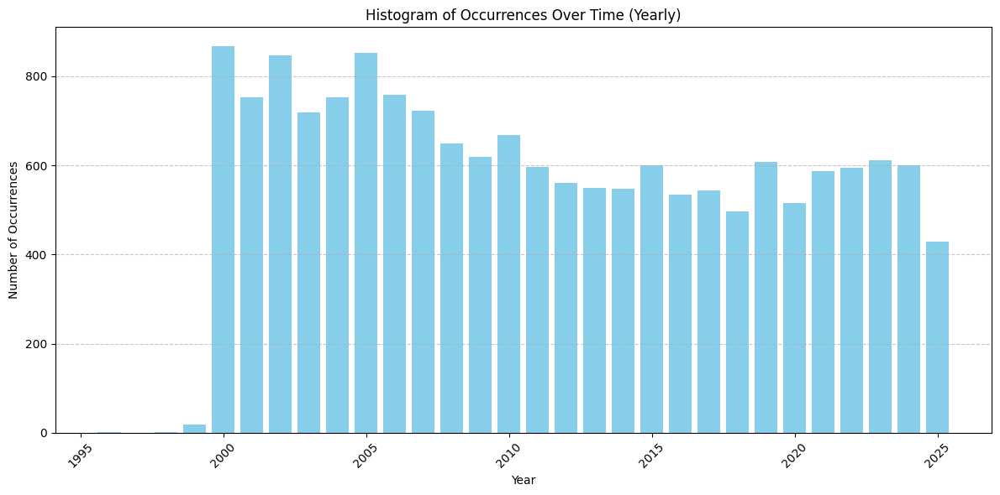

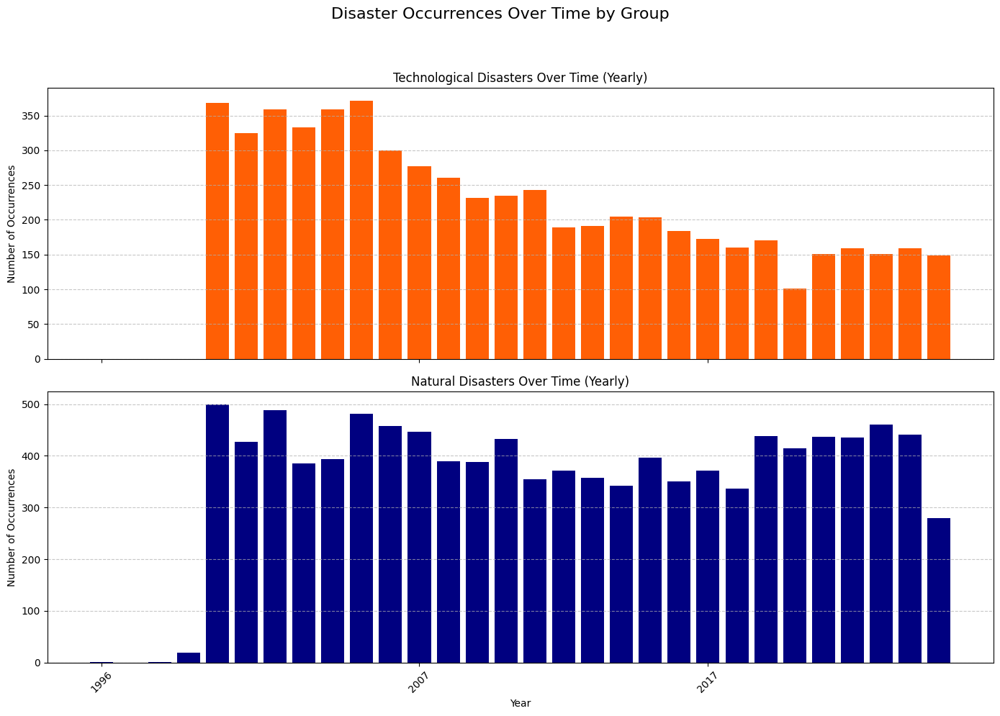

In [212]:
occurrences_by_year = df.group_by('startyear').len().sort('startyear')
plt.figure(figsize=(12, 6))
plt.bar(occurrences_by_year['startyear'], occurrences_by_year['len'], color='skyblue')
plt.xlabel('Year')
plt.ylabel('Number of Occurrences')
plt.title('Histogram of Occurrences Over Time (Yearly)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


occurrences_by_year_tech = df_technological.group_by('startyear').len().sort('startyear')
occurrences_by_year_natural = df_natural.group_by('startyear').len().sort('startyear')
fig, axes = plt.subplots(2, 1, figsize=(14, 10), sharex=True)

# --- Plot 1: Technological Disasters (Top Subplot) ---
ax0 = axes[0] # Select the top subplot
ax0.bar(occurrences_by_year_tech['startyear'], occurrences_by_year_tech['len'], color='#FF5F05')
ax0.set_ylabel('Number of Occurrences')
ax0.set_title('Technological Disasters Over Time (Yearly)')
ax0.grid(axis='y', linestyle='--', alpha=0.7)

# --- Plot 2: Natural Disasters (Bottom Subplot) ---
ax1 = axes[1] # Select the bottom subplot
ax1.bar(occurrences_by_year_natural['startyear'], occurrences_by_year_natural['len'], color='navy')
ax1.set_xlabel('Year') # Only the bottom plot needs the x-label
ax1.set_ylabel('Number of Occurrences')
ax1.set_title('Natural Disasters Over Time (Yearly)')
ax1.set_xticks(occurrences_by_year_natural['startyear'].unique().to_numpy()[::10]) # show fewer x-ticks for readability
ax1.tick_params(axis='x', rotation=45) # Rotate x-axis labels
ax1.grid(axis='y', linestyle='--', alpha=0.7)

# --- Adjust Layout and Show ---
plt.suptitle('Disaster Occurrences Over Time by Group', fontsize=16, y=1.02) # Main title for the figure
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to prevent overlapping, leaving space for suptitle
plt.show()

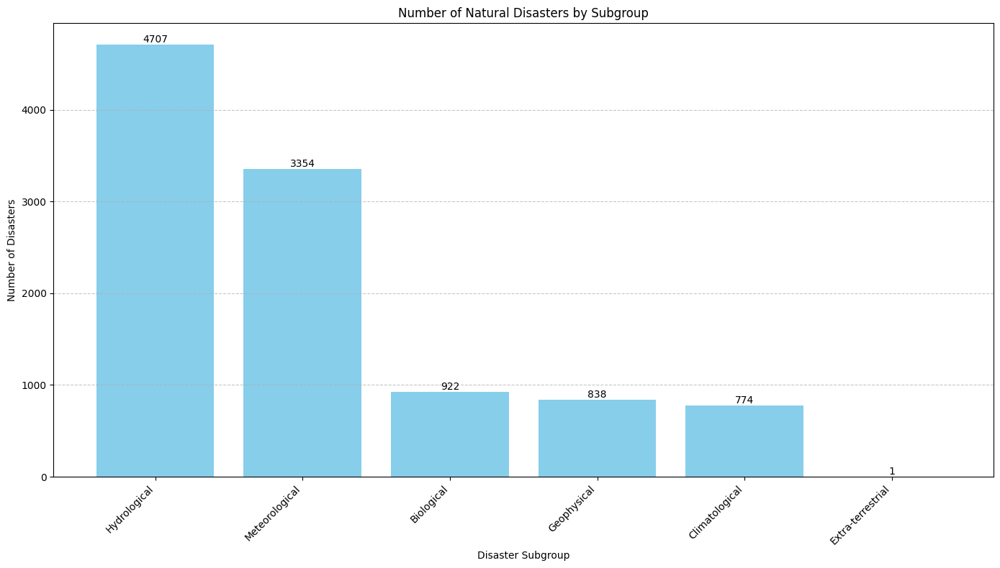

In [84]:
natural_subgroup_counts  = df_natural.group_by('Disaster Subgroup').len().sort('len', descending=True)


# Prepare data for plotting
subgroups = natural_subgroup_counts['Disaster Subgroup'].to_numpy()
counts = natural_subgroup_counts['len'].to_numpy()

# Create the bar chart
plt.figure(figsize=(14, 8)) # Adjust figure size for better readability of labels
bars = plt.bar(subgroups, counts, color='skyblue')

# Add labels to the chart
plt.xlabel('Disaster Subgroup')
plt.ylabel('Number of Disasters')
plt.title('Number of Natural Disasters by Subgroup')
plt.xticks(rotation=45, ha='right') # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add text labels on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 0.5, round(yval), ha='center', va='bottom') # +0.5 to lift label slightly

plt.tight_layout() # Adjust layout to prevent labels from overlapping
plt.show()

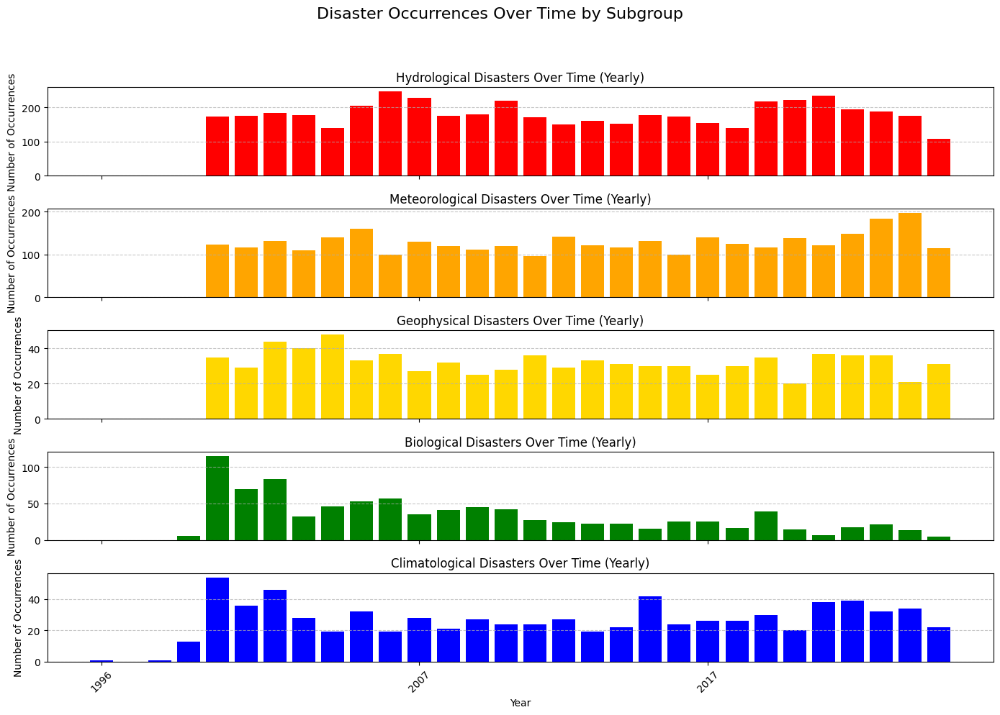

In [85]:
df_hydro = df_natural.filter(pl.col('Disaster Subgroup') == 'Hydrological')
df_meteo = df_natural.filter(pl.col('Disaster Subgroup') == 'Meteorological')
df_geoph = df_natural.filter(pl.col('Disaster Subgroup') == 'Geophysical')
df_biolo = df_natural.filter(pl.col('Disaster Subgroup') == 'Biological')
df_clima = df_natural.filter(pl.col('Disaster Subgroup') == 'Climatological')

occurrences_by_year_hydro = df_hydro.group_by('startyear').len().sort('startyear')
occurrences_by_year_meteo = df_meteo.group_by('startyear').len().sort('startyear')
occurrences_by_year_geoph = df_geoph.group_by('startyear').len().sort('startyear')
occurrences_by_year_biolo = df_biolo.group_by('startyear').len().sort('startyear')
occurrences_by_year_clima = df_clima.group_by('startyear').len().sort('startyear')
fig, axes = plt.subplots(5, 1, figsize=(14, 10), sharex=True)

# --- Plot 1: Hydrological Disasters ---
ax0 = axes[0] # Select the top subplot
ax0.bar(occurrences_by_year_hydro['startyear'], occurrences_by_year_hydro['len'], color='red')
ax0.set_ylabel('Number of Occurrences')
ax0.set_title('Hydrological Disasters Over Time (Yearly)')
ax0.set_xticks(occurrences_by_year_hydro['startyear'].unique().to_numpy()[::10])
ax0.tick_params(axis='x', rotation=45) # Rotate x-axis labels
ax0.grid(axis='y', linestyle='--', alpha=0.7)

# --- Plot 2: Meteorological Disasters ---
ax1 = axes[1] # Select the bottom subplot
ax1.bar(occurrences_by_year_meteo['startyear'], occurrences_by_year_meteo['len'], color='orange')
ax1.set_ylabel('Number of Occurrences')
ax1.set_title('Meteorological Disasters Over Time (Yearly)')
ax1.set_xticks(occurrences_by_year_meteo['startyear'].unique().to_numpy()[::10])
ax1.tick_params(axis='x', rotation=45) # Rotate x-axis labels
ax1.grid(axis='y', linestyle='--', alpha=0.7)

# --- Plot 3: Geophysical Disasters ---
ax2 = axes[2] # Select the bottom subplot
ax2.bar(occurrences_by_year_geoph['startyear'], occurrences_by_year_geoph['len'], color='gold')
ax2.set_ylabel('Number of Occurrences')
ax2.set_title('Geophysical Disasters Over Time (Yearly)')
ax2.set_xticks(occurrences_by_year_geoph['startyear'].unique().to_numpy()[::10])
ax2.tick_params(axis='x', rotation=45) # Rotate x-axis labels
ax2.grid(axis='y', linestyle='--', alpha=0.7)

# --- Plot 4: Biological Disasters ---
ax3 = axes[3] # Select the bottom subplot
ax3.bar(occurrences_by_year_biolo['startyear'], occurrences_by_year_biolo['len'], color='green')
ax3.set_ylabel('Number of Occurrences')
ax3.set_title('Biological Disasters Over Time (Yearly)')
ax3.set_xticks(occurrences_by_year_biolo['startyear'].unique().to_numpy()[::10])
ax3.tick_params(axis='x', rotation=45) # Rotate x-axis labels
ax3.grid(axis='y', linestyle='--', alpha=0.7)

# --- Plot 5: Climatological Disasters ---
ax4 = axes[4] # Select the bottom subplot
ax4.bar(occurrences_by_year_clima['startyear'], occurrences_by_year_clima['len'], color='blue')
ax4.set_xlabel('Year') # Only the bottom plot needs the x-label
ax4.set_ylabel('Number of Occurrences')
ax4.set_title('Climatological Disasters Over Time (Yearly)')
ax4.set_xticks(occurrences_by_year_clima['startyear'].unique().to_numpy()[::10])
ax4.tick_params(axis='x', rotation=45) # Rotate x-axis labels
ax4.grid(axis='y', linestyle='--', alpha=0.7)


# --- Adjust Layout and Show ---
plt.suptitle('Disaster Occurrences Over Time by Subgroup', fontsize=16, y=1.02) # Main title for the figure
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to prevent overlapping, leaving space for suptitle
plt.show()

C:\Users\cardi\AppData\Local\Temp\ipykernel_34740\1513191490.py:3: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  .agg(pl.count(), pl.col('Total Deaths').sum(),


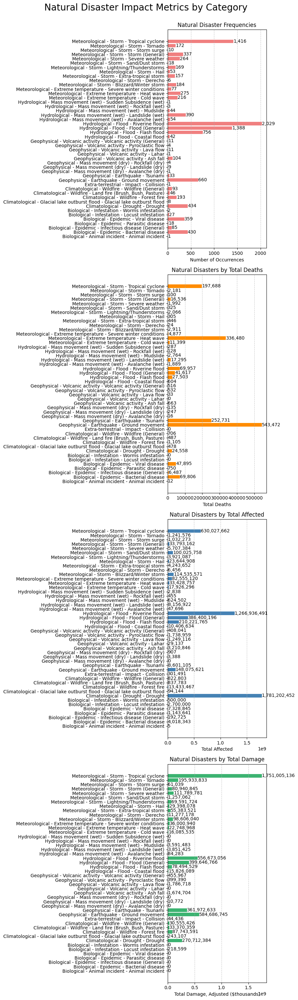

In [98]:
df_natural_summary = (
    df_natural.group_by(['Disaster Subgroup', 'Disaster Type', 'Disaster Subtype'])
    .agg(pl.count(), pl.col('Total Deaths').sum(),
         pl.col('Total Affected').sum(),
         pl.col(r"Total Damage, Adjusted ('000 US$)").sum()
    )
    .sort('Disaster Subgroup', 'Disaster Type', 'Disaster Subtype')
)

df_natural_summary = df_natural_summary.with_columns(
    pl.format(
        "{} - {} - {}",
        pl.col('Disaster Subgroup'),
        pl.col('Disaster Type'),
        pl.col('Disaster Subtype')
    ).alias('combined_label')
)

labels = df_natural_summary['combined_label'].to_numpy()
counts = df_natural_summary['count'].to_numpy()
deaths = df_natural_summary['Total Deaths'].to_numpy()
affected = df_natural_summary['Total Affected'].to_numpy()
damage = df_natural_summary['Total Damage, Adjusted (\'000 US$)'].to_numpy()

# --- Create Subplots (2 rows, 2 columns) ---
fig, axes = plt.subplots(4, 1, figsize=(9, 32)) # Increased figure size

# Flatten axes array for easier iteration if needed, or access by [row, col]
# axes = axes.flatten()

# --- Plot 1: Occurrences ---
ax1 = axes[0]
bars1 = ax1.barh(labels, counts, color='lightcoral')
ax1.set_xlabel('Number of Occurrences')
ax1.set_title('Natural Disaster Frequencies')
ax1.grid(axis='x', linestyle='--', alpha=0.7)
# Add text labels
for bar in bars1:
    ax1.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
             f'{int(bar.get_width()):,}', va='center', ha='left')

# --- Plot 2: Total Deaths ---
ax2 = axes[1]
bars2 = ax2.barh(labels, deaths, color='darkorange')
ax2.set_xlabel('Total Deaths')
ax2.set_title('Natural Disasters by Total Deaths')
ax2.grid(axis='x', linestyle='--', alpha=0.7)
# Add text labels
for bar in bars2:
    ax2.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
             f'{int(bar.get_width()):,}', va='center', ha='left')

# --- Plot 3: Total Affected ---
ax3 = axes[2]
bars3 = ax3.barh(labels, affected, color='steelblue')
ax3.set_xlabel('Total Affected')
ax3.set_title('Natural Disasters by Total Affected')
ax3.grid(axis='x', linestyle='--', alpha=0.7)
# Add text labels
for bar in bars3:
    ax3.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
             f'{int(bar.get_width()):,}', va='center', ha='left')


# --- Plot 4: Total Damage Adjusted ---
ax4 = axes[3]
bars4 = ax4.barh(labels, damage, color='mediumseagreen')
ax4.set_xlabel("Total Damage, Adjusted ($thousands)")
ax4.set_title('Natural Disasters by Total Damage')
ax4.grid(axis='x', linestyle='--', alpha=0.7)
# Add text labels
for bar in bars4:
    ax4.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
             f'{int(bar.get_width()):,}', va='center', ha='left')

# Adjust layout and display
plt.suptitle('Natural Disaster Impact Metrics by Category', fontsize=20, y=0.98) # Main title for the entire figure
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout, leaving space for suptitle
plt.show()

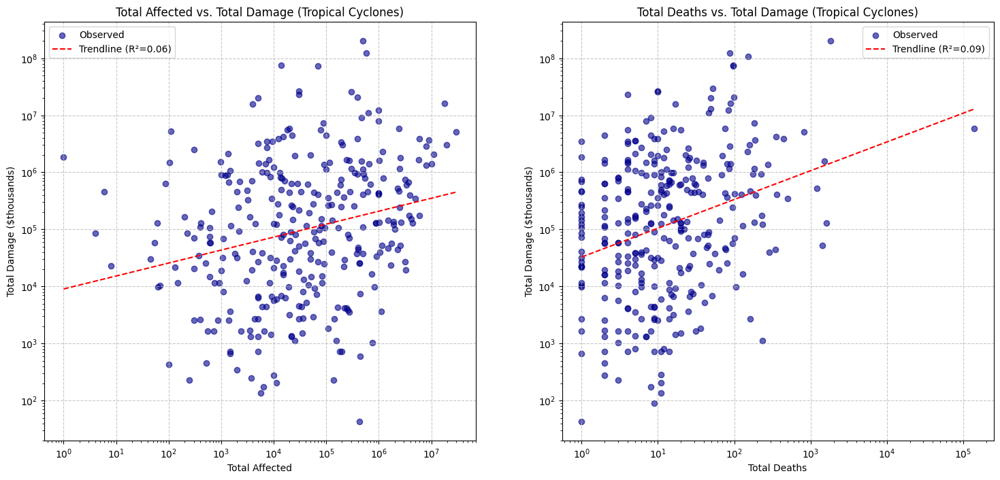

In [8]:
subtype_data1 = (
    df
    .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
    .select('Total Deaths', 'Total Affected', r"Total Damage, Adjusted ('000 US$)", "Country")
    .rename({r"Total Damage, Adjusted ('000 US$)": "Total Damage"})
    .filter(
        (
            # (pl.col('Total Deaths').is_not_null())
            (pl.col('Total Affected').is_not_null())
        ) &
        pl.col('Total Damage') > 0
    )
)
subtype_data2 = (
    df
    .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
    .select('Total Deaths', 'Total Affected', r"Total Damage, Adjusted ('000 US$)", "Country")
    .rename({r"Total Damage, Adjusted ('000 US$)": "Total Damage"})
    .filter(
        (
            (pl.col('Total Deaths').is_not_null())
            # (pl.col('Total Affected').is_not_null())
        ) &
        pl.col('Total Damage') > 0
    )
)

fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ax1 = axes[0]
ax1.scatter(subtype_data1['Total Affected'],
            subtype_data1['Total Damage'],
            alpha=0.6, color='darkblue',
            label='Observed')

log_x_affected = np.log10(subtype_data1['Total Affected'].to_numpy())
log_y_damage_affected = np.log10(subtype_data1['Total Damage'].to_numpy())
X_affected = sm.add_constant(log_x_affected)
model_affected = sm.OLS(log_y_damage_affected, X_affected).fit()
r_squared_affected = model_affected.rsquared
trend_x_aff_plot = np.linspace(subtype_data1['Total Affected'].min(), subtype_data1['Total Affected'].max(), 100)
log_trend_x_aff_predict = sm.add_constant(np.log10(trend_x_aff_plot))
log_trend_y_aff_predict = model_affected.predict(log_trend_x_aff_predict)
trend_y_aff_plot = 10**log_trend_y_aff_predict

ax1.plot(trend_x_aff_plot, trend_y_aff_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_affected:.2f})')

ax1.set_xlabel('Total Affected')
ax1.set_ylabel("Total Damage ($thousands)")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_title('Total Affected vs. Total Damage (Tropical Cyclones)')
ax1.legend()
ax2 = axes[1]
ax2.scatter(subtype_data2['Total Deaths'],
            subtype_data2['Total Damage'],
            alpha=0.6, color='darkblue',
            label='Observed')

log_x_deaths = np.log10(subtype_data2['Total Deaths'].to_numpy())
log_y_damage_deaths = np.log10(subtype_data2['Total Damage'].to_numpy())
X_deaths = sm.add_constant(log_x_deaths)
model_deaths = sm.OLS(log_y_damage_deaths, X_deaths).fit()
r_squared_deaths = model_deaths.rsquared
trend_x_death_plot = np.linspace(subtype_data2['Total Deaths'].min(), subtype_data2['Total Deaths'].max(), 100)
log_trend_x_death_predict = sm.add_constant(np.log10(trend_x_death_plot))
log_trend_y_death_predict = model_deaths.predict(log_trend_x_death_predict)
trend_y_death_plot = 10**log_trend_y_death_predict

ax2.plot(trend_x_death_plot, trend_y_death_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_deaths:.2f})')

ax2.set_xlabel('Total Deaths')
ax2.set_ylabel("Total Damage ($thousands)")
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_title('Total Deaths vs. Total Damage (Tropical Cyclones)')
ax2.legend()


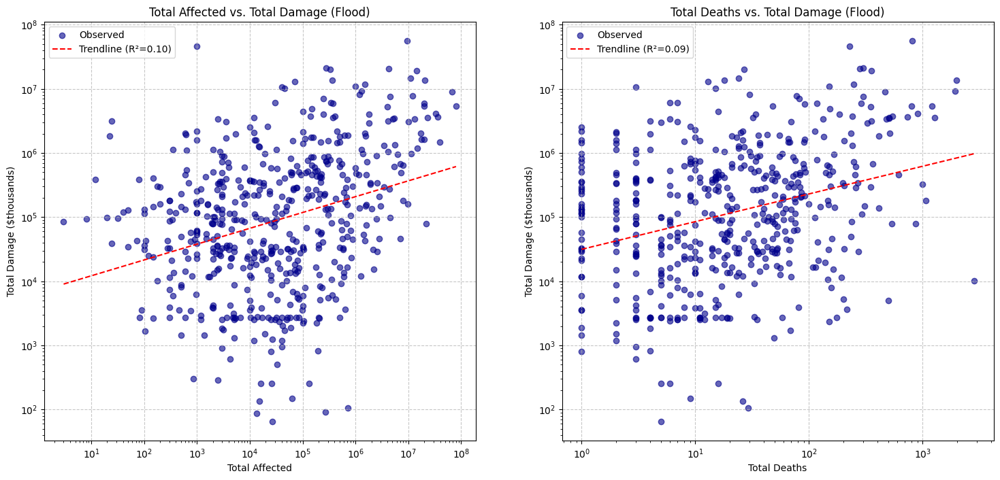

In [9]:
subtype_data1 = (
    df
    .filter(pl.col('Disaster Type') == 'Flood')
    .select('Total Deaths', 'Total Affected', r"Total Damage, Adjusted ('000 US$)", "Country")
    .rename({r"Total Damage, Adjusted ('000 US$)": "Total Damage"})
    .filter(
        (
            # (pl.col('Total Deaths').is_not_null())
            (pl.col('Total Affected').is_not_null())
        ) &
        pl.col('Total Damage') > 0
    )
)
subtype_data2 = (
    df
    .filter(pl.col('Disaster Type') == 'Flood')
    .select('Total Deaths', 'Total Affected', r"Total Damage, Adjusted ('000 US$)", "Country")
    .rename({r"Total Damage, Adjusted ('000 US$)": "Total Damage"})
    .filter(
        (
            (pl.col('Total Deaths').is_not_null())
            # (pl.col('Total Affected').is_not_null())
        ) &
        pl.col('Total Damage') > 0
    )
)

fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ax1 = axes[0]
ax1.scatter(subtype_data1['Total Affected'],
            subtype_data1['Total Damage'],
            alpha=0.6, color='darkblue',
            label='Observed')

log_x_affected = np.log10(subtype_data1['Total Affected'].to_numpy())
log_y_damage_affected = np.log10(subtype_data1['Total Damage'].to_numpy())
X_affected = sm.add_constant(log_x_affected)
model_affected = sm.OLS(log_y_damage_affected, X_affected).fit()
r_squared_affected = model_affected.rsquared
trend_x_aff_plot = np.linspace(subtype_data1['Total Affected'].min(), subtype_data1['Total Affected'].max(), 100)
log_trend_x_aff_predict = sm.add_constant(np.log10(trend_x_aff_plot))
log_trend_y_aff_predict = model_affected.predict(log_trend_x_aff_predict)
trend_y_aff_plot = 10**log_trend_y_aff_predict

ax1.plot(trend_x_aff_plot, trend_y_aff_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_affected:.2f})')

ax1.set_xlabel('Total Affected')
ax1.set_ylabel("Total Damage ($thousands)")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_title('Total Affected vs. Total Damage (Flood)')
ax1.legend()
ax2 = axes[1]
ax2.scatter(subtype_data2['Total Deaths'],
            subtype_data2['Total Damage'],
            alpha=0.6, color='darkblue',
            label='Observed')

log_x_deaths = np.log10(subtype_data2['Total Deaths'].to_numpy())
log_y_damage_deaths = np.log10(subtype_data2['Total Damage'].to_numpy())
X_deaths = sm.add_constant(log_x_deaths)
model_deaths = sm.OLS(log_y_damage_deaths, X_deaths).fit()
r_squared_deaths = model_deaths.rsquared
trend_x_death_plot = np.linspace(subtype_data2['Total Deaths'].min(), subtype_data2['Total Deaths'].max(), 100)
log_trend_x_death_predict = sm.add_constant(np.log10(trend_x_death_plot))
log_trend_y_death_predict = model_deaths.predict(log_trend_x_death_predict)
trend_y_death_plot = 10**log_trend_y_death_predict

ax2.plot(trend_x_death_plot, trend_y_death_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_deaths:.2f})')

ax2.set_xlabel('Total Deaths')
ax2.set_ylabel("Total Damage ($thousands)")
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_title('Total Deaths vs. Total Damage (Flood)')
ax2.legend()


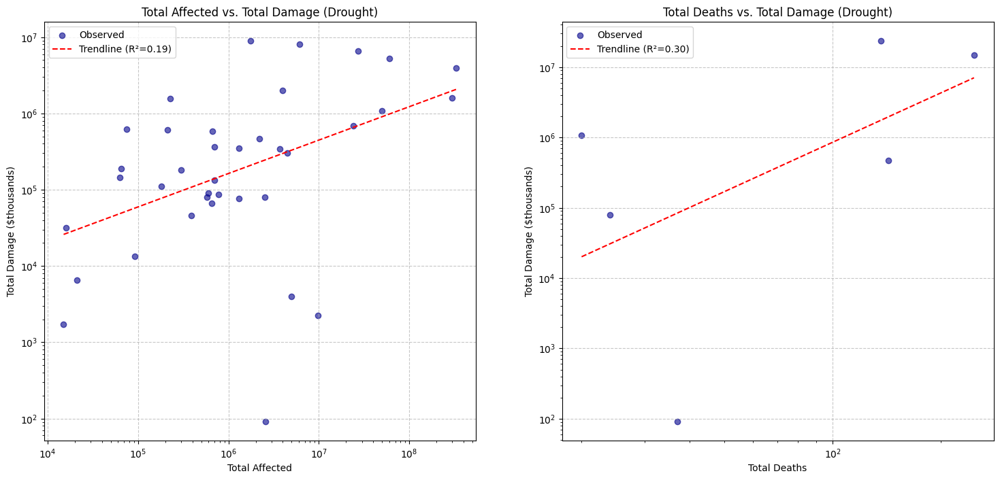

In [10]:
subtype_data1 = (
    df
    .filter(pl.col('Disaster Type') == 'Drought')
    .select('Total Deaths', 'Total Affected', r"Total Damage, Adjusted ('000 US$)", "Country")
    .rename({r"Total Damage, Adjusted ('000 US$)": "Total Damage"})
    .filter(
        (
            # (pl.col('Total Deaths').is_not_null())
            (pl.col('Total Affected').is_not_null())
        ) &
        pl.col('Total Damage') > 0
    )
)
subtype_data2 = (
    df
    .filter(pl.col('Disaster Type') == 'Drought')
    .select('Total Deaths', 'Total Affected', r"Total Damage, Adjusted ('000 US$)", "Country")
    .rename({r"Total Damage, Adjusted ('000 US$)": "Total Damage"})
    .filter(
        (
            (pl.col('Total Deaths').is_not_null())
            # (pl.col('Total Affected').is_not_null())
        ) &
        pl.col('Total Damage') > 0
    )
)

fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ax1 = axes[0]
ax1.scatter(subtype_data1['Total Affected'],
            subtype_data1['Total Damage'],
            alpha=0.6, color='darkblue',
            label='Observed')

log_x_affected = np.log10(subtype_data1['Total Affected'].to_numpy())
log_y_damage_affected = np.log10(subtype_data1['Total Damage'].to_numpy())
X_affected = sm.add_constant(log_x_affected)
model_affected = sm.OLS(log_y_damage_affected, X_affected).fit()
r_squared_affected = model_affected.rsquared
trend_x_aff_plot = np.linspace(subtype_data1['Total Affected'].min(), subtype_data1['Total Affected'].max(), 100)
log_trend_x_aff_predict = sm.add_constant(np.log10(trend_x_aff_plot))
log_trend_y_aff_predict = model_affected.predict(log_trend_x_aff_predict)
trend_y_aff_plot = 10**log_trend_y_aff_predict

ax1.plot(trend_x_aff_plot, trend_y_aff_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_affected:.2f})')

ax1.set_xlabel('Total Affected')
ax1.set_ylabel("Total Damage ($thousands)")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_title('Total Affected vs. Total Damage (Drought)')
ax1.legend()
ax2 = axes[1]
ax2.scatter(subtype_data2['Total Deaths'],
            subtype_data2['Total Damage'],
            alpha=0.6, color='darkblue',
            label='Observed')

log_x_deaths = np.log10(subtype_data2['Total Deaths'].to_numpy())
log_y_damage_deaths = np.log10(subtype_data2['Total Damage'].to_numpy())
X_deaths = sm.add_constant(log_x_deaths)
model_deaths = sm.OLS(log_y_damage_deaths, X_deaths).fit()
r_squared_deaths = model_deaths.rsquared
trend_x_death_plot = np.linspace(subtype_data2['Total Deaths'].min(), subtype_data2['Total Deaths'].max(), 100)
log_trend_x_death_predict = sm.add_constant(np.log10(trend_x_death_plot))
log_trend_y_death_predict = model_deaths.predict(log_trend_x_death_predict)
trend_y_death_plot = 10**log_trend_y_death_predict

ax2.plot(trend_x_death_plot, trend_y_death_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_deaths:.2f})')

ax2.set_xlabel('Total Deaths')
ax2.set_ylabel("Total Damage ($thousands)")
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_title('Total Deaths vs. Total Damage (Drought)')
ax2.legend()


In [11]:
df.head(10).columns

['DisNo.',
 'Historic',
 'Classification Key',
 'Disaster Group',
 'Disaster Subgroup',
 'Disaster Type',
 'Disaster Subtype',
 'External IDs',
 'Event Name',
 'ISO',
 'Country',
 'Subregion',
 'Region',
 'Location',
 'Origin',
 'Associated Types',
 'OFDA/BHA Response',
 'Appeal',
 'Declaration',
 "AID Contribution ('000 US$)",
 'Magnitude',
 'Magnitude Scale',
 'Latitude',
 'Longitude',
 'River Basin',
 'startyear',
 'startmonth',
 'startday',
 'End Year',
 'End Month',
 'End Day',
 'Total Deaths',
 'No. Injured',
 'No. Affected',
 'No. Homeless',
 'Total Affected',
 "Reconstruction Costs ('000 US$)",
 "Reconstruction Costs, Adjusted ('000 US$)",
 "Insured Damage ('000 US$)",
 "Insured Damage, Adjusted ('000 US$)",
 "Total Damage ('000 US$)",
 "Total Damage, Adjusted ('000 US$)",
 'CPI',
 'Admin Units',
 'Entry Date',
 'Last Update',
 'startdate']

In [12]:
subset = (
    df
    .filter(
        (pl.col('Disaster Type') == 'Drought') |
        (pl.col('Disaster Type') == 'Flood') |
        (pl.col('Disaster Subtype') == 'Tropical cyclone')
    )
    .select('Disaster Type', 'Disaster Subtype', 'Total Deaths', 'Total Affected',
            r"Total Damage, Adjusted ('000 US$)", "Country", "End Year", "End Month", 'End Day',
             'startyear', 'startmonth', 'startday', "Longitude", "Latitude")
    .rename({r"Total Damage, Adjusted ('000 US$)": "Total Damage"})
)

In [13]:
def cyclone_damage_corr(country1):
    subtype_data1 = (
        subset
        .filter(pl.col('Country') == country1)
        .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
        .filter(
            (
                # (pl.col('Total Deaths').is_not_null())
                (pl.col('Total Affected').is_not_null())
            ) &
            (pl.col('Total Damage') > 0)
        )
    )
    subtype_data2 = (
        subset
        .filter(pl.col('Country') == country1)
        .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
        .filter(
            (
                (pl.col('Total Deaths').is_not_null())
                # (pl.col('Total Affected').is_not_null())
            ) &
            (pl.col('Total Damage') > 0)
        )
    )

    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    ax1 = axes[0]
    ax1.scatter(subtype_data1['Total Affected'],
                subtype_data1['Total Damage'],
                alpha=0.6, color='darkblue',
                label='Observed')

    log_x_affected = np.log10(subtype_data1['Total Affected'].to_numpy())
    log_y_damage_affected = np.log10(subtype_data1['Total Damage'].to_numpy())
    X_affected = sm.add_constant(log_x_affected)
    model_affected = sm.OLS(log_y_damage_affected, X_affected).fit()
    r_squared_affected = model_affected.rsquared
    trend_x_aff_plot = np.linspace(subtype_data1['Total Affected'].min(), subtype_data1['Total Affected'].max(), 100)
    log_trend_x_aff_predict = sm.add_constant(np.log10(trend_x_aff_plot))
    log_trend_y_aff_predict = model_affected.predict(log_trend_x_aff_predict)
    trend_y_aff_plot = 10**log_trend_y_aff_predict

    ax1.plot(trend_x_aff_plot, trend_y_aff_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_affected:.2f})')

    ax1.set_xlabel('Total Affected')
    ax1.set_ylabel("Total Damage ($thousands)")
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.grid(True, linestyle='--', alpha=0.7)
    title1 = 'Total Affected vs. Total Damage (Tropical Cyclones) -- ' + country1
    ax1.set_title(title1)
    ax1.legend()
    ax2 = axes[1]
    ax2.scatter(subtype_data2['Total Deaths'],
                subtype_data2['Total Damage'],
                alpha=0.6, color='darkblue',
                label='Observed')

    log_x_deaths = np.log10(subtype_data2['Total Deaths'].to_numpy())
    log_y_damage_deaths = np.log10(subtype_data2['Total Damage'].to_numpy())
    X_deaths = sm.add_constant(log_x_deaths)
    model_deaths = sm.OLS(log_y_damage_deaths, X_deaths).fit()
    r_squared_deaths = model_deaths.rsquared
    trend_x_death_plot = np.linspace(subtype_data2['Total Deaths'].min(), subtype_data2['Total Deaths'].max(), 100)
    log_trend_x_death_predict = sm.add_constant(np.log10(trend_x_death_plot))
    log_trend_y_death_predict = model_deaths.predict(log_trend_x_death_predict)
    trend_y_death_plot = 10**log_trend_y_death_predict

    ax2.plot(trend_x_death_plot, trend_y_death_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_deaths:.2f})')

    ax2.set_xlabel('Total Deaths')
    ax2.set_ylabel("Total Damage ($thousands)")
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.grid(True, linestyle='--', alpha=0.7)
    title2 = 'Total Deaths vs. Total Damage (Tropical Cyclones) -- ' + country1
    ax2.set_title(title2)
    ax2.legend()

def flood_damage_corr(country1):

    subtype_data1 = (
        subset
        .filter(pl.col('Country') == country1)
        .filter(pl.col('Disaster Type') == 'Flood')
        .filter(
            (
                # (pl.col('Total Deaths').is_not_null())
                (pl.col('Total Affected').is_not_null())
            ) &
            (pl.col('Total Damage') > 0)
        )
    )
    subtype_data2 = (
        subset
        .filter(pl.col('Country') == country1)
        .filter(pl.col('Disaster Type') == 'Flood')
        .filter(
            (
                (pl.col('Total Deaths').is_not_null())
                # (pl.col('Total Affected').is_not_null())
            ) &
            (pl.col('Total Damage') > 0)
        )
    )

    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    ax1 = axes[0]
    ax1.scatter(subtype_data1['Total Affected'],
                subtype_data1['Total Damage'],
                alpha=0.6, color='darkblue',
                label='Observed')

    log_x_affected = np.log10(subtype_data1['Total Affected'].to_numpy())
    log_y_damage_affected = np.log10(subtype_data1['Total Damage'].to_numpy())
    X_affected = sm.add_constant(log_x_affected)
    model_affected = sm.OLS(log_y_damage_affected, X_affected).fit()
    r_squared_affected = model_affected.rsquared
    trend_x_aff_plot = np.linspace(subtype_data1['Total Affected'].min(), subtype_data1['Total Affected'].max(), 100)
    log_trend_x_aff_predict = sm.add_constant(np.log10(trend_x_aff_plot))
    log_trend_y_aff_predict = model_affected.predict(log_trend_x_aff_predict)
    trend_y_aff_plot = 10**log_trend_y_aff_predict

    ax1.plot(trend_x_aff_plot, trend_y_aff_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_affected:.2f})')

    ax1.set_xlabel('Total Affected')
    ax1.set_ylabel("Total Damage ($thousands)")
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.grid(True, linestyle='--', alpha=0.7)
    title1 = 'Total Affected vs. Total Damage (Flood) -- ' + country1
    ax1.set_title(title1)
    ax1.legend()
    ax2 = axes[1]
    ax2.scatter(subtype_data2['Total Deaths'],
                subtype_data2['Total Damage'],
                alpha=0.6, color='darkblue',
                label='Observed')

    log_x_deaths = np.log10(subtype_data2['Total Deaths'].to_numpy())
    log_y_damage_deaths = np.log10(subtype_data2['Total Damage'].to_numpy())
    X_deaths = sm.add_constant(log_x_deaths)
    model_deaths = sm.OLS(log_y_damage_deaths, X_deaths).fit()
    r_squared_deaths = model_deaths.rsquared
    trend_x_death_plot = np.linspace(subtype_data2['Total Deaths'].min(), subtype_data2['Total Deaths'].max(), 100)
    log_trend_x_death_predict = sm.add_constant(np.log10(trend_x_death_plot))
    log_trend_y_death_predict = model_deaths.predict(log_trend_x_death_predict)
    trend_y_death_plot = 10**log_trend_y_death_predict

    ax2.plot(trend_x_death_plot, trend_y_death_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_deaths:.2f})')

    ax2.set_xlabel('Total Deaths')
    ax2.set_ylabel("Total Damage ($thousands)")
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.grid(True, linestyle='--', alpha=0.7)
    title2 = 'Total Deaths vs. Total Damage (Flood) -- ' + country1
    ax2.set_title(title2)
    ax2.legend()

def drought_damage_corr(country1):
    subtype_data1 = (
        subset
        .filter(pl.col('Country') == country1)
        .filter(pl.col('Disaster Type') == 'Drought')
        .filter(
            (
                # (pl.col('Total Deaths').is_not_null())
                (pl.col('Total Affected').is_not_null())
            ) &
            (pl.col('Total Damage') > 0)
        )
    )
    subtype_data2 = (
        subset
        .filter(pl.col('Country') == country1)
        .filter(pl.col('Disaster Type') == 'Drought')
        .filter(
            (
                (pl.col('Total Deaths').is_not_null())
                # (pl.col('Total Affected').is_not_null())
            ) &
            (pl.col('Total Damage') > 0)
        )
    )

    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    ax1 = axes[0]
    ax1.scatter(subtype_data1['Total Affected'],
                subtype_data1['Total Damage'],
                alpha=0.6, color='darkblue',
                label='Observed')

    log_x_affected = np.log10(subtype_data1['Total Affected'].to_numpy())
    log_y_damage_affected = np.log10(subtype_data1['Total Damage'].to_numpy())
    X_affected = sm.add_constant(log_x_affected)
    model_affected = sm.OLS(log_y_damage_affected, X_affected).fit()
    r_squared_affected = model_affected.rsquared
    trend_x_aff_plot = np.linspace(subtype_data1['Total Affected'].min(), subtype_data1['Total Affected'].max(), 100)
    log_trend_x_aff_predict = sm.add_constant(np.log10(trend_x_aff_plot))
    log_trend_y_aff_predict = model_affected.predict(log_trend_x_aff_predict)
    trend_y_aff_plot = 10**log_trend_y_aff_predict

    ax1.plot(trend_x_aff_plot, trend_y_aff_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_affected:.2f})')

    ax1.set_xlabel('Total Affected')
    ax1.set_ylabel("Total Damage ($thousands)")
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.grid(True, linestyle='--', alpha=0.7)
    title1 = 'Total Affected vs. Total Damage (Drought) -- ' + country1
    ax1.set_title(title1)
    ax1.legend()
    ax2 = axes[1]
    ax2.scatter(subtype_data2['Total Deaths'],
                subtype_data2['Total Damage'],
                alpha=0.6, color='darkblue',
                label='Observed')

    log_x_deaths = np.log10(subtype_data2['Total Deaths'].to_numpy())
    log_y_damage_deaths = np.log10(subtype_data2['Total Damage'].to_numpy())
    X_deaths = sm.add_constant(log_x_deaths)
    model_deaths = sm.OLS(log_y_damage_deaths, X_deaths).fit()
    r_squared_deaths = model_deaths.rsquared
    trend_x_death_plot = np.linspace(subtype_data2['Total Deaths'].min(), subtype_data2['Total Deaths'].max(), 100)
    log_trend_x_death_predict = sm.add_constant(np.log10(trend_x_death_plot))
    log_trend_y_death_predict = model_deaths.predict(log_trend_x_death_predict)
    trend_y_death_plot = 10**log_trend_y_death_predict

    ax2.plot(trend_x_death_plot, trend_y_death_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_deaths:.2f})')

    ax2.set_xlabel('Total Deaths')
    ax2.set_ylabel("Total Damage ($thousands)")
    ax2.set_xscale('log')
    ax2.set_yscale('log')
    ax2.grid(True, linestyle='--', alpha=0.7)
    title2 = 'Total Deaths vs. Total Damage (Drought) -- ' + country1
    ax2.set_title(title2)
    ax2.legend()



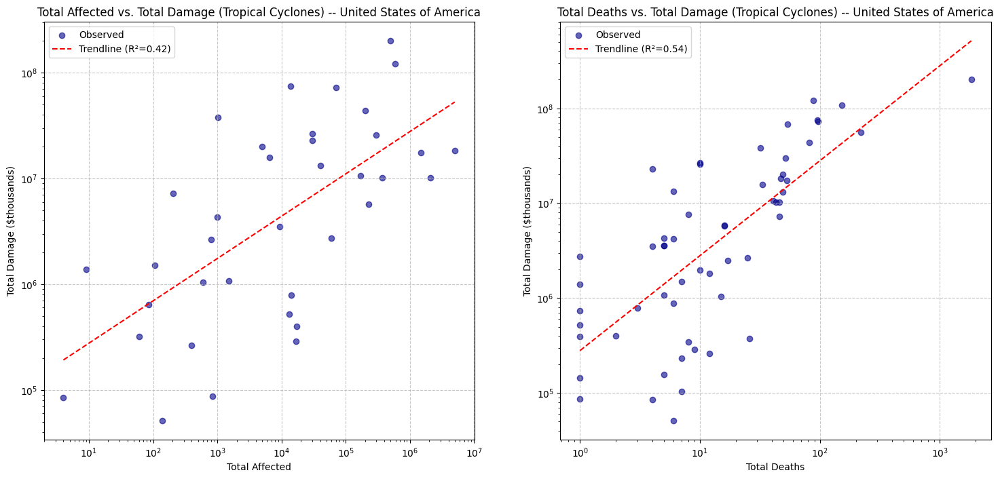

In [14]:
# flood_damage_corr("India")
cyclone_damage_corr("United States of America")

In [15]:
file_path = '../.data/GDPperCapita.csv' # https://data.worldbank.org/indicator/NY.GDP.PCAP.KD (constant 2015 $)
GDPperCapita = (
    pl.read_csv(file_path, skip_lines =4 , has_header=True)
    .drop('Indicator Name', 'Indicator Code', 'Country Code')
    .unpivot(
        index=['Country Name'],
        variable_name='year',
        value_name='GDPperCapita'
    )
)
GDPperCapita.head(10)

Country Name,year,GDPperCapita
str,str,f64
"""Aruba""","""1960""",null
"""Africa Eastern and Southern""","""1960""",1172.243576
"""Afghanistan""","""1960""",null
"""Africa Western and Central""","""1960""",1122.268548
"""Angola""","""1960""",null
"""Albania""","""1960""",null
"""Andorra""","""1960""",null
"""Arab World""","""1960""",null
"""United Arab Emirates""","""1960""",null


In [ ]:
file_path = '../.data/WITS-Country-Timeseries.csv' # https://wits.worldbank.org/CountryProfile/en/Country/BY-COUNTRY/StartYear/1988/EndYear/2022/Indicator/NY-GDP-PCAP-KD#
file_path = '../.data/GDPperCapita.csv' # https://data.worldbank.org/indicator/NY.GDP.PCAP.KD (constant 2015 $), pulled on 7/30/2025
GDPperCapita = (
    pl.read_csv(file_path, skip_lines =4 , has_header=True)
    .drop('Indicator Name', 'Indicator Code', 'Country Code')
    .unpivot(
        index=['Country Name'],
        variable_name='year',
        value_name='GDPperCapita'
    )
    .rename({'Country Name': 'Country'})
    .with_columns(
        pl.col('year').str.extract(r'(\d{4})').cast(pl.Int64),
        pl.when(
            pl.col('Country') == 'Bahamas, The'
        )
        .then(pl.lit('Bahamas'))
        .when(
            pl.col('Country') == 'Cape Verde'
        )
        .then(pl.lit('Cabo Verde'))
        .when(
            pl.col('Country') == 'Congo, Rep.'
        )
        .then(pl.lit('Congo'))
        .when(
            pl.col('Country') == 'Congo, Dem. Rep.'
        )
        .then(pl.lit('Democratic Republic of the Congo'))
        .when(
            pl.col('Country') == 'Czech Republic'
        )
        .then(pl.lit('Czechia'))
        .when(
            pl.col('Country') == 'Cote d\'Ivoire'
        )
        .then(pl.lit("Côte d’Ivoire"))
        .when(
            pl.col('Country') == 'East Timor'
        )
        .then(pl.lit('Timor-Leste'))
        .when(
            pl.col('Country') == 'Egypt, Arab Rep.'
        )
        .then(pl.lit('Egypt'))
        .when(
            pl.col('Country') == 'Ethiopia(excludes Eritrea)'
        )
        .then(pl.lit('Ethiopia'))
        .when(
            pl.col('Country') == 'Gambia, The'
        )
        .then(pl.lit('Gambia'))
        .when(pl.col('Country').str.contains('Iran'))
        .then(pl.lit('Iran'))
        .when(pl.col('Country').str.contains('Kyrgyz'))
        .then(pl.lit('Kyrgyzstan'))
        .when(pl.col('Country').str.contains('Lao P'))
        .then(pl.lit('Laos'))
        .when(pl.col('Country').str.contains('Micronesia'))
        .then(pl.lit('Micronesia'))
        .when(
            pl.col('Country') == 'Korea, Rep.'
        )
        .then(pl.lit('Republic of Korea'))
        .when(
            pl.col('Country') == 'Serbia, FR(Serbia/Montenegro)'
        )
        .then(pl.lit('Serbia'))
        .when(
            pl.col('Country') == 'Slovak Republic'
        )
        .then(pl.lit('Slovakia'))
        .when(
            pl.col('Country') == 'Occ.Pal.Terr'
        )
        .then(pl.lit('State of Palestine'))
        .when(pl.col('Country').str.contains('Venezuela'))
        .then(pl.lit('Venezuela'))
        .when(pl.col('Country').str.contains('Yemen'))
        .then(pl.lit('Yemen'))
        .when(pl.col('Country') == 'Turkiye')
        .then(pl.lit('Türkiye'))
        .when(pl.col('Country') == "Korea, Dem. People's Rep.")
        .then(pl.lit("Democratic People's Republic of Korea"))
        .when(pl.col('Country') == 'Viet Nam')
        .then(pl.lit('Vietnam'))
        .otherwise(pl.col('Country'))
        .alias('Country')
    )
)

subset_with_GDP = (
    subset
    .with_columns(
        pl.when(pl.col('Country').str.contains('Bolivia'))
        .then(pl.lit('Bolivia'))
        .when(pl.col('Country').str.contains('Hong Kong'))
        .then(pl.lit('Hong Kong'))
        .when(pl.col('Country').str.contains('Macao'))
        .then(pl.lit('Macao'))
        .when(pl.col('Country').str.contains('Iran'))
        .then(pl.lit('Iran'))
        .when(pl.col('Country').str.contains('Lao P'))
        .then(pl.lit('Laos'))
        .when(pl.col('Country').str.contains('Micronesia'))
        .then(pl.lit('Micronesia'))
        .when(pl.col('Country').str.contains('Netherlands'))
        .then(pl.lit('Netherlands'))
        .when(pl.col('Country').str.contains('Moldova'))
        .then(pl.lit('Moldova'))
        .when(pl.col('Country').str.contains('Kitts and Nevis'))
        .then(pl.lit('St. Kitts and Nevis'))
        .when(pl.col('Country').str.contains('Vincent and the Grenadines'))
        .then(pl.lit('St. Vincent and the Grenadines'))
        .when(pl.col('Country').str.contains('Lucia'))
        .then(pl.lit('St. Lucia'))
        .when(pl.col('Country').str.contains('United Kingdom of Great Britain'))
        .then(pl.lit('United Kingdom'))
        .when(pl.col('Country').str.contains('Tanzania'))
        .then(pl.lit('Tanzania'))
        .when(pl.col('Country').str.contains('Venezuela'))
        .then(pl.lit('Venezuela'))
        .when(pl.col('Country') == "United States of America")
        .then(pl.lit("United States"))
        .when(pl.col('Country') == 'Viet Nam')
        .then(pl.lit('Vietnam'))
        .otherwise(pl.col('Country'))
        .alias('Country')
    )
    .rename({'End Year': 'year', 'End Month': 'month', 'End Day': 'day'})
    .join(
        GDPperCapita,
        on=['Country', 'year'],
        how="left"
    )
    .with_columns(
        (pl.col('Total Affected') * pl.col('GDPperCapita'))
        .alias('GDP Affected'),
        (pl.col('Total Deaths') * pl.col('GDPperCapita'))
        .alias('GDP Deaths')
    )
)



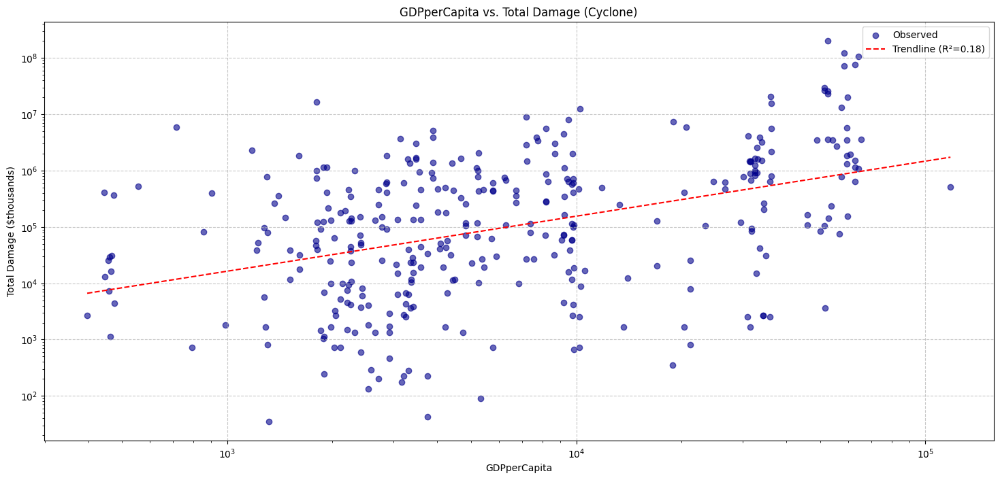

In [17]:
x_axis_var = "GDPperCapita"

subtype_data1 = (
    subset_with_GDP
    .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
    # .filter(pl.col('Disaster Type') == 'Flood')
    # .filter(pl.col('Disaster Type') == 'Drought')
    .select('Total Deaths', 'GDP Deaths', 'GDP Affected', "Total Damage", "Country", "GDPperCapita")
    .filter(
        (
            # (pl.col('Total Deaths').is_not_null())
            (pl.col(x_axis_var).is_not_null())
        ) &
        pl.col('Total Damage') > 0
    )
)

fig, axes = plt.subplots(1, 1, figsize=(18, 8))
ax1 = axes
ax1.scatter(subtype_data1[x_axis_var],
            subtype_data1['Total Damage'],
            alpha=0.6, color='darkblue',
            label='Observed')

log_x_affected = np.log10(subtype_data1[x_axis_var].to_numpy())
log_y_damage_affected = np.log10(subtype_data1['Total Damage'].to_numpy())
X_affected = sm.add_constant(log_x_affected)
model_affected = sm.OLS(log_y_damage_affected, X_affected).fit()
r_squared_affected = model_affected.rsquared
trend_x_aff_plot = np.linspace(subtype_data1[x_axis_var].min(), subtype_data1[x_axis_var].max(), 100)
log_trend_x_aff_predict = sm.add_constant(np.log10(trend_x_aff_plot))
log_trend_y_aff_predict = model_affected.predict(log_trend_x_aff_predict)
trend_y_aff_plot = 10**log_trend_y_aff_predict

ax1.plot(trend_x_aff_plot, trend_y_aff_plot, color='red', linestyle='--', label=f'Trendline (R²={r_squared_affected:.2f})')

ax1.set_xlabel(x_axis_var)
ax1.set_ylabel("Total Damage ($thousands)")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_title(f'{x_axis_var} vs. Total Damage (Cyclone)')
ax1.legend()


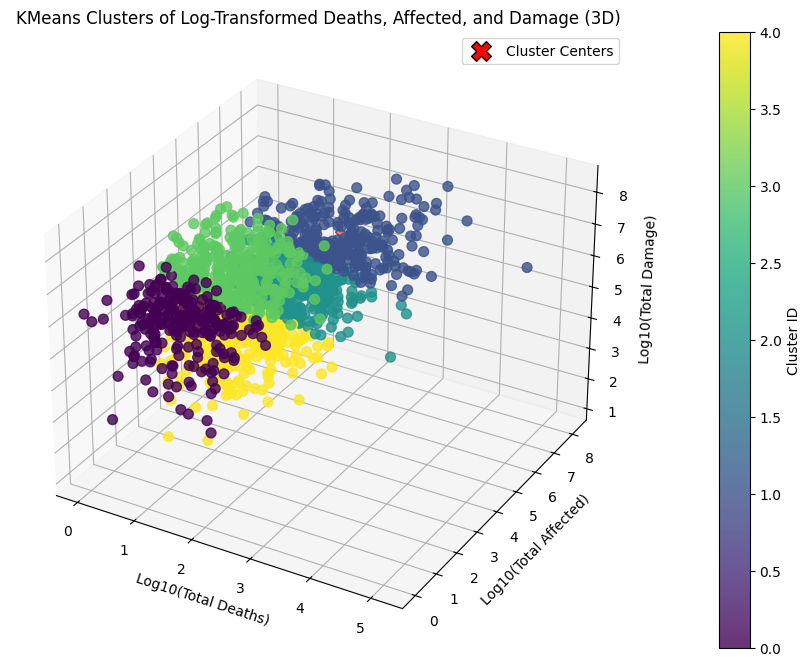

In [18]:
test_data = (
    subset_with_GDP
    # .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
    # .filter(pl.col('Disaster Type') == 'Drought')
    # .filter(pl.col('Disaster Type') == 'Flood')
    # .filter(pl.col('Country') == 'United States')
    # .filter(pl.col('Country') == 'Philippines')
)

filtered_pl_df_for_log  = test_data.filter(
    (pl.col('Total Deaths')>0) &
    (pl.col('Total Affected')>0) &
    (pl.col('Total Damage')>0)
).with_columns([
    (pl.col('Total Deaths')).log10().alias('Log10 Total Deaths'),
    (pl.col('Total Affected')).log10().alias('Log10 Total Affected'),
    (pl.col('Total Damage')).log10().alias('Log10 Total Damage')
]).select('Log10 Total Deaths', 'Log10 Total Affected', 'Log10 Total Damage')

data_for_kmeans_log = filtered_pl_df_for_log.to_numpy()


# Fit KMeans and get cluster labels
kmeans = KMeans(n_clusters=5, random_state=2828, n_init=10)
kmeans.fit(data_for_kmeans_log)
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

# Add cluster labels to the filtered_data DataFrame
plot_df_log = filtered_pl_df_for_log.to_pandas()
plot_df_log['Cluster'] = cluster_labels

# Create the scatter plot with different colors for each cluster
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter_3d = ax.scatter(plot_df_log['Log10 Total Deaths'],
                        plot_df_log['Log10 Total Affected'],
                        plot_df_log['Log10 Total Damage'],
                        c=plot_df_log['Cluster'], cmap='viridis', s=50, alpha=0.8)

# Plot cluster centers
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
            s=200, c='red', marker='X', edgecolors='black', label='Cluster Centers')

# Add labels and title
ax.set_xlabel('Log10(Total Deaths)')
ax.set_ylabel('Log10(Total Affected)')
ax.set_zlabel('Log10(Total Damage)')
ax.set_title('KMeans Clusters of Log-Transformed Deaths, Affected, and Damage (3D)')
cbar = fig.colorbar(scatter_3d, ax=ax, pad=0.1)
cbar.set_label('Cluster ID')
plt.legend()
plt.grid(True)


# Save the plot
plt.show()

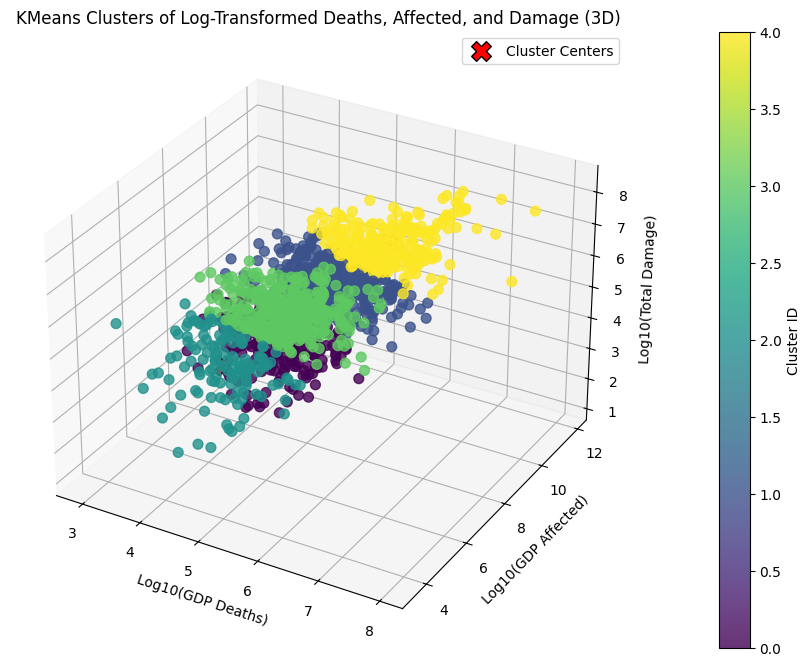

In [19]:
test_data = (
    subset_with_GDP
    # .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
    # .filter(pl.col('Disaster Type') == 'Drought')
    # .filter(pl.col('Disaster Type') == 'Flood')
    # .filter(pl.col('Country') == 'United States')
    # .filter(pl.col('Country') == 'Philippines')
)

filtered_pl_df_for_log  = test_data.filter(
    (pl.col('GDP Deaths')>0) &
    (pl.col('GDP Affected')>0) &
    (pl.col('Total Damage')>0)
).with_columns([
    (pl.col('GDP Deaths')).log10().alias('Log10 GDP Deaths'),
    (pl.col('GDP Affected')).log10().alias('Log10 GDP Affected'),
    (pl.col('Total Damage')).log10().alias('Log10 Total Damage')
]).select('Log10 GDP Deaths', 'Log10 GDP Affected', 'Log10 Total Damage')

data_for_kmeans_log = filtered_pl_df_for_log.to_numpy()


# Fit KMeans and get cluster labels
kmeans = KMeans(n_clusters=5, random_state=2828, n_init=10)
kmeans.fit(data_for_kmeans_log)
cluster_labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

# Add cluster labels to the filtered_data DataFrame
plot_df_log = filtered_pl_df_for_log.to_pandas()
plot_df_log['Cluster'] = cluster_labels

# Create the scatter plot with different colors for each cluster
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')
scatter_3d = ax.scatter(plot_df_log['Log10 GDP Deaths'],
                        plot_df_log['Log10 GDP Affected'],
                        plot_df_log['Log10 Total Damage'],
                        c=plot_df_log['Cluster'], cmap='viridis', s=50, alpha=0.8)

# Plot cluster centers
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
            s=200, c='red', marker='X', edgecolors='black', label='Cluster Centers')

# Add labels and title
ax.set_xlabel('Log10(GDP Deaths)')
ax.set_ylabel('Log10(GDP Affected)')
ax.set_zlabel('Log10(Total Damage)')
ax.set_title('KMeans Clusters of Log-Transformed Deaths, Affected, and Damage (3D)')
cbar = fig.colorbar(scatter_3d, ax=ax, pad=0.1)
cbar.set_label('Cluster ID')
plt.legend()
plt.grid(True)


# Save the plot
plt.show()

In [20]:
subset_with_GDP.head(10)

Disaster Type,Disaster Subtype,Total Deaths,Total Affected,Total Damage,Country,year,month,day,startyear,startmonth,startday,Longitude,Latitude,GDPperCapita,GDP Affected,GDP Deaths
str,str,i64,i64,i64,str,i64,i64,i64,i64,i64,i64,f64,f64,f64,f64,f64
"""Drought""","""Drought""",null,3000000,null,"""Tanzania""",2000,null,null,1996,null,null,null,null,555.348084,1.6660e9,null
"""Drought""","""Drought""",null,null,null,"""Iraq""",2001,null,null,1998,null,null,null,null,4116.094053,null,null
"""Drought""","""Drought""",null,null,470792,"""Uruguay""",2000,null,null,1999,6,null,null,null,11096.33096,null,null
"""Drought""","""Drought""",null,37000000,6214458,"""Iran""",2001,null,null,1999,4,null,null,null,3917.299355,1.4494e11,null
"""Drought""","""Drought""",143,2200000,465143,"""Pakistan""",2003,null,null,1999,11,null,null,null,1090.27524,2.3986e9,155909.35932
"""Drought""","""Drought""",null,329000,null,"""Syrian Arab Republic""",2000,null,null,1999,5,null,null,null,1248.384883,4.1072e8,null
"""Drought""","""Drought""",null,65000,188317,"""Mexico""",2000,null,null,1999,5,null,null,null,9581.969702,6.2283e8,null
"""Drought""","""Drought""",null,275000,1694852,"""Morocco""",2001,null,null,1999,6,null,null,null,2078.966064,5.7172e8,null
"""Drought""","""Drought""",6,650000,null,"""Burundi""",2001,null,null,1999,10,null,null,null,300.799883,1.9552e8,1804.799297


## Fill Missing Data

Use a GLM to fill missing damage data.

In [21]:
glm_data_cyclones = (
    subset_with_GDP
    .filter(pl.col('GDP Deaths').is_not_null())
    .filter(pl.col('GDP Affected').is_not_null())
    .filter(pl.col('GDPperCapita').is_not_null())
    .filter(pl.col('Total Deaths').is_not_null())
    .filter(pl.col('Total Affected').is_not_null())
    .filter(pl.col('Total Damage').is_not_null())
    .with_columns(pl.lit(1).alias('constant'))
    .filter(pl.col('Disaster Subtype') == 'Tropical cyclone')
    # .filter(pl.col('Country') == 'United States')
    .to_pandas()
)

glm_data_cyclones['log_Total_Affected'] = np.log10(glm_data_cyclones['Total Affected'])
glm_data_cyclones['log_Total_Deaths'] = np.log10(glm_data_cyclones['Total Deaths'])
glm_data_cyclones['log_Total_Damage'] = np.log10(glm_data_cyclones['Total Damage'])
glm_data_cyclones['log_GDP_Affected'] = np.log10(glm_data_cyclones['GDP Affected'])
glm_data_cyclones['log_GDP_Deaths'] = np.log10(glm_data_cyclones['GDP Deaths'])

# glm_log_log = sm.GLM(glm_data_cyclones['Total Damage'], 
#                      glm_data_cyclones[['constant', 'GDP Deaths', 'GDP Affected', 
#                                         'Total Deaths', 'Total Affected']],
#                      family=sm.families.Gamma(link=sm.families.links.Log())).fit()
# glm_log_log.summary()


log_x_affected = np.log10(glm_data_cyclones['Total Affected'].to_numpy())
log_x_deaths = np.log10(glm_data_cyclones['Total Deaths'].to_numpy())
log_x_GDPaffected = np.log10(glm_data_cyclones['GDP Affected'].to_numpy())
log_x_GDPdeaths = np.log10(glm_data_cyclones['GDP Deaths'].to_numpy())
log_y_damage_affected = np.log10(glm_data_cyclones['Total Damage'].to_numpy())
GDPperCapita_for_glm = glm_data_cyclones['GDPperCapita'].to_numpy()
Country_for_glm = glm_data_cyclones['Country'].to_numpy()
# X_combined = np.column_stack((log_x_affected, log_x_deaths, log_x_GDPaffected, log_x_GDPdeaths))
# X_combined = np.column_stack((log_x_affected, log_x_deaths))
# X_combined = np.column_stack((log_x_GDPaffected, log_x_GDPdeaths))
# X_combined_with_const = sm.add_constant(X_combined)
formula = 'log_Total_Damage ~ log_Total_Affected + log_Total_Deaths + GDPperCapita'
model_combined = smf.ols(formula=formula, data=glm_data_cyclones).fit()
# model_combined = sm.OLS(log_y_damage_affected, X_combined_with_const).fit()
residuals = model_combined.resid
fitted_values = model_combined.fittedvalues
r_squared_affected = model_affected.rsquared
model_combined.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       log_Total_Damage   R-squared:                       0.415
Model:                            OLS   Adj. R-squared:                  0.411
Method:                 Least Squares   F-statistic:                     124.3
Date:                Thu, 11 Dec 2025   Prob (F-statistic):           7.43e-61
Time:                        18:28:29   Log-Likelihood:                -724.28
No. Observations:                 530   AIC:                             1457.
Df Residuals:                     526   BIC:                             1474.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              2.5931      0.184     14.130      0.000       2.233       2.954
log_Total_Affected     0.3039      0.040      7.532      0.000       0.225       0.383
log_Total_Deaths       0.4220      0.067      6.276      0.000       0.290       0.554
GDPperCapita        4.585e-05   2.76e-06     16.608      0.000    4.04e-05    5.13e-05
==============================================================================
Omnibus:                        8.425   Durbin-Watson:                   1.856
Prob(Omnibus):                  0.015   Jarque-Bera (JB):                8.435
Skew:                          -0.273   Prob(JB):                       0.0147
Kurtosis:                       3.290   Cond. No.                     8.89e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.89e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [22]:
no_missing_damage = (subset_with_GDP
    .filter(pl.col('Total Deaths').is_not_null())
    .filter(pl.col('Total Affected').is_not_null())
    .filter(pl.col('Total Damage').is_not_null()).group_by('Disaster Type', 'Country').agg(pl.len()).sort('len', descending=True)
    .filter(pl.col('len') > 30)
    .rename({'len': 'training'})
)

could_be_fixed = (subset_with_GDP
    .filter(pl.col('Total Deaths').is_not_null())
    .filter(pl.col('Total Affected').is_not_null())
    .filter(pl.col('GDPperCapita').is_not_null())
    .filter(pl.col('Total Damage').is_null()).group_by('Disaster Type', 'Country').agg(pl.len()).sort('len', descending=True)
    .rename({'len': 'could_be_fixed'})
)

could_be_fixed_w_damage_function = no_missing_damage.join(could_be_fixed, on=['Country', 'Disaster Type']).sort('training', descending=True)

In [23]:
could_be_fixed_w_damage_function.select('could_be_fixed').sum()

could_be_fixed
u32
468


In [24]:
could_be_fixed.select('could_be_fixed').sum()

could_be_fixed
u32
2008


In [25]:
could_be_fixed_w_damage_function

Disaster Type,Country,training,could_be_fixed
str,str,u32,u32
"""Flood""","""China""",142,42
"""Storm""","""Philippines""",126,32
"""Flood""","""India""",64,91
"""Storm""","""China""",58,7
"""Storm""","""Vietnam""",50,11
"""Flood""","""Vietnam""",45,29
"""Flood""","""United States""",44,21
"""Flood""","""Brazil""",43,53
"""Flood""","""Philippines""",43,33


In [26]:
def get_model_for_country_and_type(country1, type1):
    glm_data = (
        subset_with_GDP
        # .filter(pl.col('GDP Deaths').is_not_null())
        # .filter(pl.col('GDP Affected').is_not_null())
        .filter(pl.col('GDPperCapita').is_not_null())
        .filter(pl.col('Total Deaths').is_not_null())
        .filter(pl.col('Total Affected').is_not_null())
        .filter(pl.col('Total Damage').is_not_null())
        .filter(pl.col('Disaster Type') == type1)
        .filter(pl.col('Country') == country1)
        .to_pandas()
    )

    glm_data['log_Total_Affected'] = np.log10(glm_data['Total Affected'])
    glm_data['log_Total_Deaths'] = np.log10(glm_data['Total Deaths'])
    glm_data['log_Total_Damage'] = np.log10(glm_data['Total Damage'])
    # glm_data['log_GDP_Affected'] = np.log10(glm_data['GDP Affected'])
    # glm_data['log_GDP_Deaths'] = np.log10(glm_data['GDP Deaths'])

    formula = 'log_Total_Damage ~ log_Total_Affected + log_Total_Deaths + GDPperCapita'
    # formula = 'log_Total_Damage ~ log_GDP_Affected + log_GDP_Deaths' # other one fits better based on rsquared
    model_combined = smf.ols(formula=formula, data=glm_data).fit()
    return model_combined

In [27]:
could_be_fixed_w_damage_function

Disaster Type,Country,training,could_be_fixed
str,str,u32,u32
"""Flood""","""China""",142,42
"""Storm""","""Philippines""",126,32
"""Flood""","""India""",64,91
"""Storm""","""China""",58,7
"""Storm""","""Vietnam""",50,11
"""Flood""","""Vietnam""",45,29
"""Flood""","""United States""",44,21
"""Flood""","""Brazil""",43,53
"""Flood""","""Philippines""",43,33


In [28]:
for i in range(len(could_be_fixed_w_damage_function)):
    if i == 0:
        data_for_table = []
    data_for_table.append({
        'Country': could_be_fixed_w_damage_function[i]['Country'][0],
        'Disaster Type': could_be_fixed_w_damage_function[i]['Disaster Type'][0],
        'Observations': could_be_fixed_w_damage_function[i]['training'][0],
        'Number Predicted': could_be_fixed_w_damage_function[i]['could_be_fixed'][0],
        'R-squared Adj': get_model_for_country_and_type(
            could_be_fixed_w_damage_function[i]['Country'][0],
            could_be_fixed_w_damage_function[i]['Disaster Type'][0]
        ).rsquared_adj
    })
pl.DataFrame(data_for_table)

Country,Disaster Type,Observations,Number Predicted,R-squared Adj
str,str,i64,i64,f64
"""China""","""Flood""",142,42,0.645459
"""Philippines""","""Storm""",126,32,0.516969
"""India""","""Flood""",64,91,0.382149
"""China""","""Storm""",58,7,0.483448
"""Vietnam""","""Storm""",50,11,0.260752
"""Vietnam""","""Flood""",45,29,0.59769
"""United States""","""Flood""",44,21,0.394554
"""Brazil""","""Flood""",43,53,0.362929
"""Philippines""","""Flood""",43,33,0.383975


In [29]:
get_model_for_country_and_type("Philippines", "Storm").summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       log_Total_Damage   R-squared:                       0.529
Model:                            OLS   Adj. R-squared:                  0.517
Method:                 Least Squares   F-statistic:                     45.59
Date:                Thu, 11 Dec 2025   Prob (F-statistic):           7.79e-20
Time:                        18:28:29   Log-Likelihood:                -138.30
No. Observations:                 126   AIC:                             284.6
Df Residuals:                     122   BIC:                             296.0
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept              0.3649      0.430      0.850      0.397      -0.485       1.215
log_Total_Affected     0.2901      0.081      3.594      0.000       0.130       0.450
log_Total_Deaths       0.7370      0.117      6.320      0.000       0.506       0.968
GDPperCapita           0.0005      0.000      4.350      0.000       0.000       0.001
==============================================================================
Omnibus:                       13.338   Durbin-Watson:                   2.043
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               30.962
Skew:                           0.329   Prob(JB):                     1.89e-07
Kurtosis:                       5.338   Cond. No.                     1.80e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.8e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [30]:
# Need to loop through the could_be_fixed_w_damage_function
# Get the row i
# Pull the country and type
# Fit the model
# Predict on the data missing damage
# output a table that has the new corresponding damage values
# Make indicator for predicted data
# Append predicted data to regular data
# Make graph to show how the new damage function fits with the existing scatterplots

for i in range(len(could_be_fixed_w_damage_function)):
    print(could_be_fixed_w_damage_function[i]['Country'][0],
        could_be_fixed_w_damage_function[i]['Disaster Type'][0],)
    missing_data = (
        subset_with_GDP
        .filter(pl.col('Total Deaths').is_not_null())
        .filter(pl.col('Total Affected').is_not_null())
        .filter(pl.col('GDPperCapita').is_not_null())
        .filter(pl.col('Total Damage').is_null())
        .filter(pl.col('Country') == could_be_fixed_w_damage_function[i]['Country'][0])
        .filter(pl.col('Disaster Type') == could_be_fixed_w_damage_function[i]['Disaster Type'][0])
    ).to_pandas()
    missing_data['log_Total_Affected'] = np.log10(missing_data['Total Affected'])
    missing_data['log_Total_Deaths'] = np.log10(missing_data['Total Deaths'])
    missing_data['log_Total_Damage'] = np.log10(missing_data['Total Damage'])
    missing_data['log_Total_Damage'] = get_model_for_country_and_type(
        could_be_fixed_w_damage_function[i]['Country'][0],
        could_be_fixed_w_damage_function[i]['Disaster Type'][0]
    ).predict(missing_data)
    missing_data['Total Damage'] = 10 ** missing_data['log_Total_Damage']
    missing_data["predicted_data_indicator"] = True
    if i == 0:
        output_predicted_data = missing_data
    else:
        output_predicted_data = pd.concat(
            [output_predicted_data,
            missing_data]
        )
    

China Flood
Philippines Storm
India Flood
China Storm
Vietnam Storm
Vietnam Flood
United States Flood
Brazil Flood
Philippines Flood
Japan Storm
United States Storm
Indonesia Flood
Mexico Storm


In [31]:
data_for_graph = (
    subset_with_GDP
    # .filter(pl.col('Total Deaths').is_not_null())
    # .filter(pl.col('Total Affected').is_not_null())
    .filter(pl.col('Total Damage').is_not_null())
    .select('Disaster Type', 
        'Disaster Subtype',
        'Total Deaths',
        'Total Affected',
        'Total Damage',
        'Country',
        'year',
        'month',
        'day',
        'Longitude',
        'Latitude',
        'startyear', 'startmonth', 'startday',
    )
    .with_columns(
        pl.lit(False).alias('predicted_data_indicator')
    )
    .vstack(
        pl.DataFrame(output_predicted_data)
        .select('Disaster Type', 
            'Disaster Subtype',
            'Total Deaths',
            'Total Affected',
            'Total Damage',
            'Country',
            'year',
            'month',
            'day',
            'Longitude',
            'Latitude',
            'startyear', 'startmonth', 'startday',
            'predicted_data_indicator',
        )
        .with_columns(
            pl.col('Total Deaths').cast(pl.Int64),
            pl.col('Total Affected').cast(pl.Int64),
            pl.col('Total Damage').cast(pl.Int64),
            pl.col('year').cast(pl.Int64),
            pl.col('month').cast(pl.Int64),
            pl.col('day').cast(pl.Int64),
            pl.col('startyear').cast(pl.Int64),
            pl.col('startmonth').cast(pl.Int64),
            pl.col('startday').cast(pl.Int64)
        )
    )
)

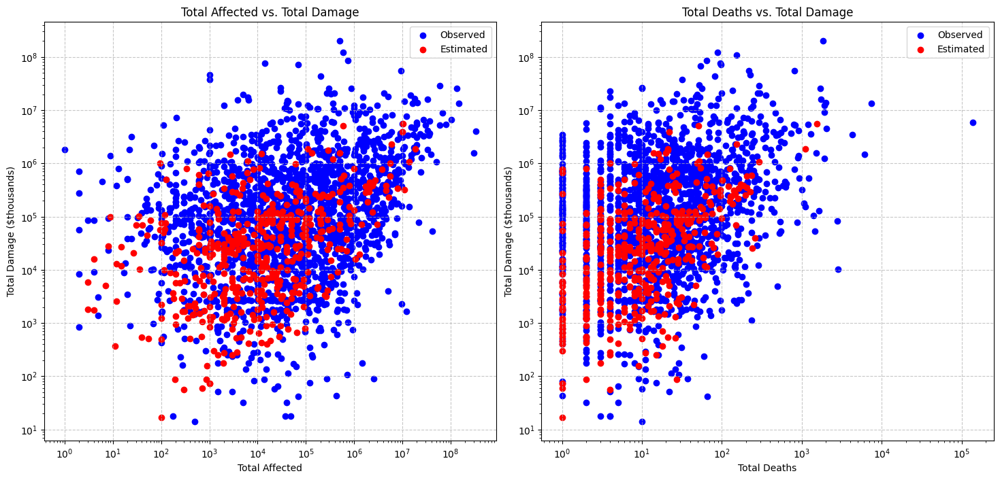

In [32]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ax1 = axes[0]
observed_data = data_for_graph.filter(pl.col('predicted_data_indicator').not_()).to_pandas()
estimated_data = data_for_graph.filter(pl.col('predicted_data_indicator')).to_pandas()


log_x_affected_obs = np.log10(observed_data['Total Affected'].to_numpy())
log_x_deaths_obs = np.log10(observed_data['Total Deaths'].to_numpy())
log_y_damage_obs = np.log10(observed_data['Total Damage'].to_numpy())
log_x_affected_est = np.log10(estimated_data['Total Affected'].to_numpy())
log_x_deaths_est = np.log10(estimated_data['Total Deaths'].to_numpy())
log_y_damage_est = np.log10(estimated_data['Total Damage'].to_numpy())

ax1.scatter(observed_data['Total Affected'], observed_data['Total Damage'], color='blue', label= "Observed")
ax1.scatter(estimated_data['Total Affected'], estimated_data['Total Damage'], color='red', label= "Estimated")

ax1.set_xlabel('Total Affected')
ax1.set_ylabel("Total Damage ($thousands)")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_title('Total Affected vs. Total Damage')
ax1.legend()

ax2 = axes[1]

ax2.scatter(observed_data['Total Deaths'], observed_data['Total Damage'], color='blue', label= "Observed")
ax2.scatter(estimated_data['Total Deaths'], estimated_data['Total Damage'], color='red', label= "Estimated")

ax2.set_xlabel('Total Deaths')
ax2.set_ylabel("Total Damage ($thousands)")
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_title('Total Deaths vs. Total Damage')
ax2.legend()
plt.subplots_adjust(wspace=0.1)
plt.show()

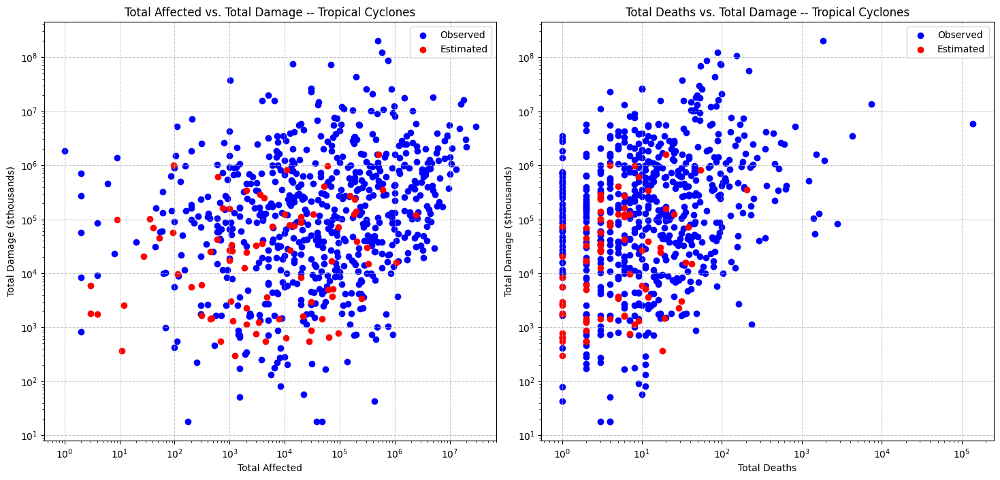

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ax1 = axes[0]
observed_data = (
    data_for_graph
    .filter(pl.col('predicted_data_indicator').not_())
    .filter(pl.col('Disaster Type') == 'Storm')
).to_pandas()
estimated_data = (
    data_for_graph
    .filter(pl.col('predicted_data_indicator'))
    .filter(pl.col('Disaster Type') == 'Storm')
).to_pandas()


log_x_affected_obs = np.log10(observed_data['Total Affected'].to_numpy())
log_x_deaths_obs = np.log10(observed_data['Total Deaths'].to_numpy())
log_y_damage_obs = np.log10(observed_data['Total Damage'].to_numpy())
log_x_affected_est = np.log10(estimated_data['Total Affected'].to_numpy())
log_x_deaths_est = np.log10(estimated_data['Total Deaths'].to_numpy())
log_y_damage_est = np.log10(estimated_data['Total Damage'].to_numpy())

ax1.scatter(observed_data['Total Affected'], observed_data['Total Damage'], color='blue', label= "Observed")
ax1.scatter(estimated_data['Total Affected'], estimated_data['Total Damage'], color='red', label= "Estimated")

ax1.set_xlabel('Total Affected')
ax1.set_ylabel("Total Damage ($thousands)")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_title('Total Affected vs. Total Damage -- Tropical Cyclones')
ax1.legend()

ax2 = axes[1]

ax2.scatter(observed_data['Total Deaths'], observed_data['Total Damage'], color='blue', label= "Observed")
ax2.scatter(estimated_data['Total Deaths'], estimated_data['Total Damage'], color='red', label= "Estimated")

ax2.set_xlabel('Total Deaths')
ax2.set_ylabel("Total Damage ($thousands)")
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_title('Total Deaths vs. Total Damage -- Tropical Cyclones')
ax2.legend()
plt.subplots_adjust(wspace=0.1)
plt.show()

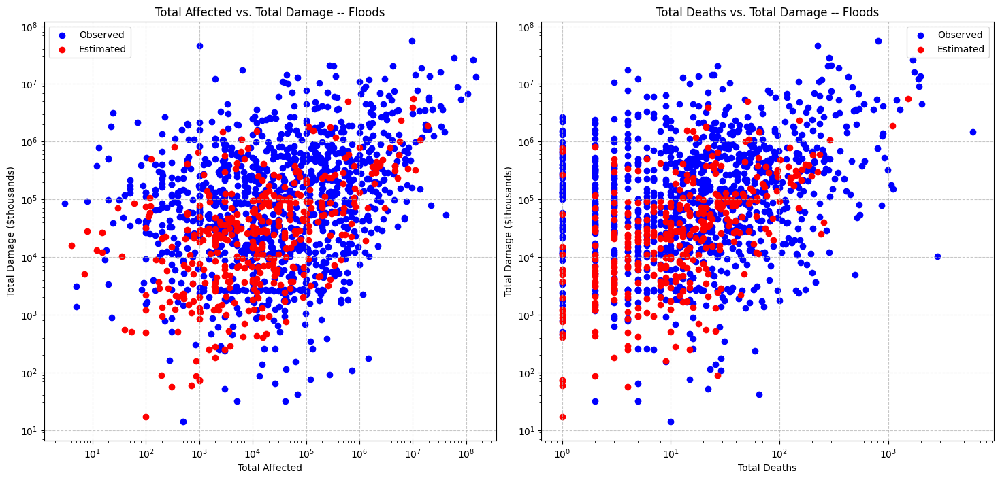

In [34]:
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
ax1 = axes[0]
observed_data = (
    data_for_graph
    .filter(pl.col('predicted_data_indicator').not_())
    .filter(pl.col('Disaster Type') == 'Flood')
).to_pandas()
estimated_data = (
    data_for_graph
    .filter(pl.col('predicted_data_indicator'))
    .filter(pl.col('Disaster Type') == 'Flood')
).to_pandas()


log_x_affected_obs = np.log10(observed_data['Total Affected'].to_numpy())
log_x_deaths_obs = np.log10(observed_data['Total Deaths'].to_numpy())
log_y_damage_obs = np.log10(observed_data['Total Damage'].to_numpy())
log_x_affected_est = np.log10(estimated_data['Total Affected'].to_numpy())
log_x_deaths_est = np.log10(estimated_data['Total Deaths'].to_numpy())
log_y_damage_est = np.log10(estimated_data['Total Damage'].to_numpy())

ax1.scatter(observed_data['Total Affected'], observed_data['Total Damage'], color='blue', label= "Observed")
ax1.scatter(estimated_data['Total Affected'], estimated_data['Total Damage'], color='red', label= "Estimated")

ax1.set_xlabel('Total Affected')
ax1.set_ylabel("Total Damage ($thousands)")
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.set_title('Total Affected vs. Total Damage -- Floods')
ax1.legend()

ax2 = axes[1]

ax2.scatter(observed_data['Total Deaths'], observed_data['Total Damage'], color='blue', label= "Observed")
ax2.scatter(estimated_data['Total Deaths'], estimated_data['Total Damage'], color='red', label= "Estimated")

ax2.set_xlabel('Total Deaths')
ax2.set_ylabel("Total Damage ($thousands)")
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.set_title('Total Deaths vs. Total Damage -- Floods')
ax2.legend()
plt.subplots_adjust(wspace=0.1)
plt.show()

## Merge with Tropical Cyclone Database

In [35]:
TC_analysis = (
    subset_with_GDP
    .filter(
        # (pl.col('Total Deaths').is_not_null()) |
        # (pl.col('Total Affected').is_not_null()) |
        (pl.col('Total Damage').is_not_null())
    )
    .select('Disaster Type', 
        'Disaster Subtype',
        'Total Deaths',
        'Total Affected',
        'Total Damage',
        'Country',
        'year',
        'month',
        'day',
        'Longitude',
        'Latitude',
        'startyear', 'startmonth', 'startday',
    )
    .with_columns(
        pl.lit(False).alias('predicted_data_indicator')
    )
    .vstack(
        pl.DataFrame(output_predicted_data)
        .select('Disaster Type', 
            'Disaster Subtype',
            'Total Deaths',
            'Total Affected',
            'Total Damage',
            'Country',
            'year',
            'month',
            'day',
            'Longitude',
            'Latitude',
            'startyear', 'startmonth', 'startday',
            'predicted_data_indicator',
        )
        .with_columns(
            pl.col('Total Deaths').cast(pl.Int64),
            pl.col('Total Affected').cast(pl.Int64),
            pl.col('Total Damage').cast(pl.Int64),
            pl.col('year').cast(pl.Int64),
            pl.col('month').cast(pl.Int64),
            pl.col('day').cast(pl.Int64),
            pl.col('startyear').cast(pl.Int64),
            pl.col('startmonth').cast(pl.Int64),
            pl.col('startday').cast(pl.Int64)
        )
    )
)

In [36]:
import xarray as xr
# taken from https://www.ncei.noaa.gov/data/international-best-track-archive-for-climate-stewardship-ibtracs/v04r01/access/netcdf/IBTrACS.ALL.v04r01.nc on 12/07/2025
# taken from https://www.ncei.noaa.gov/data/international-best-track-archive-for-climate-stewardship-ibtracs/v04r01/access/netcdf/IBTrACS.ALL.v04r01.nc on 9/13/2025
filepath = "../.data/IBTrACS.ALL.v04r01 - 2025.12.07.nc"

ds = xr.open_dataset(filepath)
# ds.summary
# ds.license
# ds.storm_speed
ds.data_vars
# np.unique(ds.dist2land)

Data variables:
    numobs            (storm) float32 54kB ...
    sid               (storm) |S13 176kB ...
    season            (storm) float32 54kB ...
    number            (storm) int16 27kB ...
    basin             (storm, date_time) |S2 10MB ...
    subbasin          (storm, date_time) |S2 10MB ...
    name              (storm) |S128 2MB ...
    source_usa        (storm) |S128 2MB ...
    source_jma        (storm) |S128 2MB ...
    source_cma        (storm) |S128 2MB ...
    source_hko        (storm) |S128 2MB ...
    source_kma        (storm) |S128 2MB ...
    source_new        (storm) |S128 2MB ...
    source_reu        (storm) |S128 2MB ...
    source_bom        (storm) |S128 2MB ...
    source_nad        (storm) |S128 2MB ...
    source_wel        (storm) |S128 2MB ...
    source_td5        (storm) |S128 2MB ...
    source_td6        (storm) |S128 2MB ...
    source_ds8        (storm) |S128 2MB ...
    source_neu        (storm) |S128 2MB ...
    source_mlc        (storm) |S

In [187]:
distance = 50
MILES_TO_METERS = 1609.34
BUFFER_DISTANCE_MILES = distance
BUFFER_DISTANCE_METERS = BUFFER_DISTANCE_MILES * MILES_TO_METERS
MPH_TO_KNOTS = 1.15078
def get_graphs_for_country(country1, country1_alt=""):
    import geopandas as gpd
    from shapely.geometry import Point
    country_string = country1
    if country1_alt == "":
        country_string_alt = country1
    else:
        country_string_alt = country1_alt
    country_URL = "../.data/ne_50m_admin_0_countries.zip" # from   https://www.naturalearthdata.com/http//www.naturalearthdata.com/download/50m/cultural/ne_50m_admin_0_countries.zip
    country_gdf = gpd.read_file(country_URL)
    country_shape = country_gdf[country_gdf['ADMIN'] == country_string_alt].to_crs("EPSG:4326")
    country_geometry = gpd.GeoDataFrame(geometry=[country_shape.union_all()], crs=country_shape.crs)
    country_shape = country_gdf[country_gdf['ADMIN'] == country_string_alt]
    country_shape_proj = country_shape.to_crs("EPSG:3857")
    country_buffer_proj = country_shape_proj.geometry.buffer(BUFFER_DISTANCE_METERS)
    country_buffer_gdf = gpd.GeoDataFrame(geometry=country_buffer_proj, crs="EPSG:3857")
    country_buffer_gdf = country_buffer_gdf.to_crs("EPSG:4326").geometry.buffer(0)
    country_geometry_w_buffer = gpd.GeoDataFrame(
        geometry=[country_buffer_gdf.union_all()], 
        crs="EPSG:4326"
    )
    # country_shape_original = country_gdf[country_gdf['ADMIN'] == country_string_alt].to_crs("EPSG:4326")
    # country_geometry_original = gpd.GeoDataFrame(
    #     geometry=[country_shape_original.union_all()], 
    #     crs=country_shape_original.crs
    # )
    track_data = ds[['sid', 'time', 'lat', 'lon', 'usa_wind', 'usa_sshs']]
    track_data['usa_wind'] = track_data['usa_wind'] * MPH_TO_KNOTS
    # track_data['storm_speed'] = track_data['storm_speed'] * MPH_TO_KNOTS
    track_df = track_data.to_dataframe().reset_index()
    track_df = track_df.dropna(subset=['lon', 'lat'])
    geometry = [
        Point(lon, lat) 
        for lon, lat in zip(track_df['lon'], track_df['lat'])
    ]
    TARGET_CRS = "EPSG:4326"
    storms_gdf = gpd.GeoDataFrame(track_df, geometry=geometry, crs=TARGET_CRS)
    storms_over_country_gdf = gpd.sjoin(
        storms_gdf, 
        # country_geometry, 
        country_geometry_w_buffer, 
        how="inner", 
        predicate="within"
    )
    storms_gdf['is_inside_country'] = storms_gdf.index.isin(storms_over_country_gdf.index)
    storms_pl_full = pl.from_pandas(storms_gdf.drop(columns=['geometry']))
    storms_pl_full = storms_pl_full.sort(["storm", "date_time"])
    storms_pl_with_lag = storms_pl_full.with_columns(
        pl.col('is_inside_country').shift(1).over('storm').alias('is_inside_country_prev'),
        pl.col('usa_sshs').alias('entry_sshs'),
        pl.col('usa_wind').alias('entry_wind')
    )
    entry_points = storms_pl_with_lag.filter(
        (pl.col('is_inside_country')) &
        (pl.col('is_inside_country_prev').not_())
    )
    max_intensity_entry = (
        entry_points
        .sort(['storm','entry_wind'], descending=True)
        .filter(pl.col('entry_wind').is_not_null())
        .unique('storm')
        .select('storm', 'date_time')
    )
    max_intensity_point_per_storm = (
        pl.from_pandas(storms_gdf.drop(columns=['geometry']))
        .drop('is_inside_country')
        .join(max_intensity_entry, on=['storm', 'date_time'])
        .filter(pl.col('time') >= pl.datetime(year=2000, month=1, day=1))
        .to_pandas()
    )
    geometry = [
        Point(lon, lat) 
        for lon, lat in zip(max_intensity_point_per_storm['lon'], max_intensity_point_per_storm['lat'])
    ]
    merge_point_before_country = (
        pl.DataFrame(max_intensity_point_per_storm)
        .select('storm','date_time','lon','lat', 'usa_wind', 'usa_sshs', 'time')
        .with_columns(
            pl.when(pl.col('date_time') != 0)
            .then(pl.col('date_time') - 1)
            .otherwise(pl.col('date_time'))
            .alias('date_time'),
        )
        .rename({'lon':'lon1', 'lat':'lat1', 'usa_wind':'usa_wind1', 'usa_sshs': 'usa_sshs1'})
        .join(pl.DataFrame(storms_gdf.drop(columns=['geometry', 'is_inside_country'])).drop('time'), on=['storm','date_time'], how='inner')
        .rename({'lon':'lon2', 'lat':'lat2', 'usa_wind':'usa_wind2', 'usa_sshs': 'usa_sshs2'})
        .with_columns(
            ((pl.col('lon1') + pl.col('lon2'))/2)
            .alias('lon'),
            ((pl.col('lat1') + pl.col('lat2'))/2)
            .alias('lat'),
            ((pl.col('usa_wind1') + pl.col('usa_wind2'))/2)
            .alias('usa_wind'),
            ((pl.col('usa_sshs1') + pl.col('usa_sshs2'))/2)
            .alias('usa_sshs'),
        )
        .drop('lon1','lon2','lat1','lat2','usa_wind1','usa_wind2','usa_sshs1','usa_sshs2')
    )
    country_cyclones_pandas = merge_point_before_country.to_pandas()
    geometry = [
        Point(lon, lat)
        for lon, lat in zip(country_cyclones_pandas['lon'],
                            country_cyclones_pandas['lat'])
    ]
    country_cyclones_gdf = gpd.GeoDataFrame(
        country_cyclones_pandas,
        geometry=geometry,
        crs="EPSG:4326"
    ).sort_values('usa_wind', ascending=True)
    country_cyclones_pl = pl.DataFrame(country_cyclones_gdf.drop(columns=['geometry']))

    x = mdates.date2num(country_cyclones_pandas[~country_cyclones_pandas['usa_wind'].isnull()].sort_values('time')['time'])
    y = country_cyclones_pandas[~country_cyclones_pandas['usa_wind'].isnull()].sort_values('time')['usa_wind']
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        x,
        y,
        alpha=0.6,
        s=50,
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')
    ax.set_xlabel('Date', fontsize=12)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    fig.autofmt_xdate() # Auto-rotate the date labels
    ax.set_ylabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_title(f'Max Wind Speed Over {country_string} over Time', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    country_geometry.plot(
        ax=ax, 
        color='lightgreen',              # Fill color for the land
        edgecolor='darkgreen',           # Border color
        linewidth=1.5,
        zorder=1,
        alpha=0.3
    )
    country_cyclones_gdf.plot(
        ax=ax,
        marker='o',
        column=country_cyclones_gdf['usa_wind'],
        cmap='plasma',                   
        markersize=50,                  
        legend=True,
        legend_kwds={'label': "Wind Speed (mph)", 'orientation': "horizontal"},
        zorder=3
    )
    minx, miny, maxx, maxy = country_cyclones_gdf.total_bounds
    if country_string == "United States":
        ax.set_xlim(-115, -60)
        ax.set_ylim(16, 45)
    else:
        ax.set_xlim(minx - 2, maxx + 2)
        ax.set_ylim(miny - 2, maxy + 2)

    # Labeling
    ax.set_title(f"Storm Track Intensity Over {country_string} (Color by Wind Speed)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.tight_layout()
    plt.show()

    list_of_storms = country_cyclones_pandas[country_cyclones_pandas['usa_wind'] > 0]['storm'].unique()
    mask = ds['storm'].isin(list_of_storms)
    ds_filtered = ds.where(mask, drop=True)
    track_data_vars = ['sid', 'time', 'lat', 'lon', 'usa_wind']
    track_df = ds_filtered[track_data_vars].to_dataframe().reset_index()
    track_df['sid'] = track_df['sid'].str.decode('utf-8')
    track_df['sid'] = pd.Series(track_df['sid'].tolist())
    track_df = track_df.sort_values(by=['sid', 'time']).reset_index(drop=True)
    # track_df = track_df.rename(columns={'sid': 'storm', 'time': 'date_time'})
    track_df = track_df.dropna(subset=['lon', 'lat', 'usa_wind'])
    geometry = [
        Point(lon, lat) 
        for lon, lat in zip(track_df['lon'], track_df['lat'])
    ]
    TARGET_CRS = "EPSG:4326"
    storms_gdf = gpd.GeoDataFrame(
        track_df, 
        geometry=geometry, 
        crs=TARGET_CRS
    )

    map_shape = country_gdf.to_crs("EPSG:4326")
    map_geometry = gpd.GeoDataFrame(
        geometry=[map_shape.union_all()], 
        crs=map_shape.crs
    )
    storms_gdf = storms_gdf.sort_values(by=['sid', 'time']) 

    lines_series = (
        storms_gdf.groupby('sid')['geometry']
        .agg(lambda x: LineString(x.tolist()) if len(x.tolist()) > 1 else None)
        .rename('geometry')
    )

    storms_lines_gdf = gpd.GeoDataFrame(lines_series)
    storms_lines_gdf = storms_lines_gdf.set_geometry('geometry', crs=storms_gdf.crs)
    country_wind_speeds = country_cyclones_pandas[['sid','usa_wind']].rename(columns={'usa_wind': 'max_storm_wind'})
    country_wind_speeds['sid'] = country_wind_speeds['sid'].str.decode('utf-8')
    country_wind_speeds['sid'] = pd.Series(country_wind_speeds['sid'].tolist())
    storms_lines_gdf = storms_lines_gdf.merge(country_wind_speeds, on='sid', how='left').sort_values('max_storm_wind', ascending=True)

    fig, ax = plt.subplots(1, 1, figsize=(12, 10))

    map_geometry.plot(ax=ax, color='lightgreen', edgecolor='darkgreen', linewidth=1.5, zorder=1, alpha=0.3)
    ax.set_xlim(-100, -50)
    ax.set_ylim(10, 40)
    ax.set_aspect('equal')

    storms_lines_gdf.plot(
        ax=ax,
        column='max_storm_wind', # Color the line by its max wind speed (the merged column)
        cmap='viridis', 
        legend=True,
        legend_kwds={'label': "Max Storm Wind Speed (mph)", 'orientation': "horizontal"},
        linewidth=2.0,
        linestyle='-',
        zorder=2
    )

    country_geometry.plot(
        ax=ax, 
        color='lightgreen',              # Fill color for the land
        edgecolor='darkgreen',           # Border color
        linewidth=1.5,
        zorder=5,
        alpha=0.9
    )
    if country_string == "United States":
        ax.set_xlim(-115, -60)
        ax.set_ylim(16, 45)
    else:
        ax.set_xlim(minx - 10, maxx + 10)
        ax.set_ylim(miny - 10, maxy + 10)
    ax.set_title(f"Storm Track Intensity Over {country_string} (Color by Wind Speed)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.tight_layout()
    plt.show()

    country_disasters = (
        TC_analysis
        .filter(pl.col('Disaster Type') == 'Storm')
        .filter(pl.col('Country') == country_string)
    )
    relevant_storms = pl.DataFrame()
    country_disasters_deleted_missing = country_disasters.with_row_index("index")
    for i in range(len(country_disasters)):
        year_i = country_disasters[i].select('startyear').to_numpy()[0][0]
        month_i = country_disasters[i].select('startmonth').to_numpy()[0][0]
        day_i = country_disasters[i].select('startday').to_numpy()[0][0]
        estimate_flag = False
        if not day_i.is_integer():
            day_i = 15
            estiamte_flag = True
        relevant_storm_temp = (
            country_cyclones_pl
            .with_columns(
                (pl.datetime(year_i, month_i, day_i) - pl.col('time')).abs()
                .alias('time_diff'),
            )
            .with_columns(
                pl.when((pl.datetime(year_i, month_i, day_i) < pl.col('time')) &
                        (pl.col('time_diff') > pl.duration(weeks=1)) &
                        (estimate_flag == False))
                .then(True)
                .otherwise(False)
                .alias('delete_flag')
            )
            .filter(pl.col('delete_flag') == False)
            .sort('time_diff')
            
        )

        if len(relevant_storm_temp) > 0:
            relevant_storm = relevant_storm_temp[0]
            if len(relevant_storms) == 0:
                relevant_storms = relevant_storm
            else:
                relevant_storms = relevant_storms.vstack(relevant_storm)
        else:
            country_disasters_deleted_missing = (
                country_disasters_deleted_missing
                .filter(
                    pl.col("index") != i
                )
            )
    country_disasters_deleted_missing = country_disasters_deleted_missing.drop('index')
    country_disasters_w_storms = country_disasters_deleted_missing.hstack(relevant_storms).sort('storm')



    country_disasters_w_storms = (
        country_disasters_w_storms
        .filter(pl.col('time_diff').le(pl.duration(days=15)))
        .filter(pl.col('Total Damage').is_not_null()) # keep the interpolated value
        .with_columns(
            pl.when(pl.col('Total Affected').is_null())
            .then(0)
            .otherwise(pl.col('Total Affected'))
            .alias('Total Affected'),
            pl.when(pl.col('Total Deaths').is_null())
            .then(0)
            .otherwise(pl.col('Total Deaths'))
            .alias('Total Deaths'),
        )
    )
    country_disasters_w_storms_agg = (
        country_disasters_w_storms.group_by(
            ['time','sid','lon','lat','usa_wind','usa_sshs','time_diff', 'predicted_data_indicator']
        ).agg(pl.sum('Total Deaths'), pl.sum('Total Affected'), pl.sum('Total Damage'))
    )
    country_disasters_w_storms_agg = (
        country_disasters_w_storms_agg
        .with_columns(
            pl.when(pl.col('Total Deaths') == 0)
            .then(None)
            .otherwise(pl.col('Total Deaths'))
            .alias('Total Deaths'),
            pl.when(pl.col('Total Affected') == 0)
            .then(None)
            .otherwise(pl.col('Total Affected'))
            .alias('Total Affected'),
            pl.when(pl.col('Total Damage') == 0)
            .then(None)
            .otherwise(pl.col('Total Damage'))
            .alias('Total Damage'),
            pl.when(pl.col('Total Damage') == 0)
            .then(None)
            .otherwise(np.log10(pl.col('Total Damage')))
            .alias('Log Total Damage'),
            pl.when(pl.col('Total Deaths') == 0)
            .then(None)
            .otherwise(np.log10(pl.col('Total Deaths')))
            .alias('Log Total Deaths'),
            pl.when(pl.col('Total Affected') == 0)
            .then(None)
            .otherwise(np.log10(pl.col('Total Affected')))
            .alias('Log Total Affected'),
        )
    )

    geometry = [
        Point(lon, lat)
        for lon, lat in zip(country_disasters_w_storms_agg['lon'],
                            country_disasters_w_storms_agg['lat'])
    ]
    country_disasters_w_storms_gdf = gpd.GeoDataFrame(
        country_disasters_w_storms_agg.to_pandas(),
        geometry=geometry,
        crs="EPSG:4326"
    ).sort_values('Total Deaths', ascending=True)

    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    country_geometry.plot(
        ax=ax, 
        color='gray',              # Fill color for the land
        edgecolor='black',           # Border color
        linewidth=1.5,
        zorder=1,
        alpha=0.3
    )
    country_disasters_w_storms_gdf.plot(
        ax=ax,
        marker='o',
        column=country_disasters_w_storms_gdf['Log Total Damage'],
        cmap='plasma',                   
        markersize=50,                  
        legend=True,
        legend_kwds={'label': "Log Total Damage", 'orientation': "horizontal"},
        zorder=3
    )
    minx, miny, maxx, maxy = country_disasters_w_storms_gdf.total_bounds
    if country_string == "United States":
        ax.set_xlim(-115, -60)
        ax.set_ylim(16, 45)
    else:
        ax.set_xlim(minx - 2, maxx + 2)
        ax.set_ylim(miny - 2, maxy + 2)

    # Labeling
    ax.set_title(f"Storm Track Intensity Over {country_string} (Color by Log Total Damage)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.tight_layout()
    plt.show()



    x = country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Damage'].isnull()].sort_values('usa_wind')['usa_wind']
    y = np.log10(country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Damage'].isnull()].sort_values('usa_wind')['Total Damage'])
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b
    # m, b, r_value, p_value, std_err = linregress(country_disasters_w_storms_gdf['usa_wind'],
    #                                              np.log10(country_disasters_w_storms_gdf['Total Damage']))
    # y_fit = m * country_disasters_w_storms_gdf['usa_wind'] + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        country_disasters_w_storms_gdf['usa_wind'],
        np.log10(country_disasters_w_storms_gdf['Total Damage']),
        alpha=0.6,
        s=50,
        c=country_disasters_w_storms_gdf['predicted_data_indicator'],
        cmap='viridis',
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')
    ax.set_xlabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_ylabel('Log(Total Damage)', fontsize=12)
    ax.set_title('Relationship Between Wind Speed and Log Damage \nData Source Indicator: Yellow = Predicted', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()

    x = country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Deaths'].isnull()].sort_values('usa_wind')['usa_wind']
    y = np.log10(country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Deaths'].isnull()].sort_values('usa_wind')['Total Deaths'])
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        country_disasters_w_storms_gdf['usa_wind'],
        country_disasters_w_storms_gdf['Log Total Deaths'],
        alpha=0.6,
        s=50,
        color='purple'
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')

    ax.set_xlabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_ylabel('Log(Total Deaths)', fontsize=12)
    ax.set_title('Relationship Between Wind Speed and Log Total Deaths', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()



    x = country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Affected'].isnull()].sort_values('usa_wind')['usa_wind']
    y = np.log10(country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Affected'].isnull()].sort_values('usa_wind')['Total Affected'])
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        country_disasters_w_storms_gdf['usa_wind'],
        country_disasters_w_storms_gdf['Log Total Affected'],
        alpha=0.6,
        s=50,
        color='purple'
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')

    ax.set_xlabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_ylabel('Log(Total Affected)', fontsize=12)
    ax.set_title('Relationship Between Wind Speed and Log Affected', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()



In [208]:
# data_for_graph.filter(pl.col('Disaster Type') == 'Storm').group_by('Country').agg(pl.count()).sort('count', descending=True).head(10)
summarytable = (
        TC_analysis
        .filter(pl.col('Disaster Type') == 'Storm')
).group_by('Country').agg(pl.count()).sort('count', descending=True).head(11)
summarytable

C:\Users\cardi\AppData\Local\Temp\ipykernel_34740\3545285229.py:5: DeprecationWarning: `pl.count()` is deprecated. Please use `pl.len()` instead.
(Deprecated in version 0.20.5)
  ).group_by('Country').agg(pl.count()).sort('count', descending=True).head(11)


Country,count
str,u32
"""Philippines""",171
"""China""",100
"""United States""",65
"""Mexico""",65
"""Vietnam""",64
"""Japan""",57
"""Taiwan (Province of China)""",37
"""India""",19
"""Cuba""",16


## Philippines

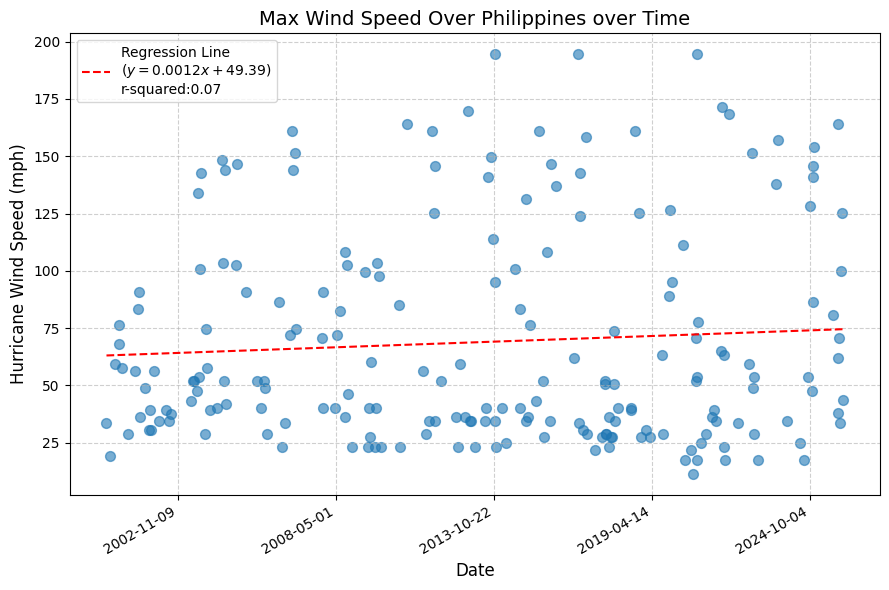

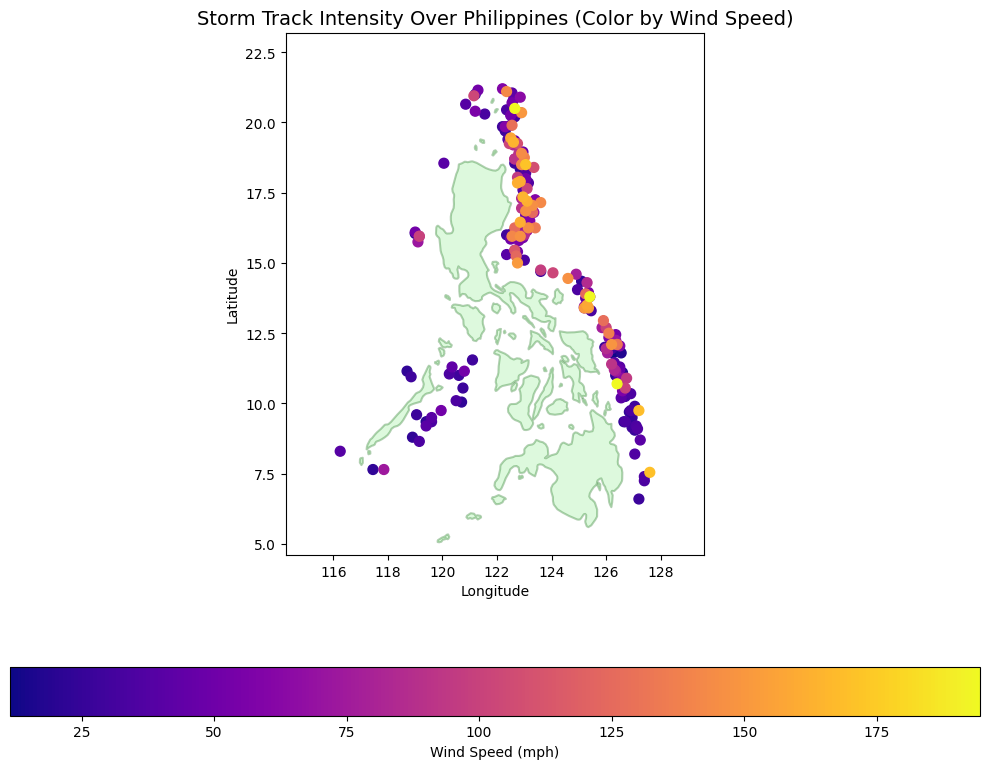

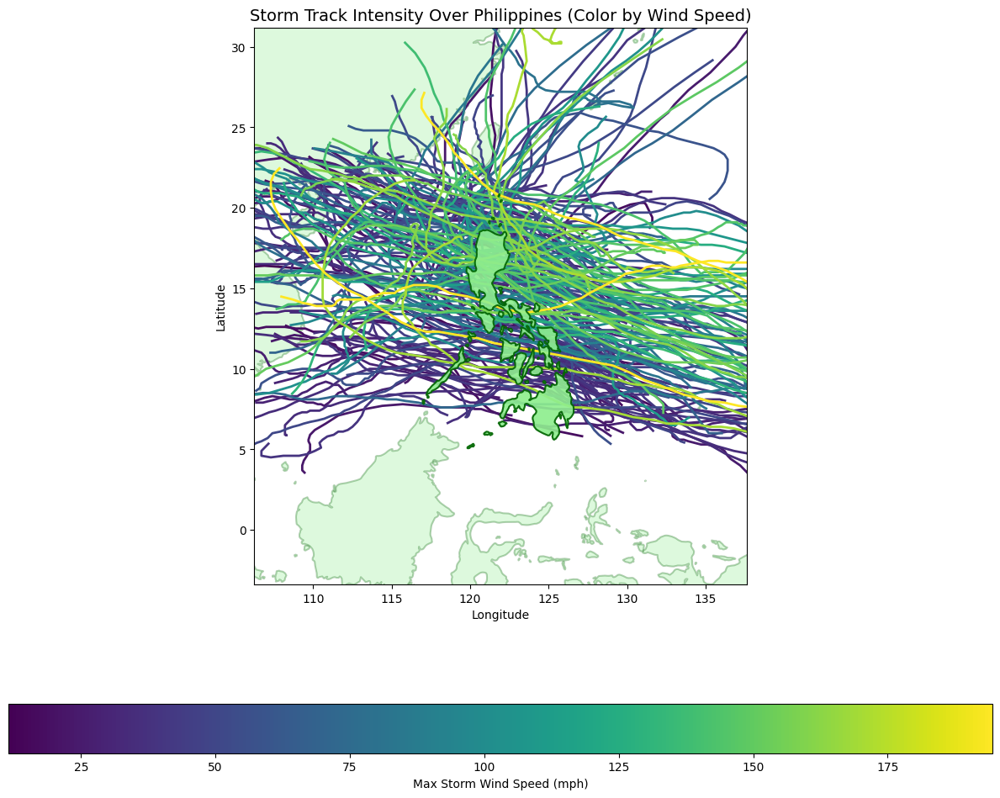

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


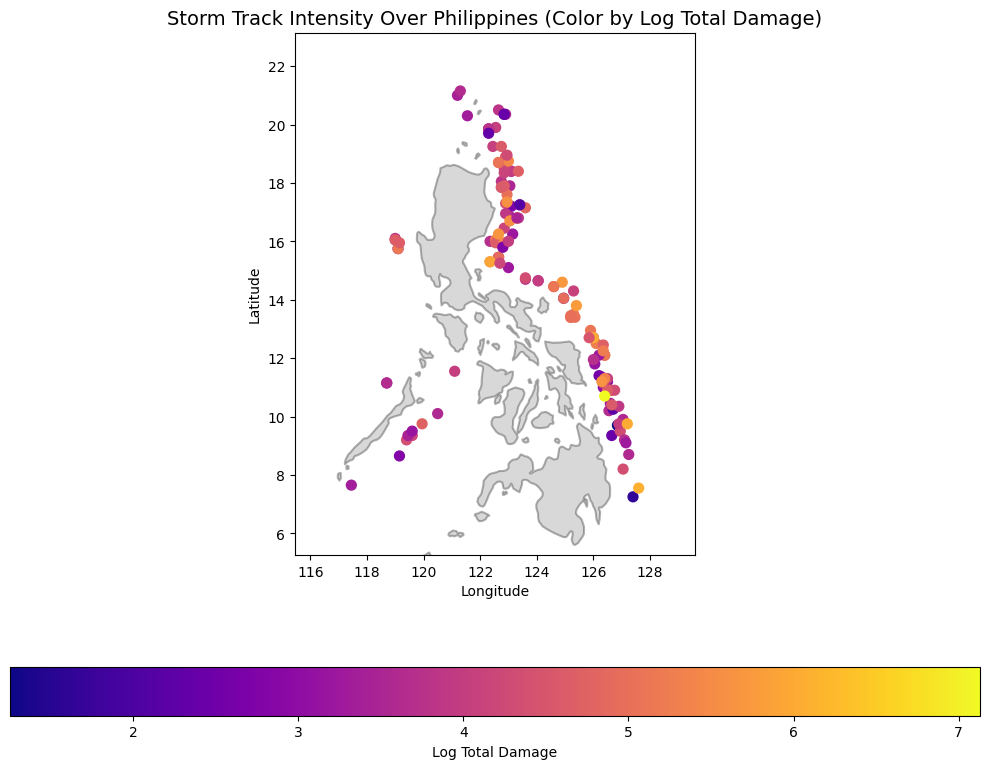

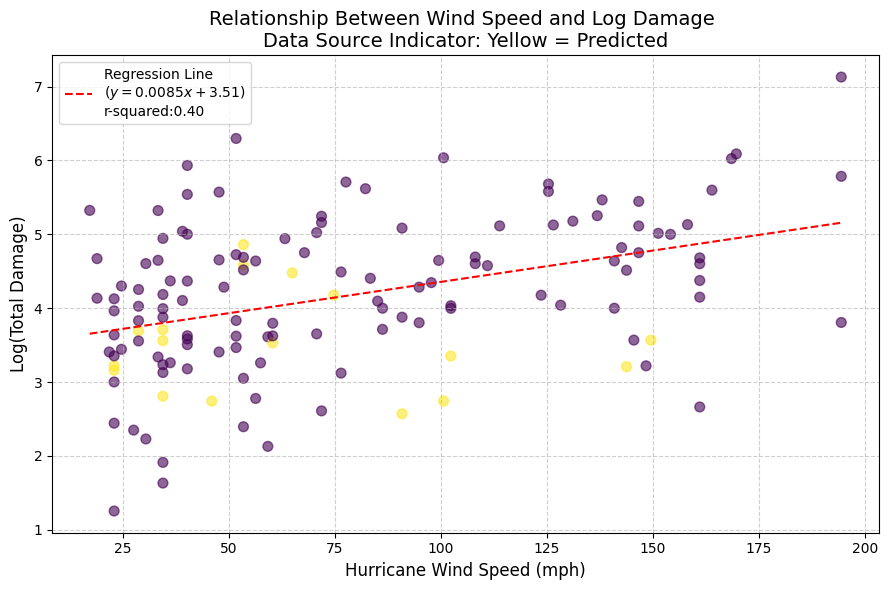

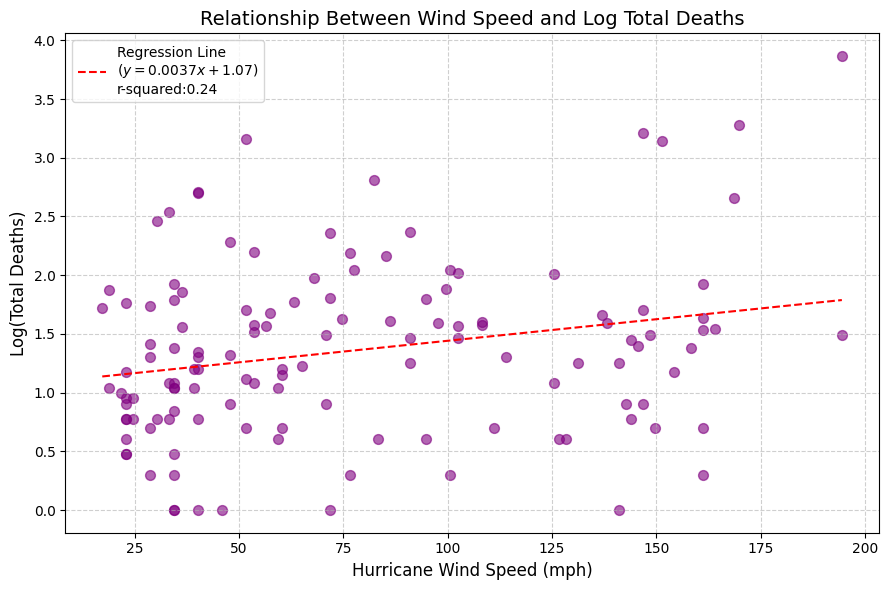

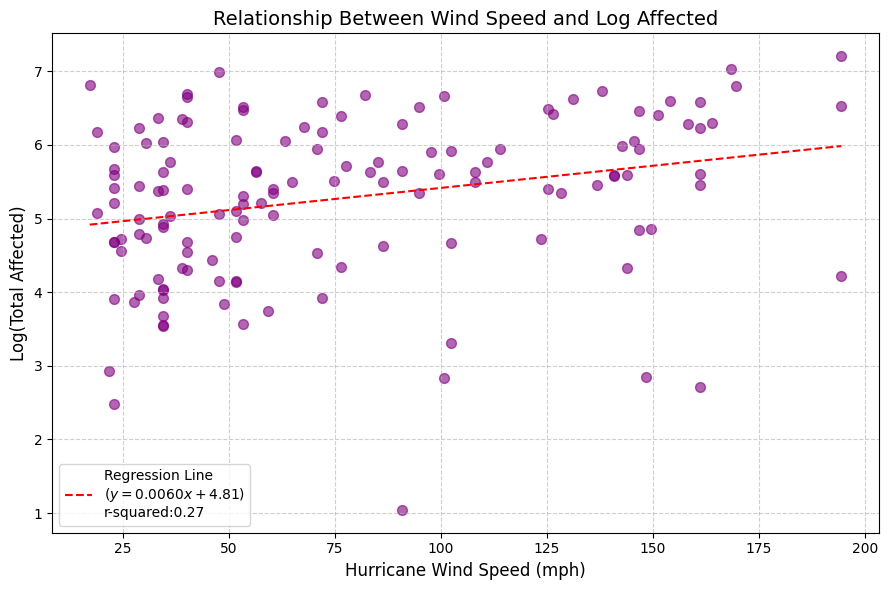

In [189]:
get_graphs_for_country("Philippines")

## China

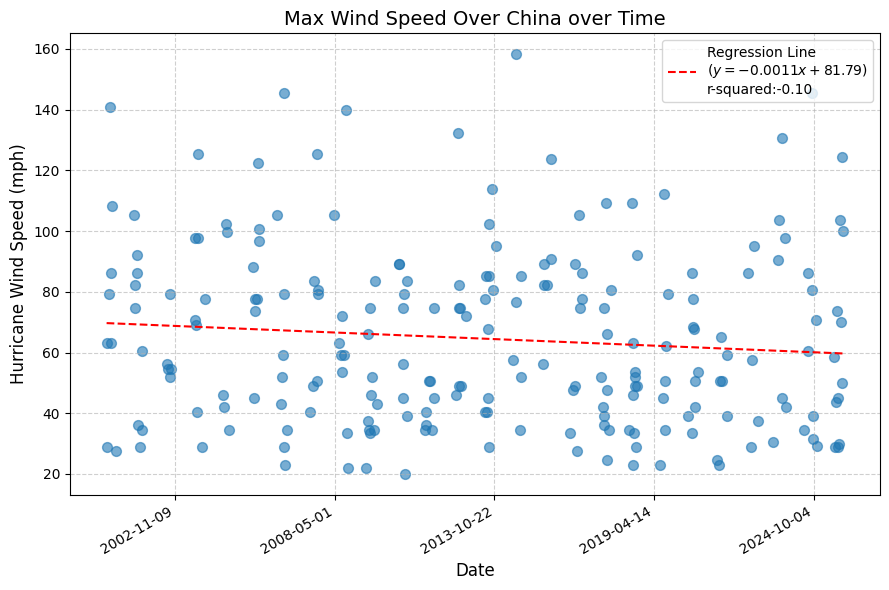

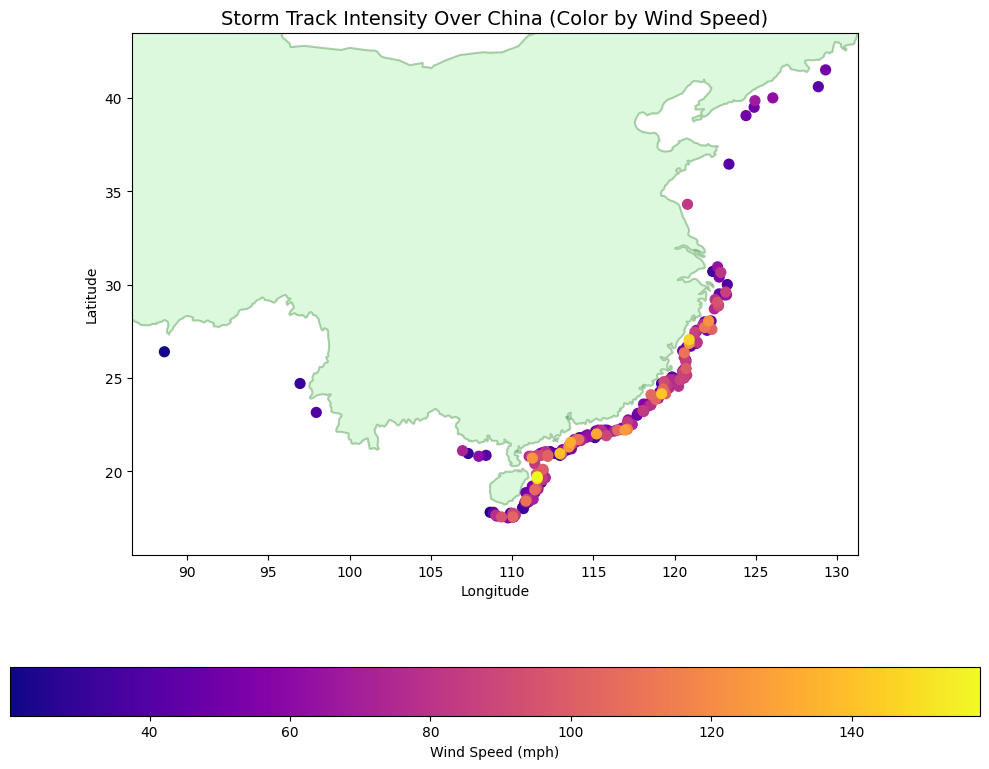

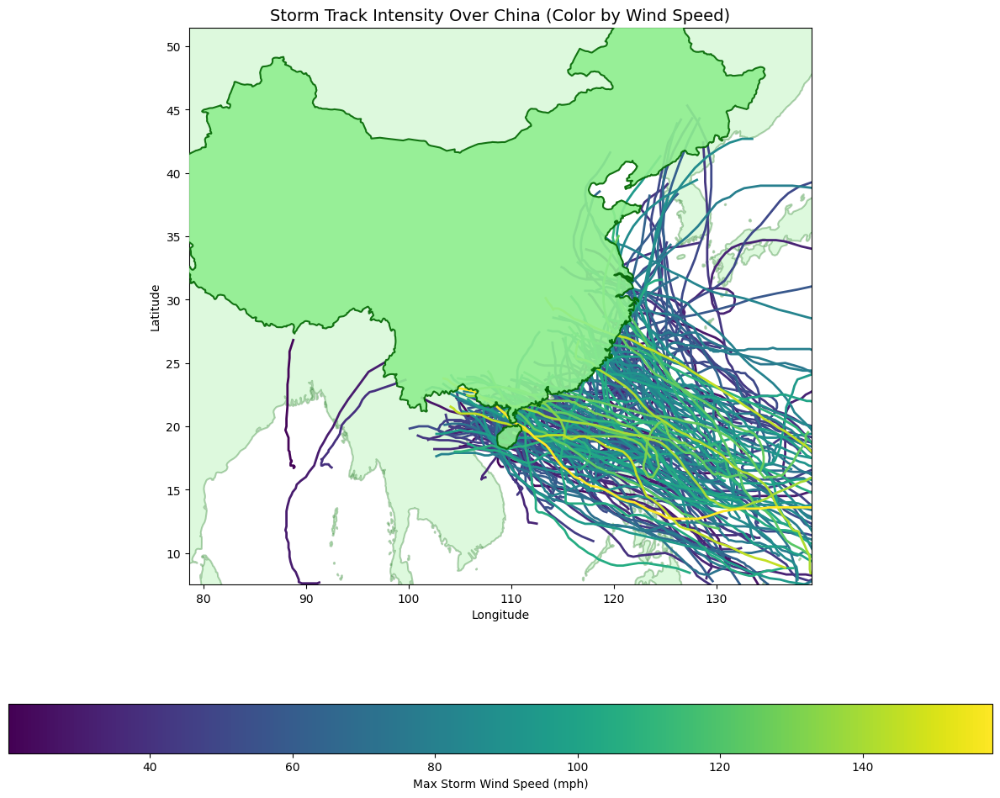

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


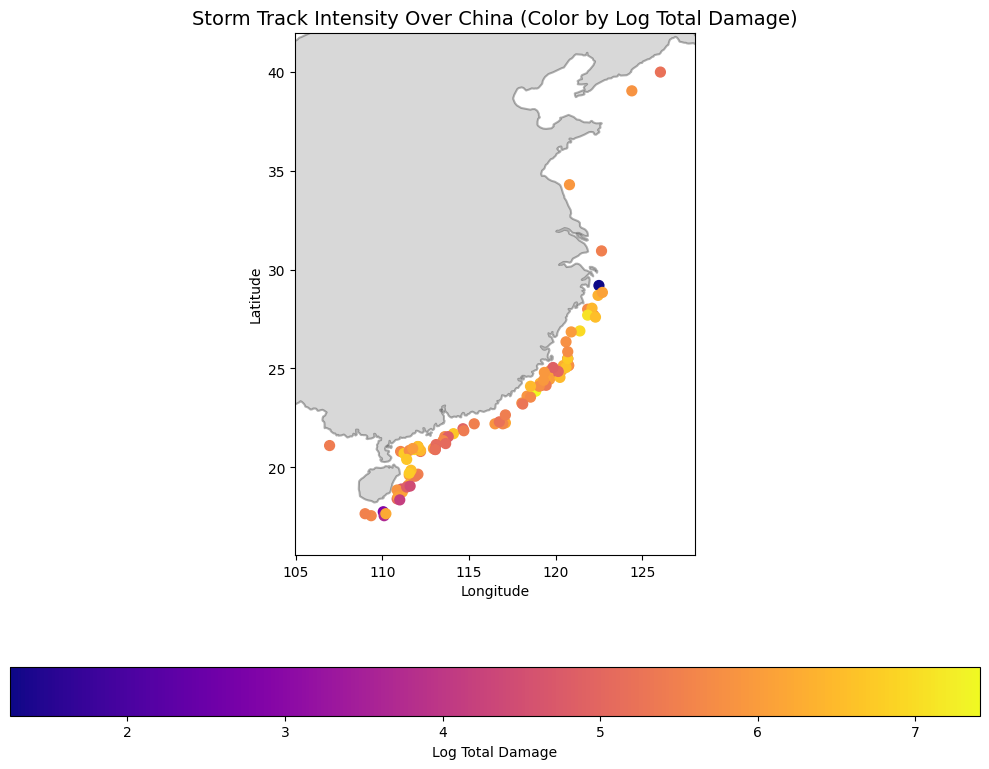

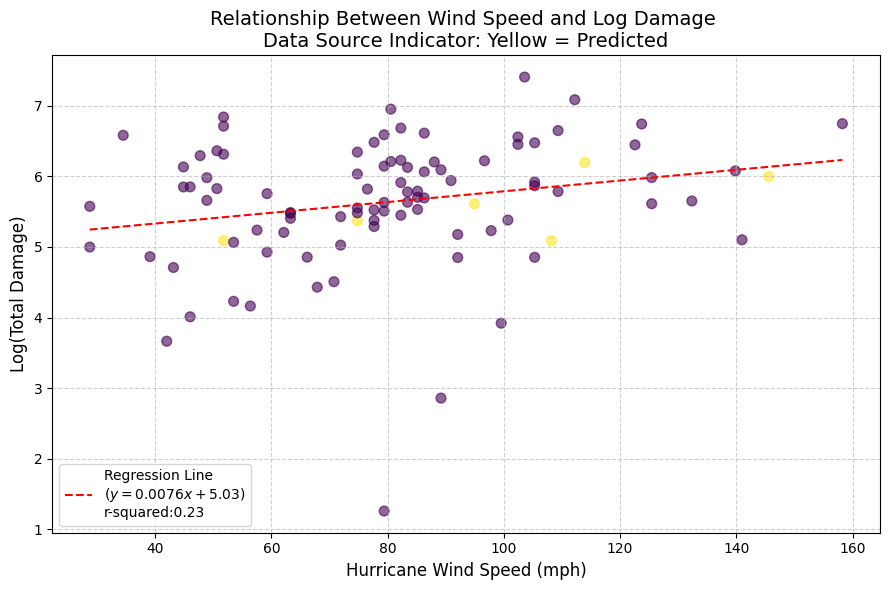

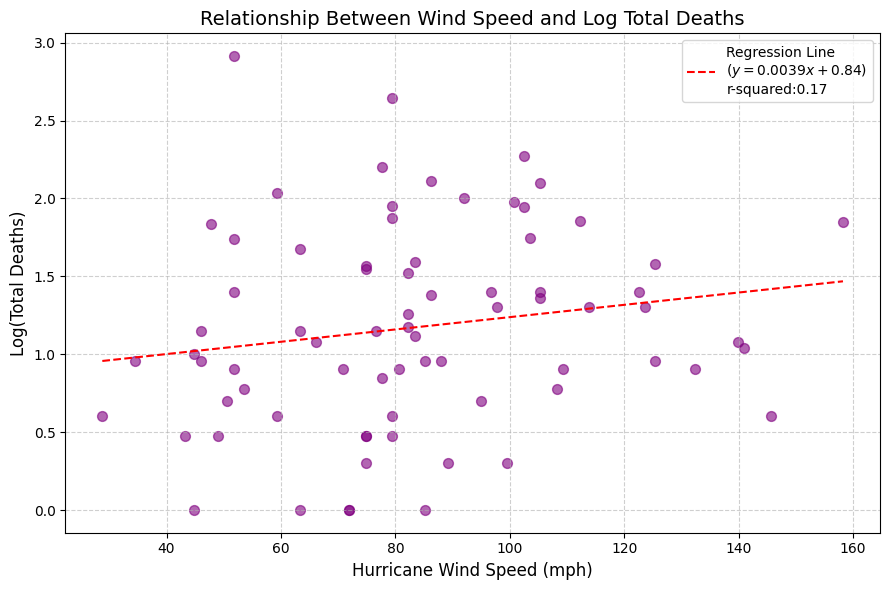

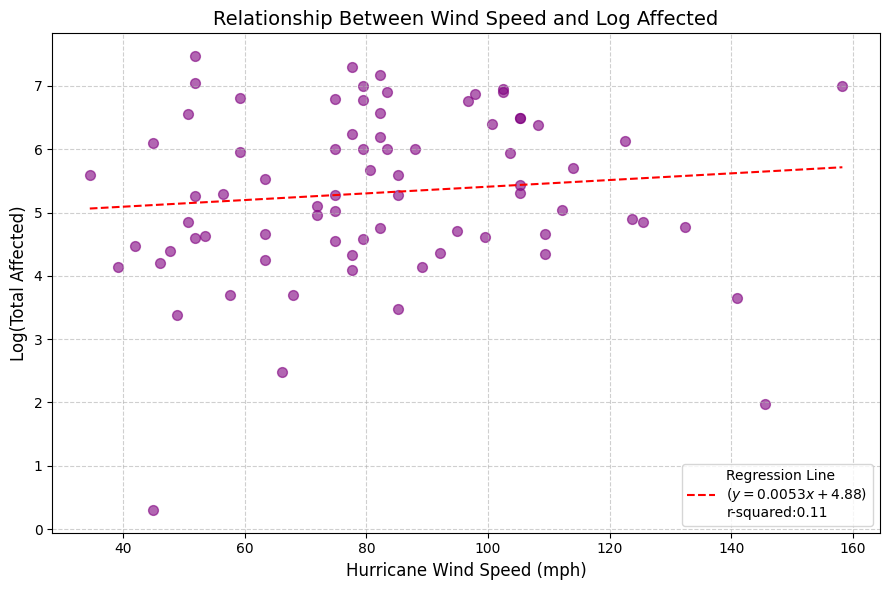

In [190]:
get_graphs_for_country('China')

## Mexico

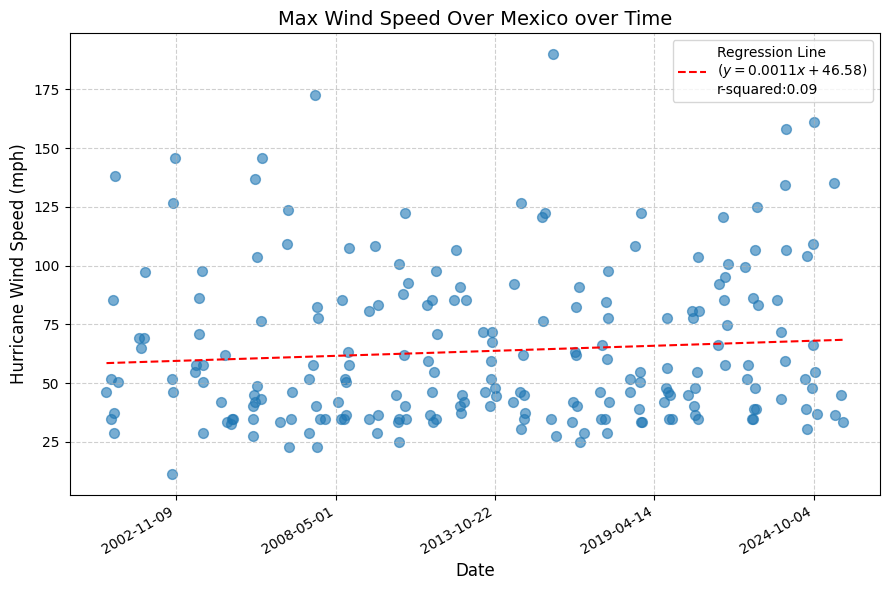

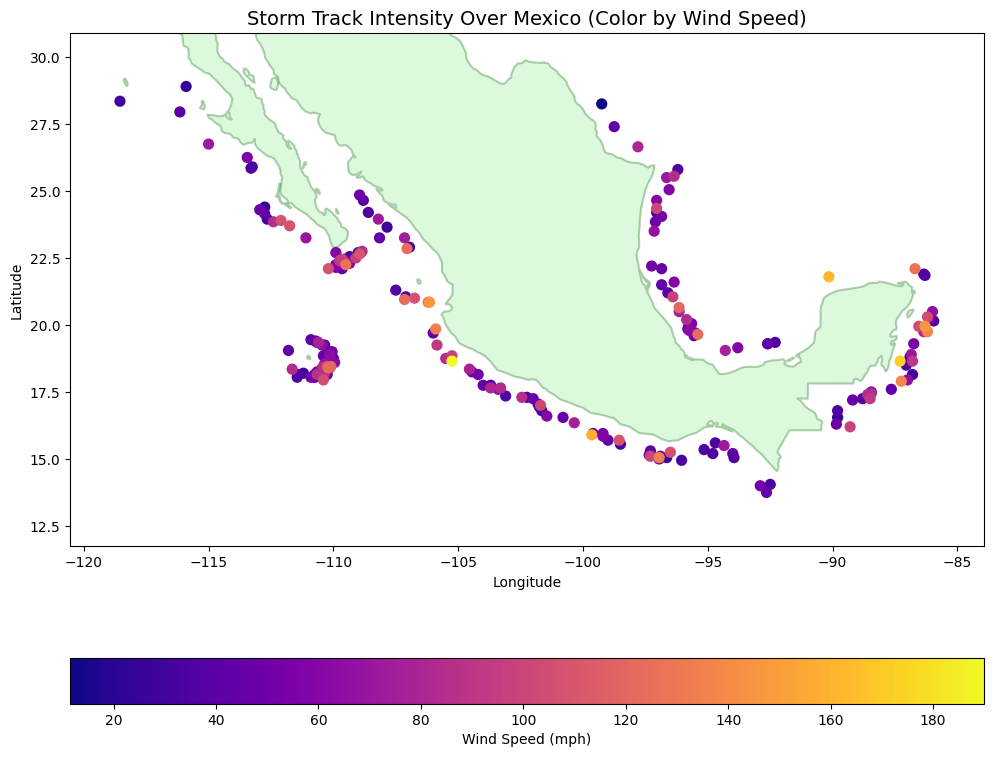

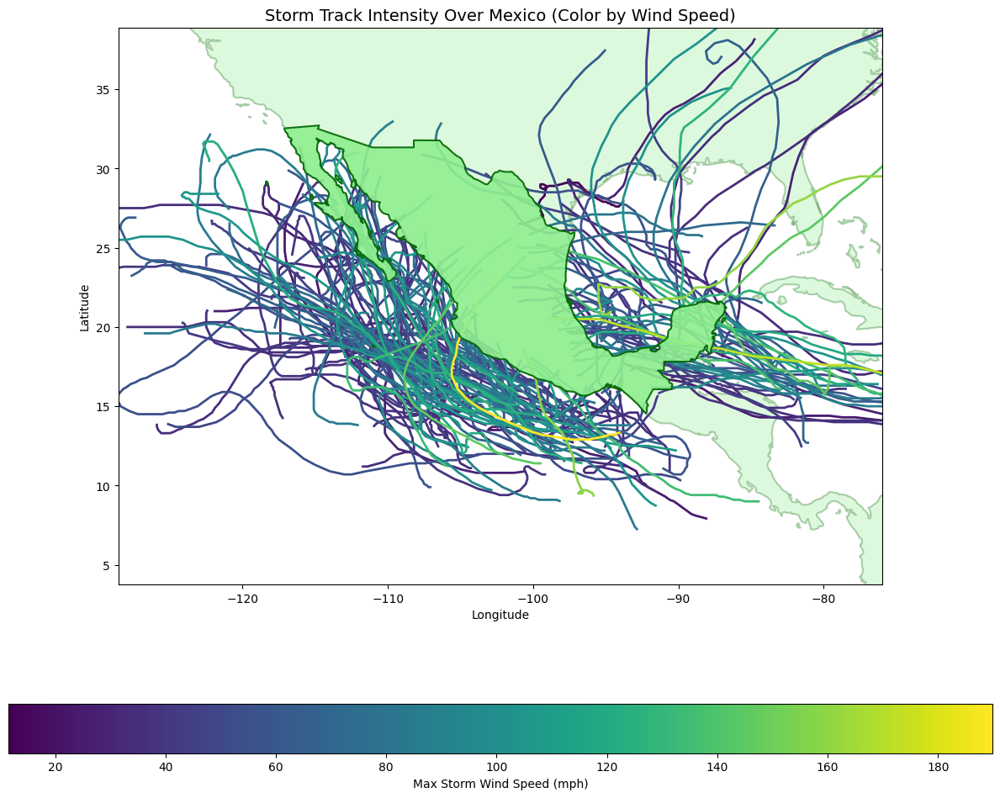

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


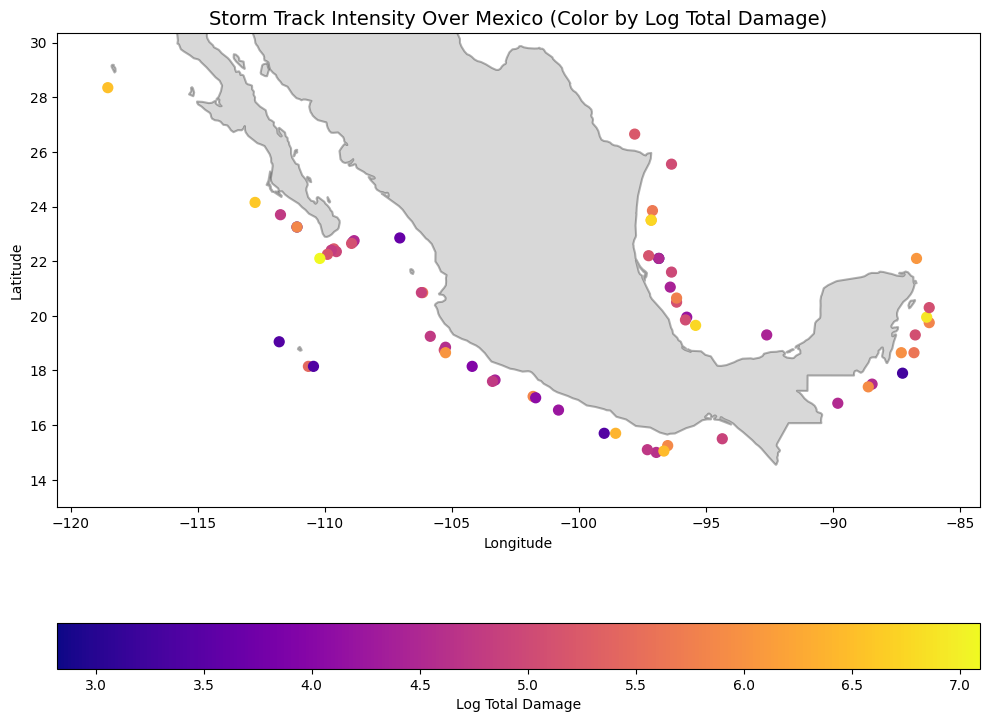

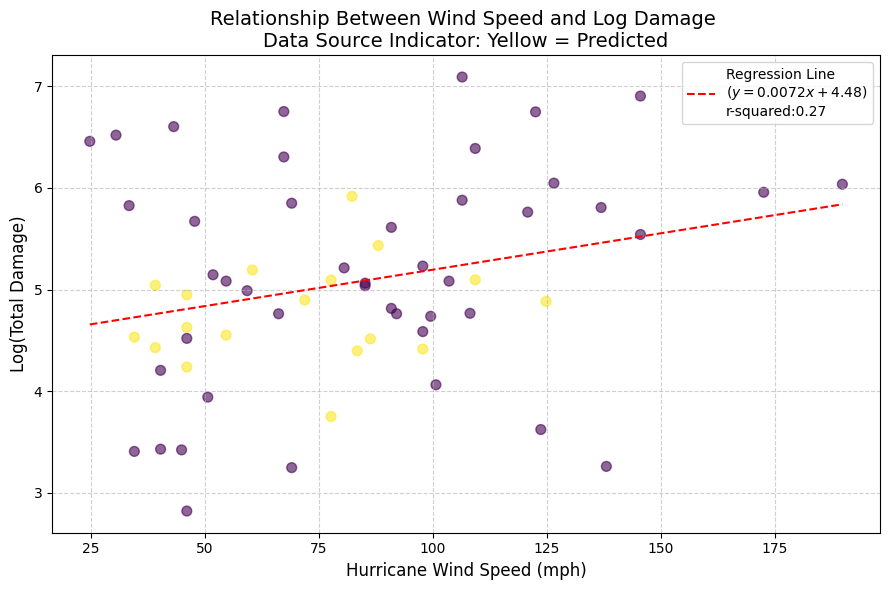

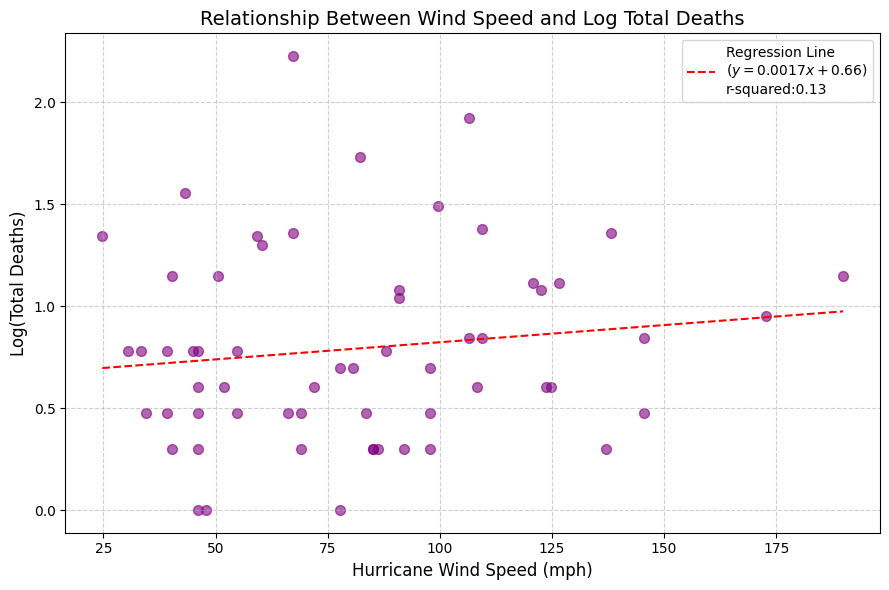

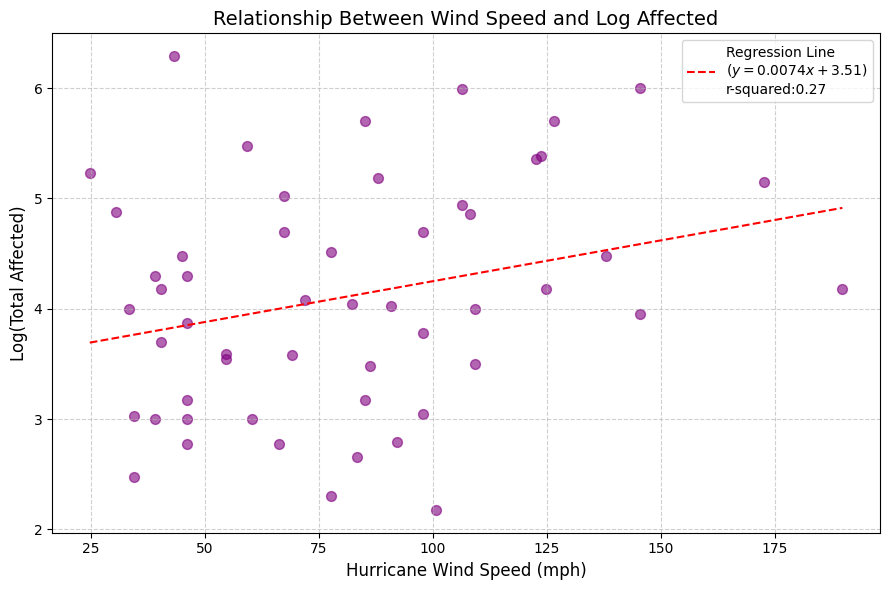

In [191]:
get_graphs_for_country('Mexico')

## Vietnam

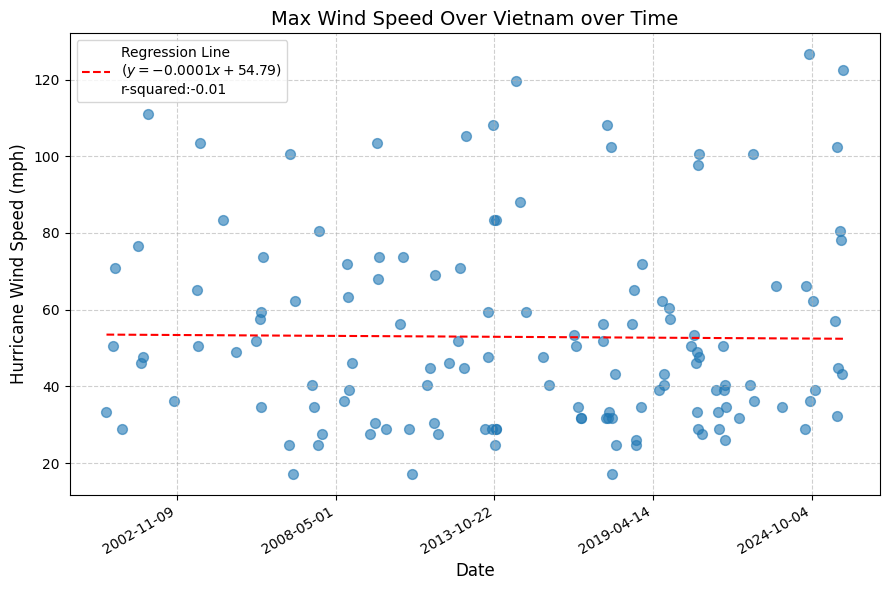

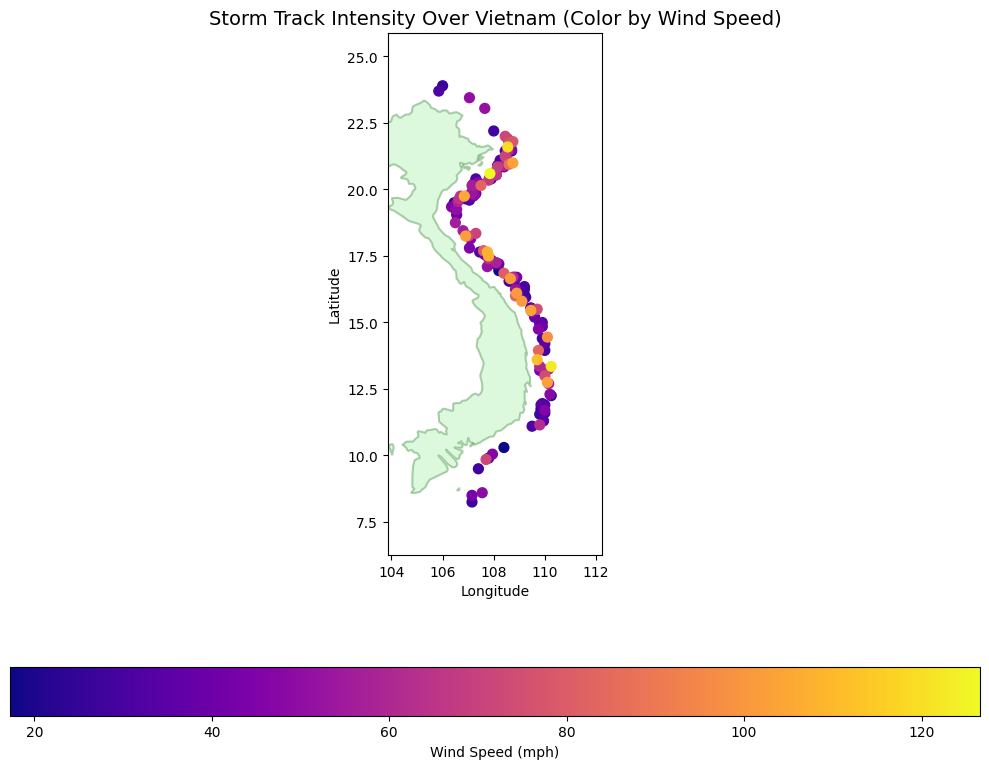

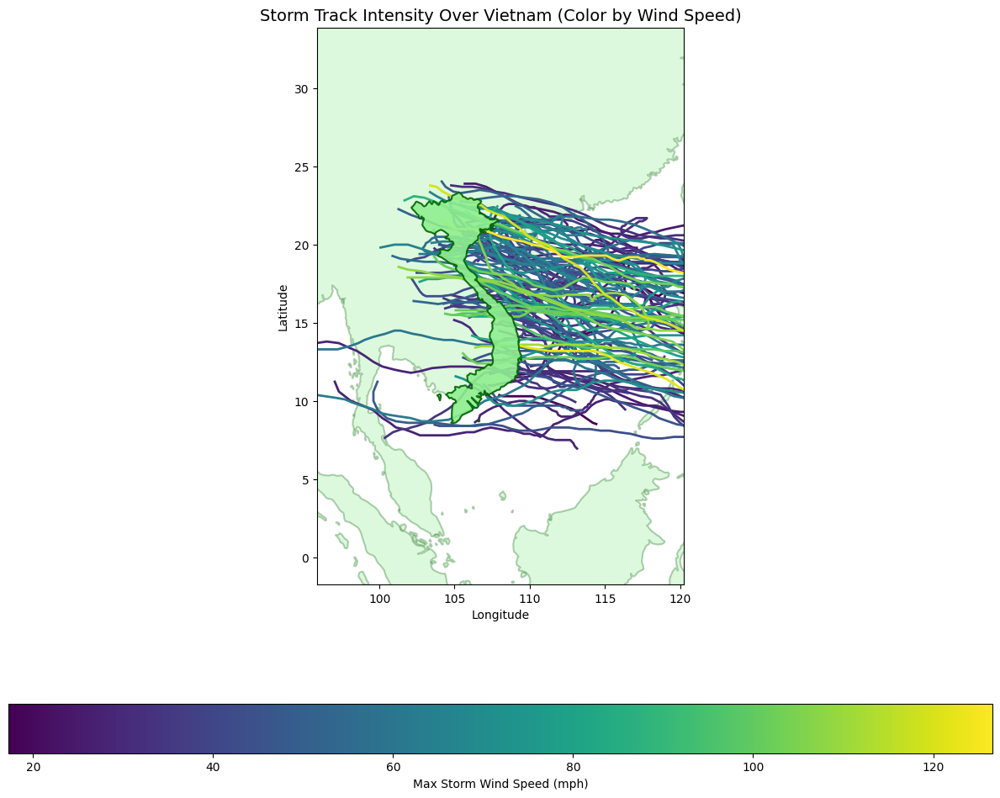

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


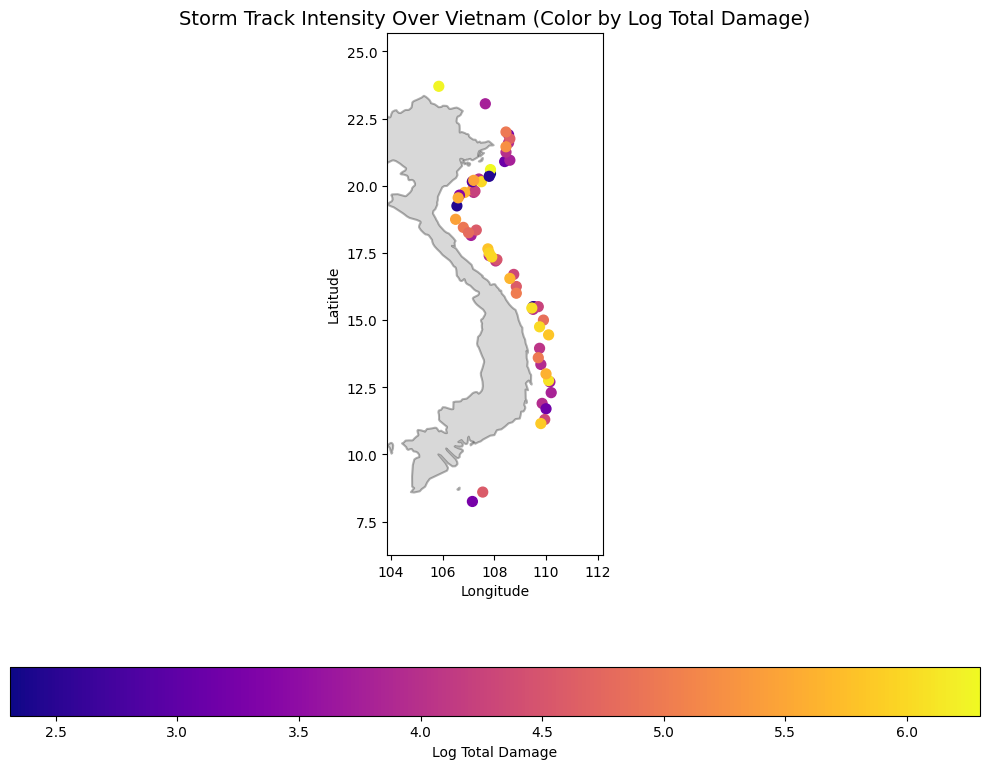

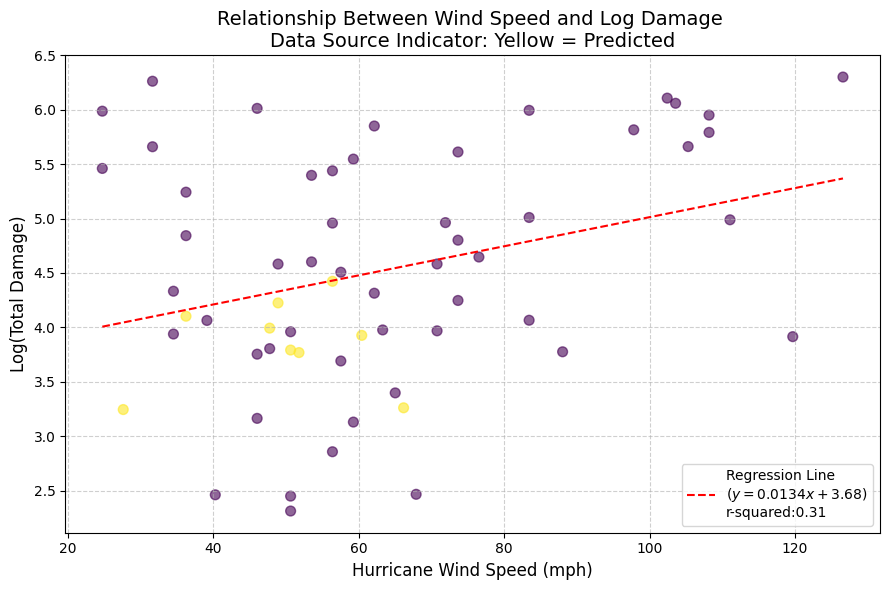

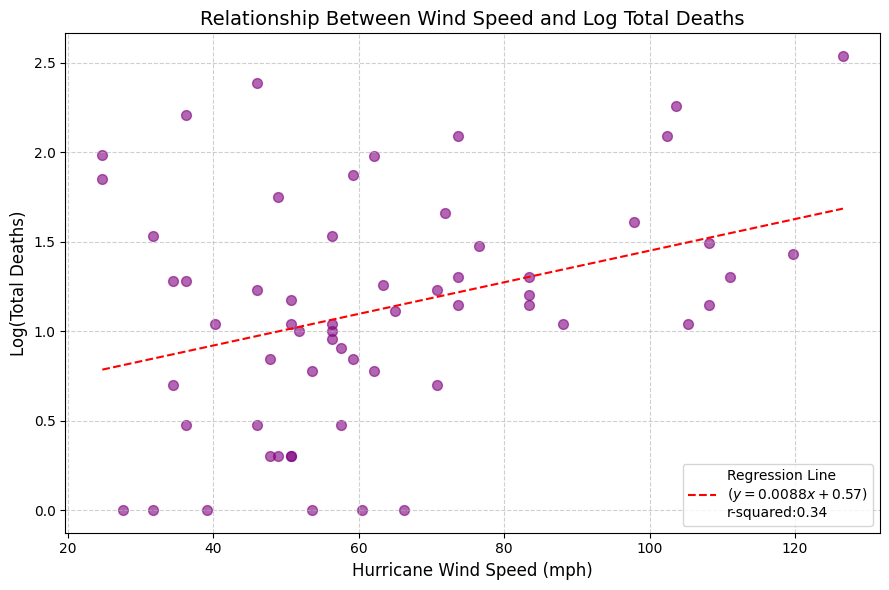

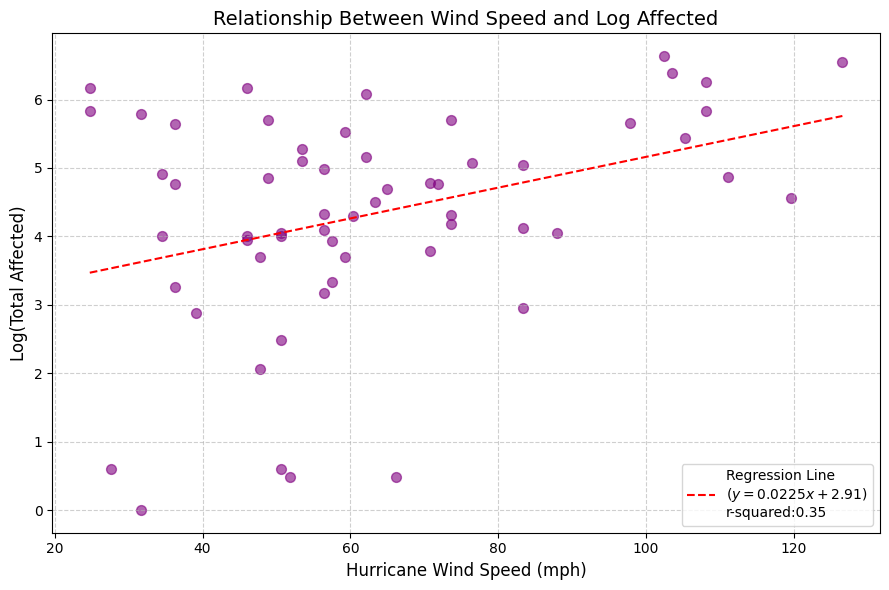

In [192]:
get_graphs_for_country('Vietnam')

## United States

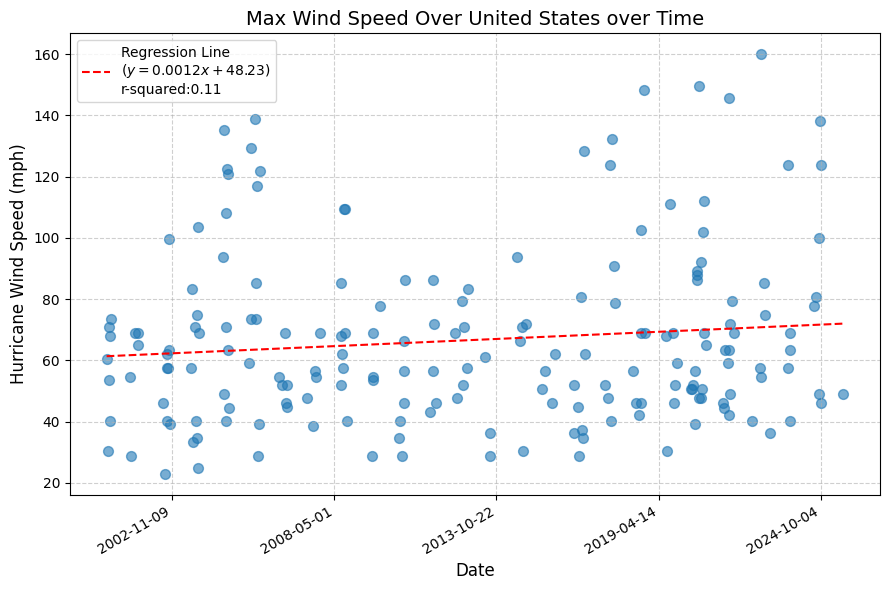

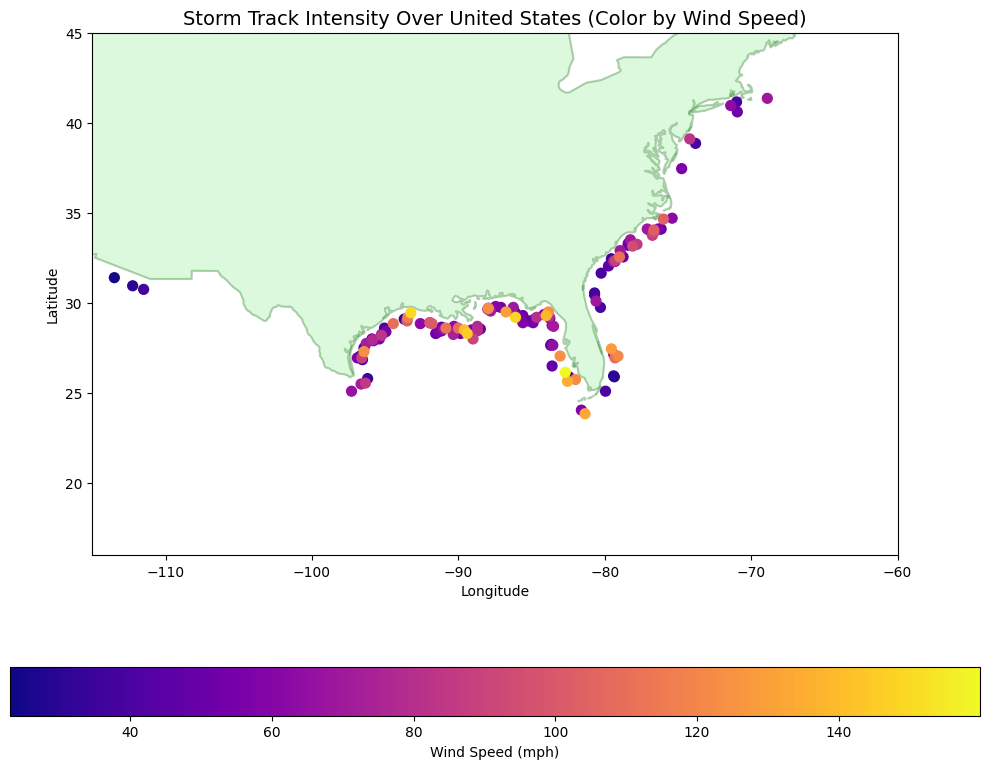

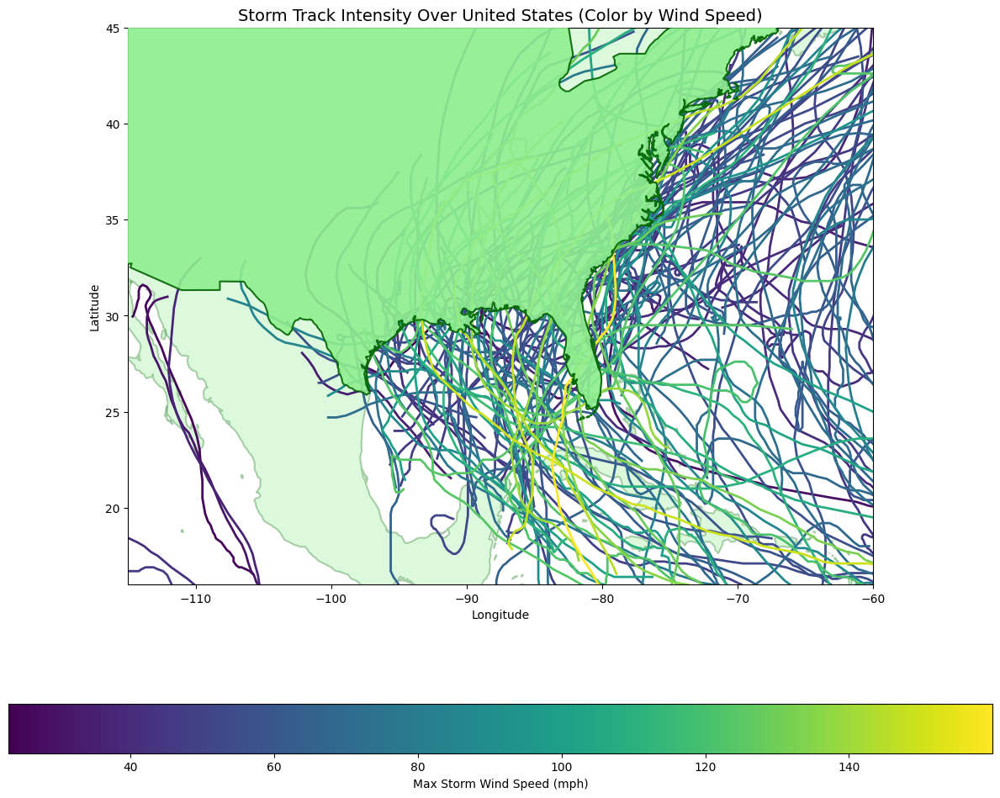

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


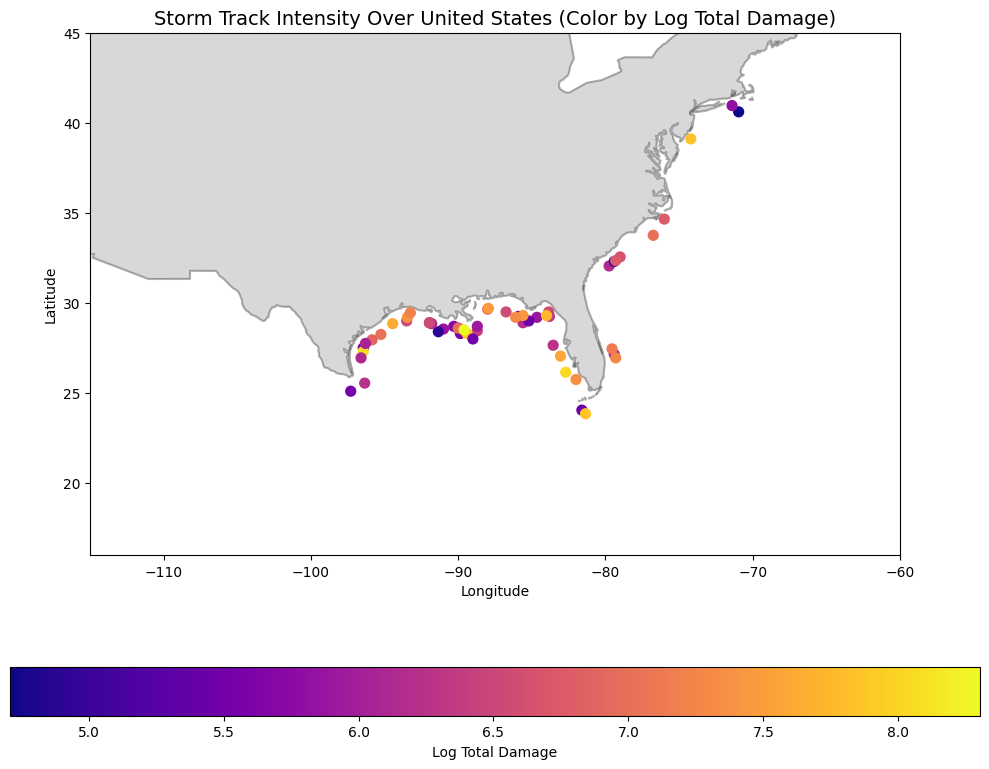

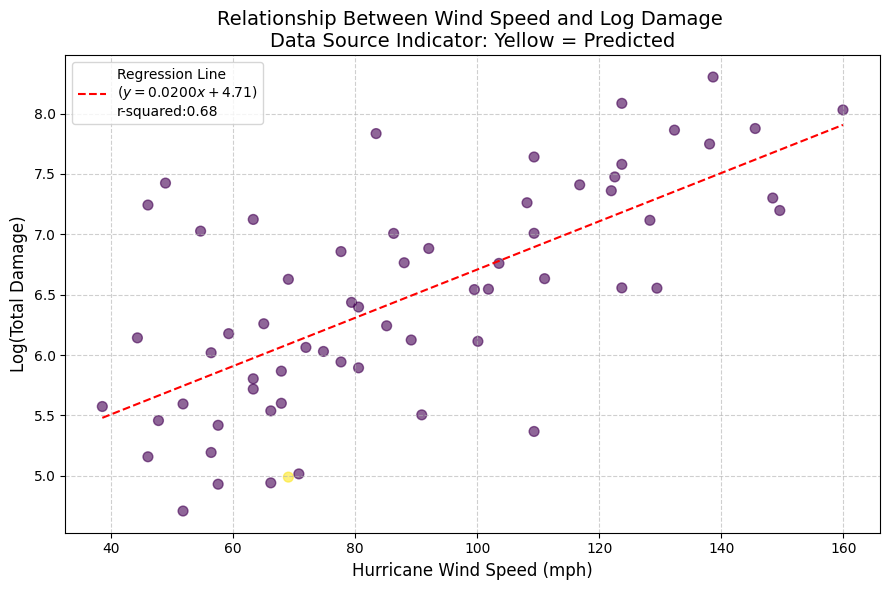

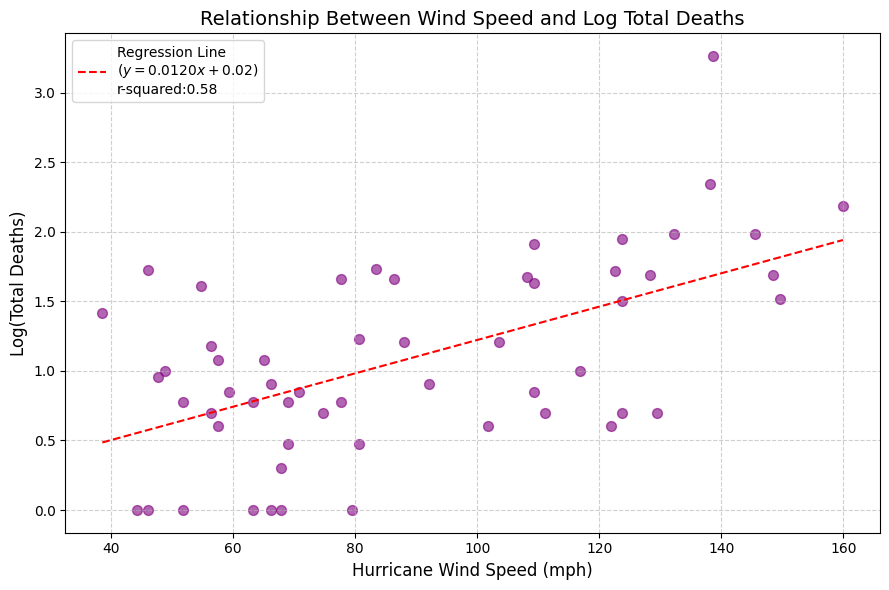

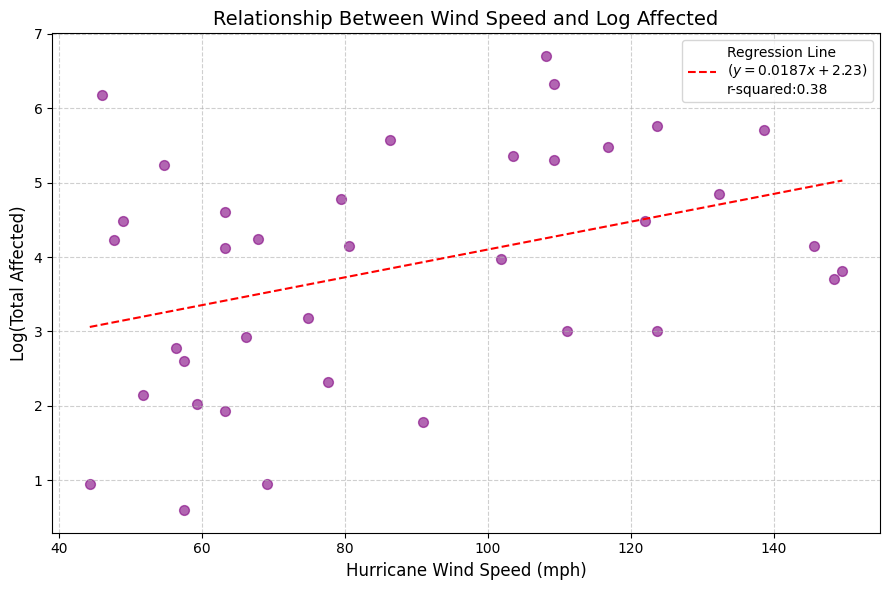

In [193]:
get_graphs_for_country('United States', 'United States of America')

## Japan

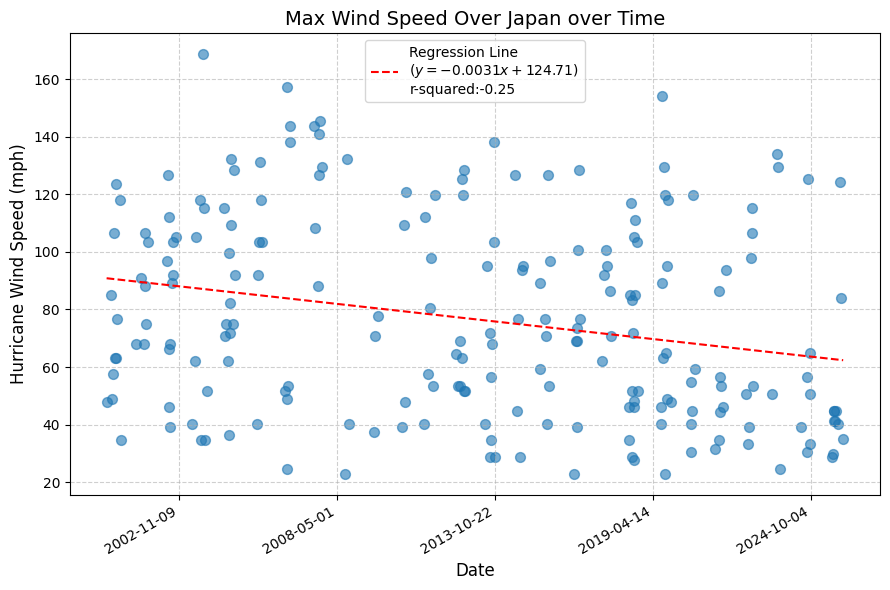

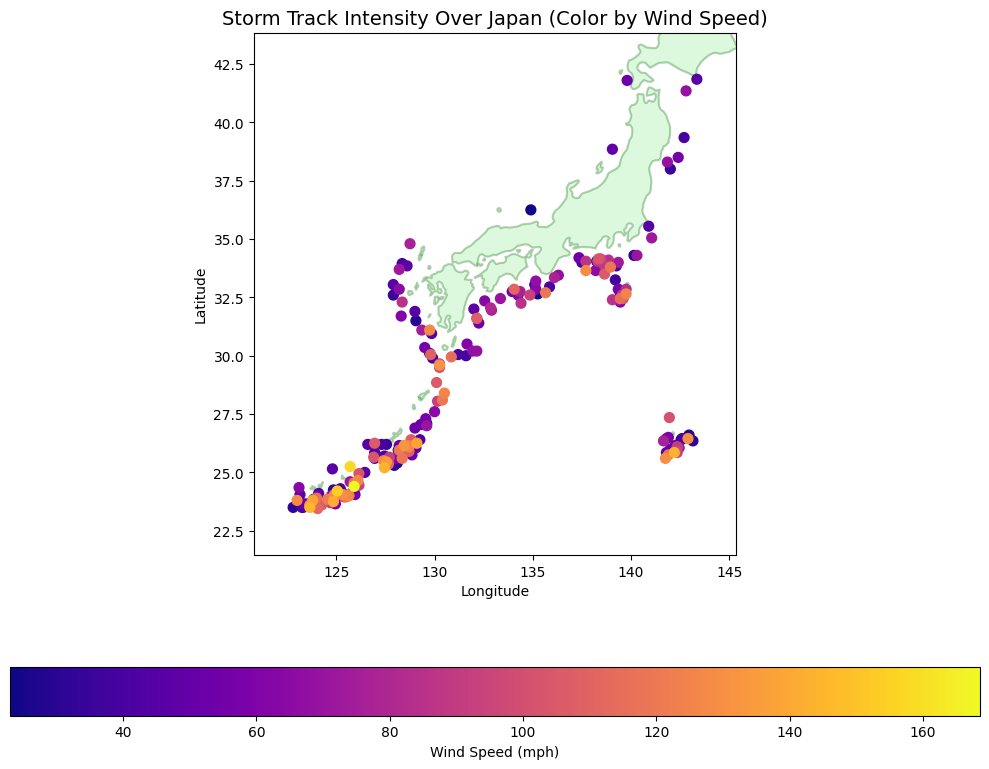

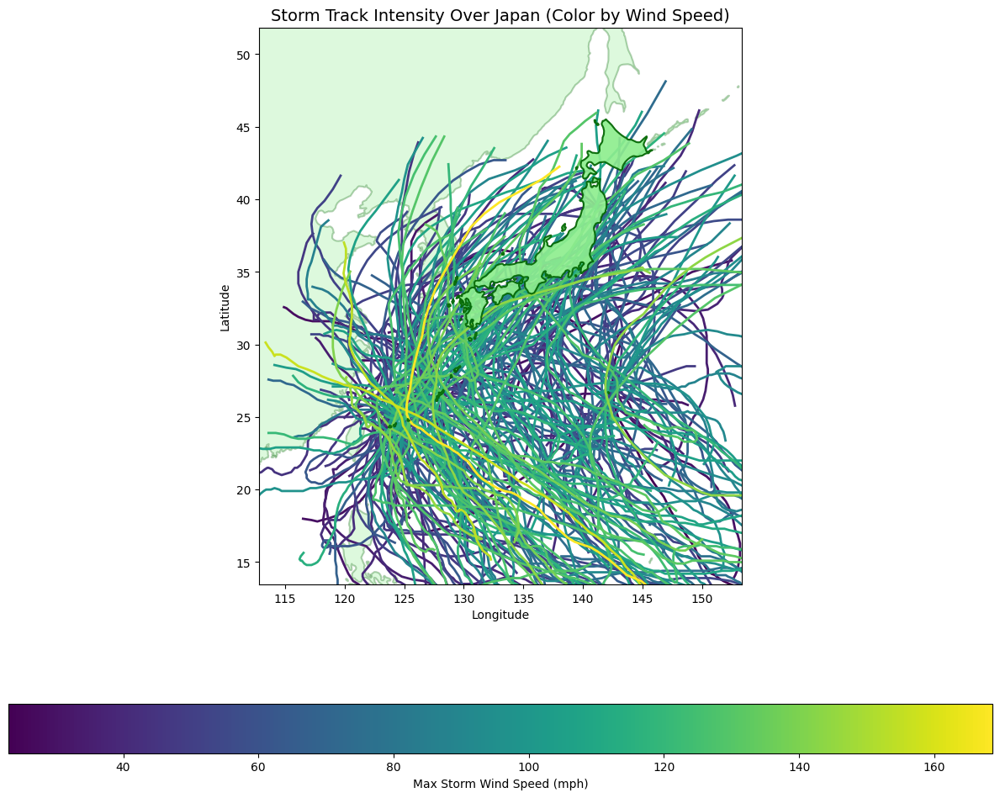

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


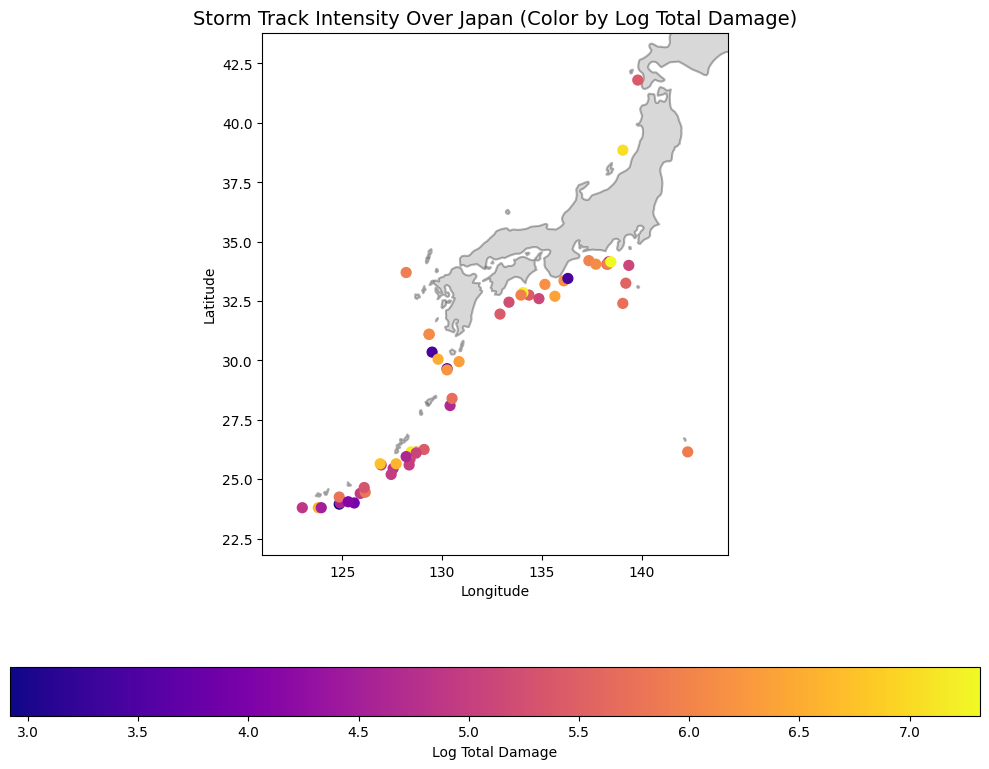

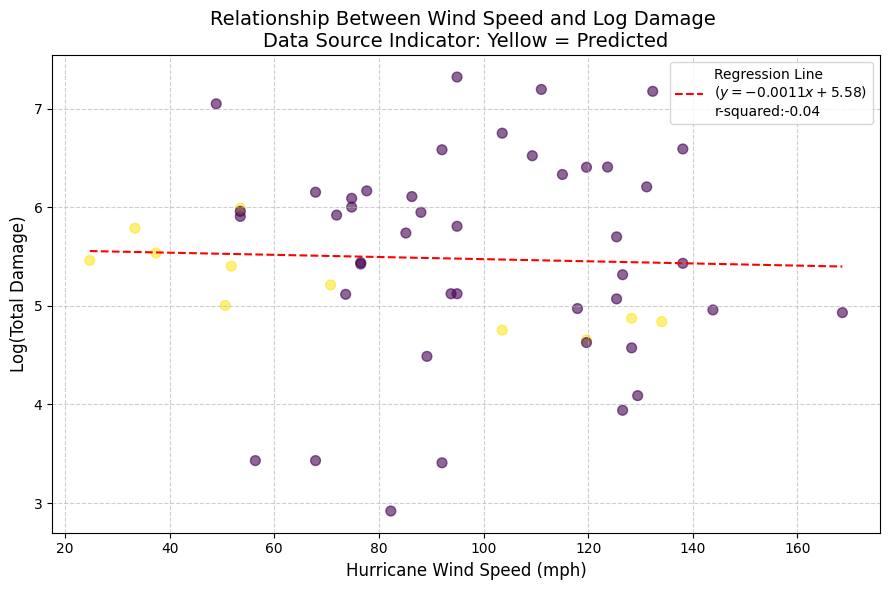

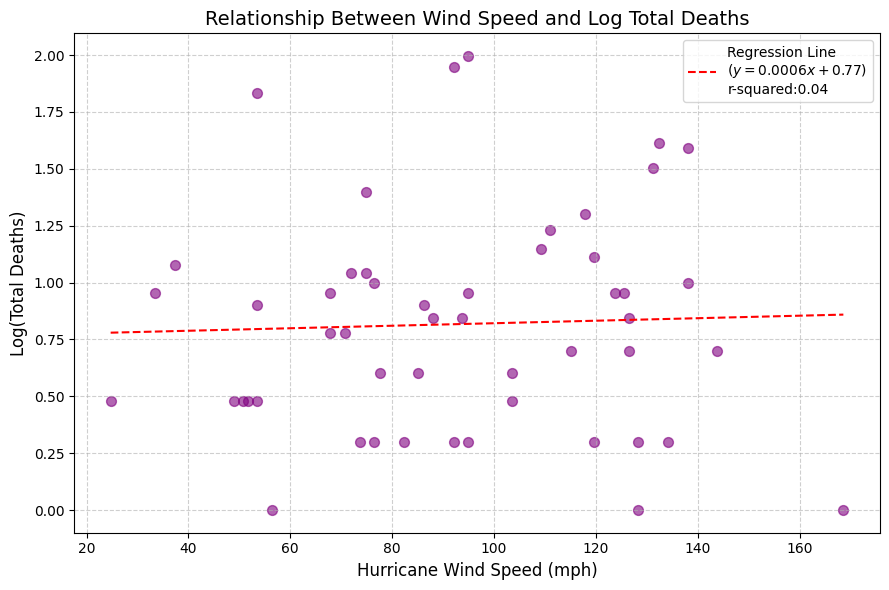

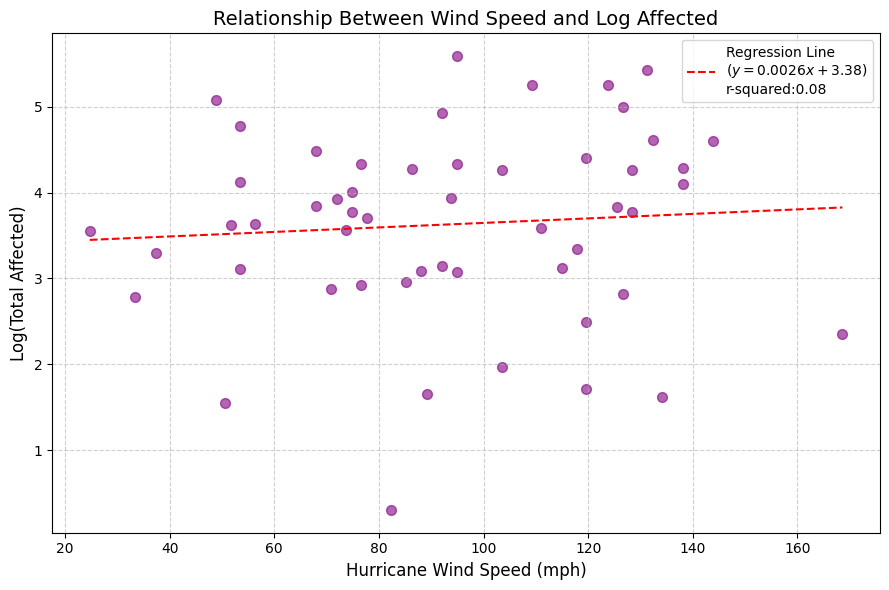

In [194]:
get_graphs_for_country('Japan')

## Taiwan

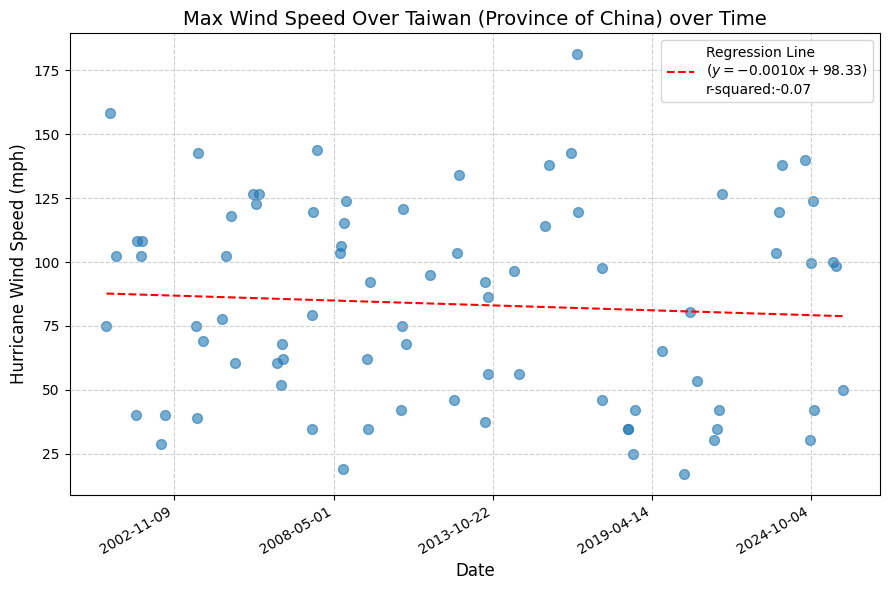

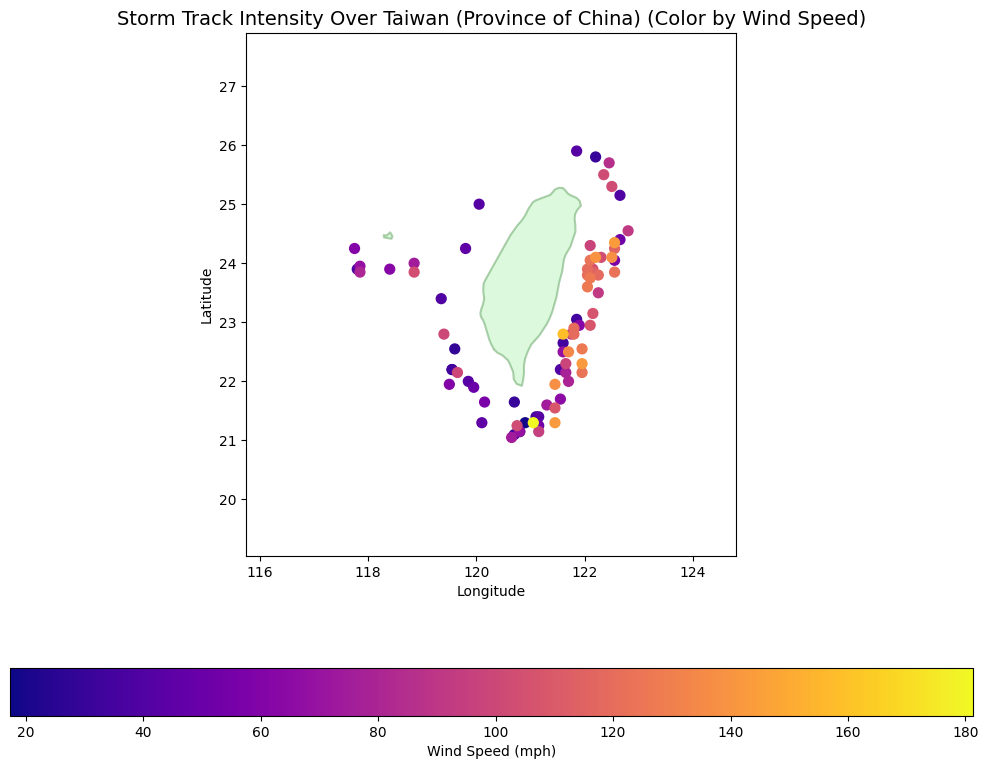

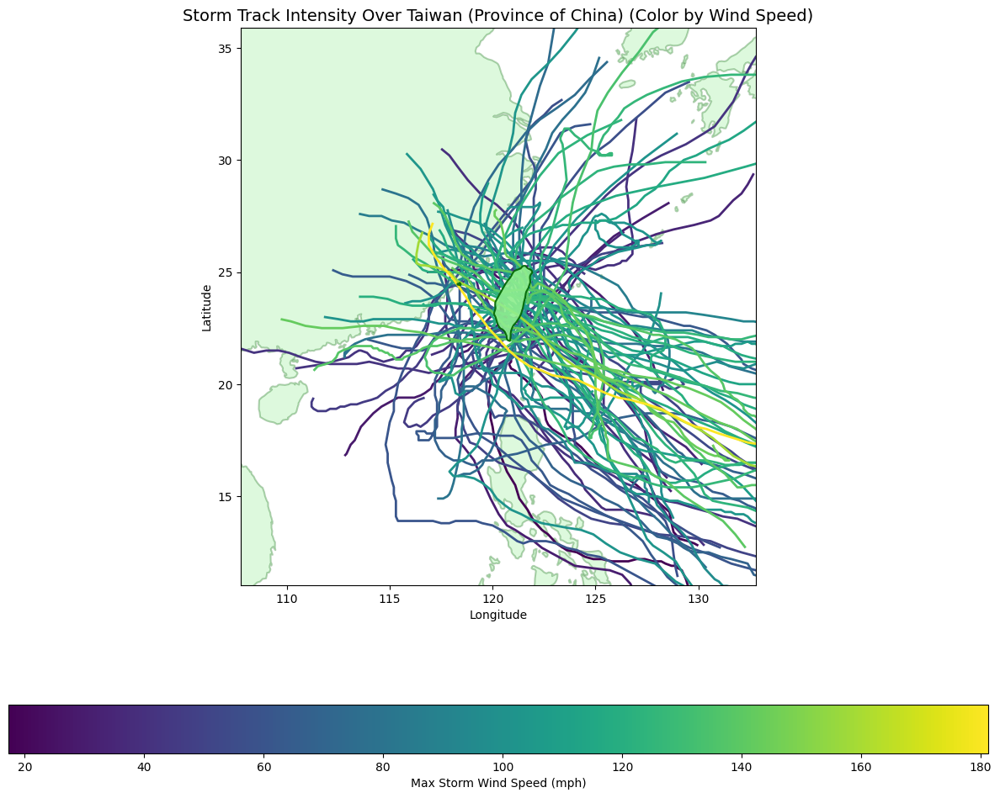

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


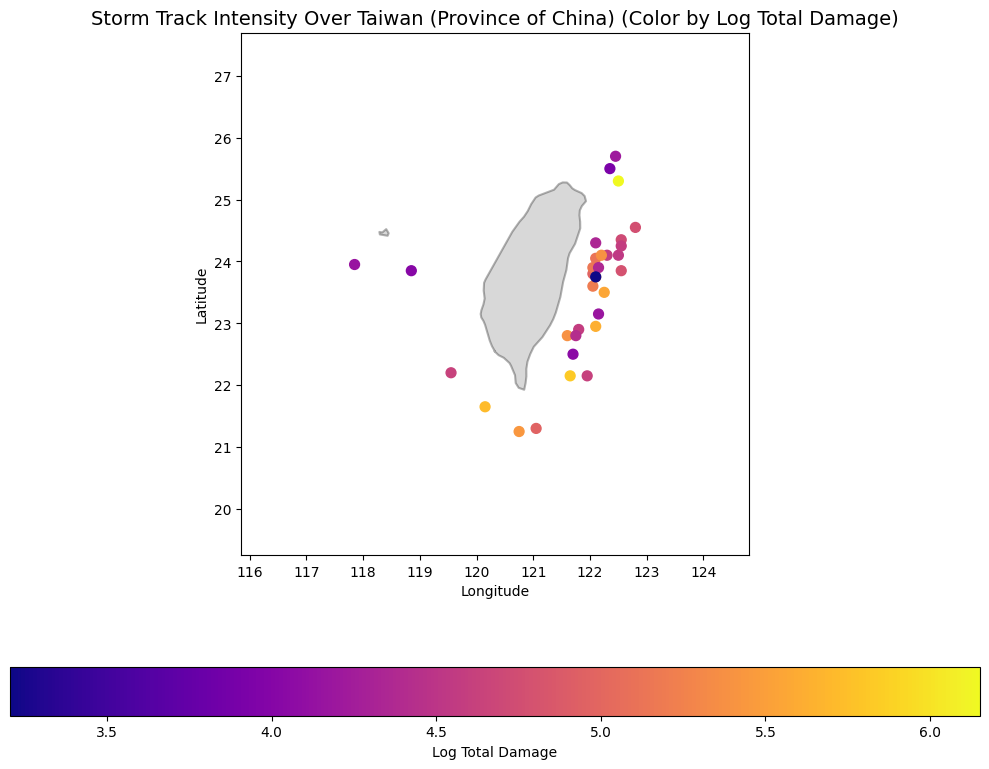

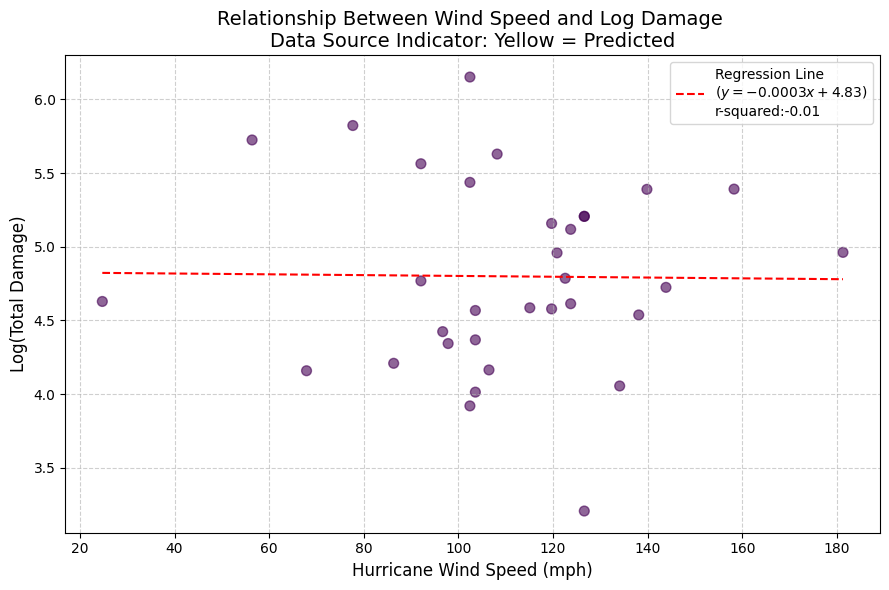

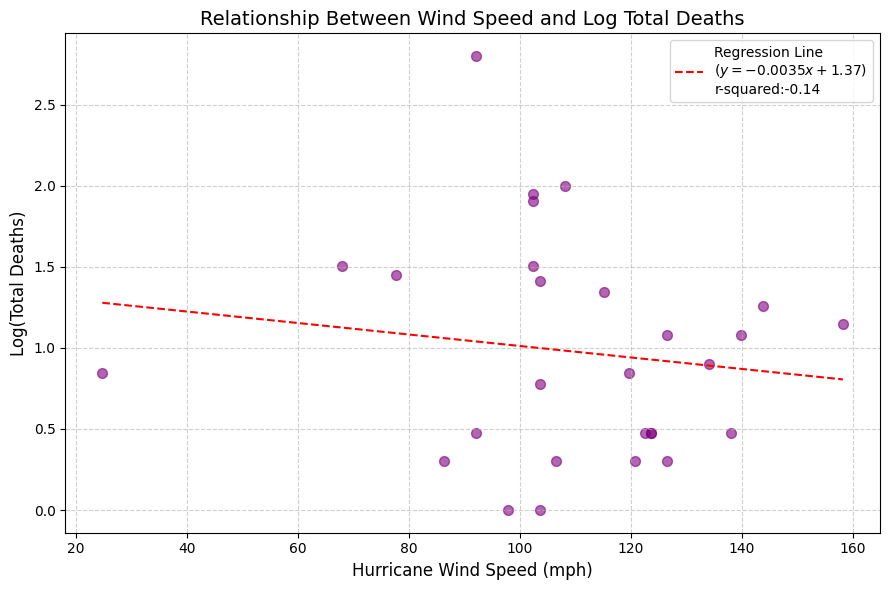

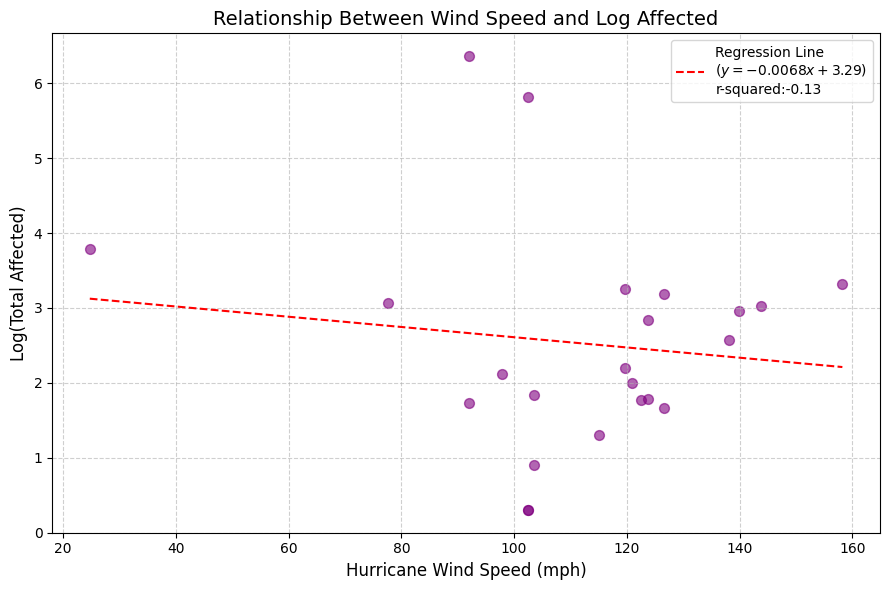

In [195]:
get_graphs_for_country('Taiwan (Province of China)', 'Taiwan')

## India

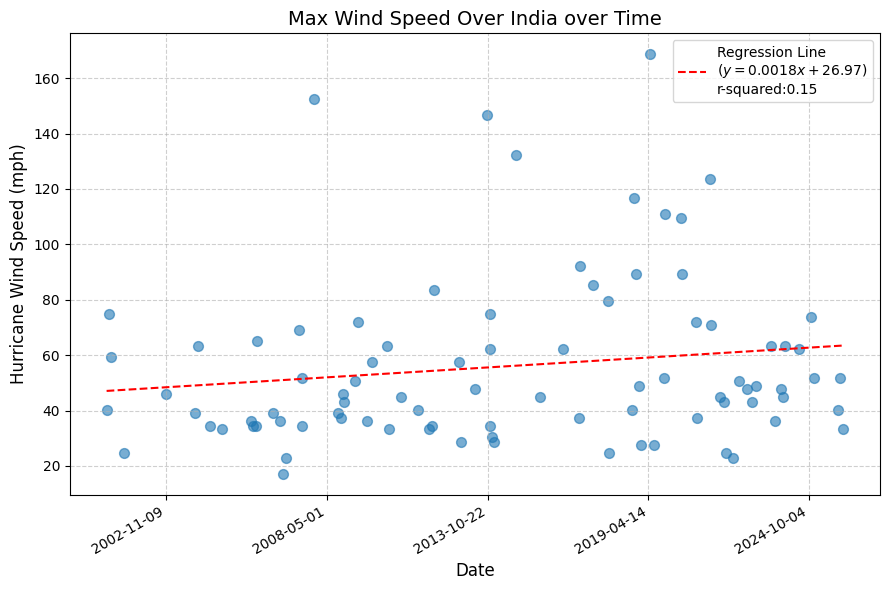

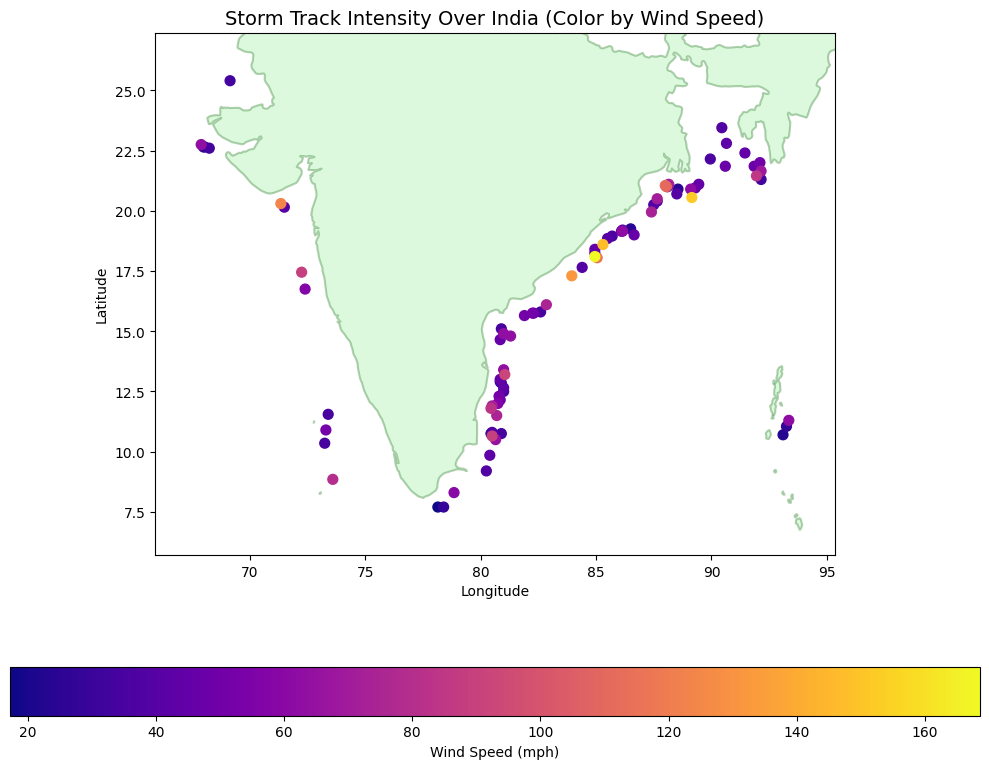

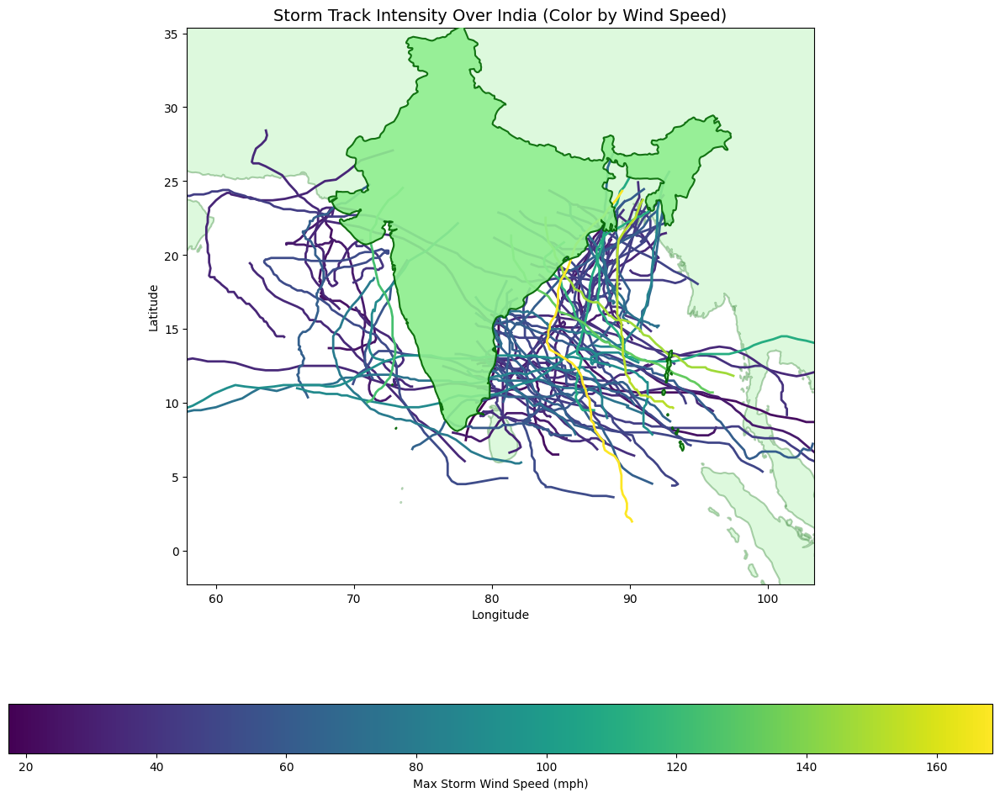

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


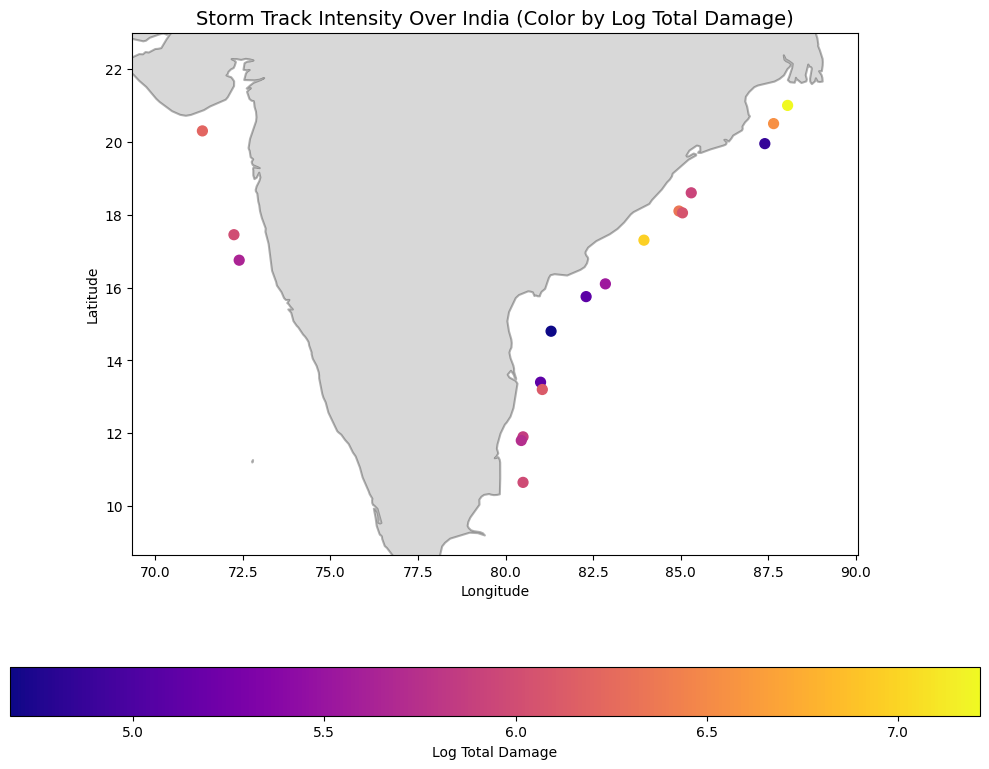

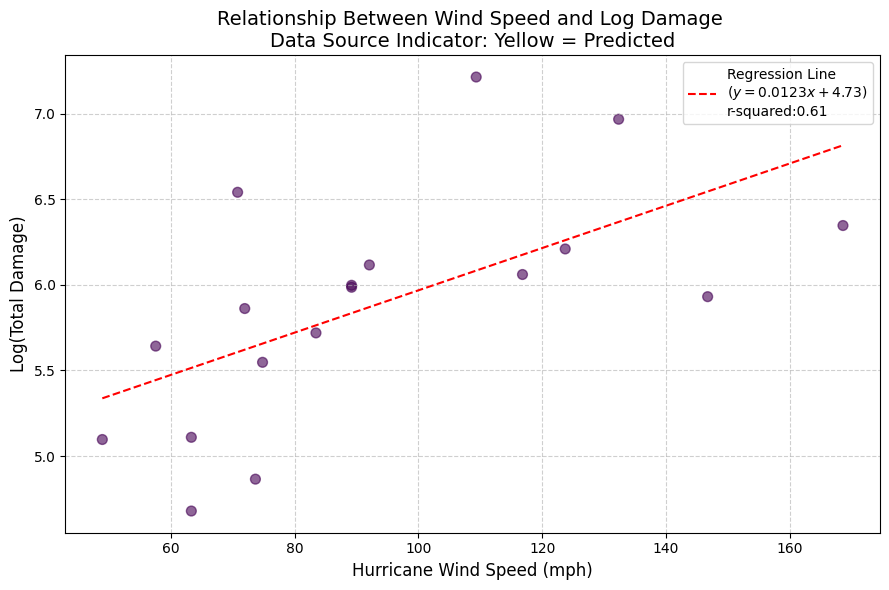

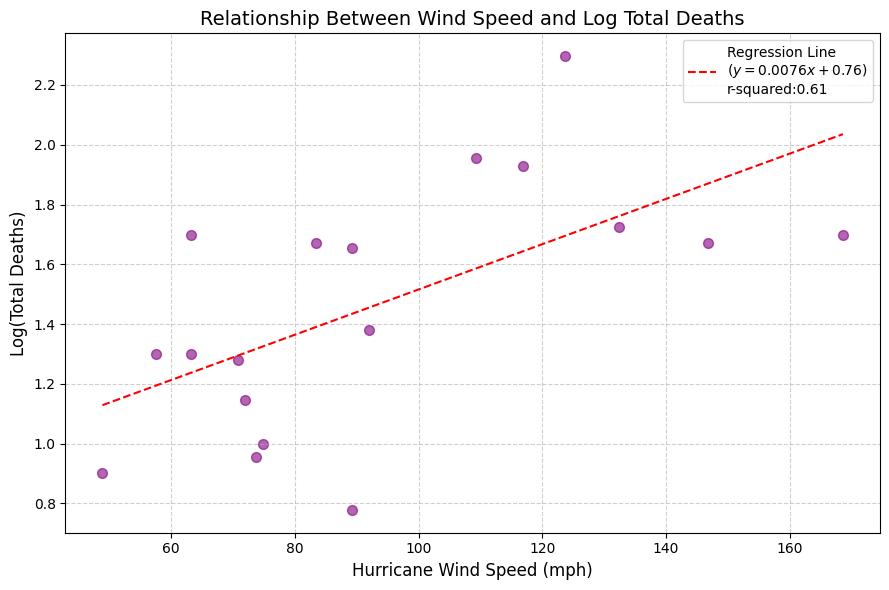

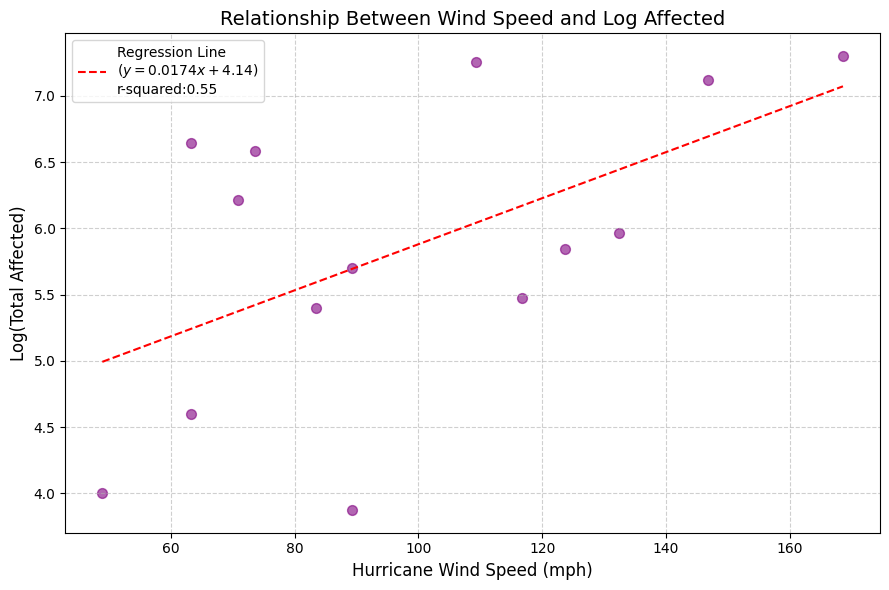

In [196]:
get_graphs_for_country('India')

## Cuba

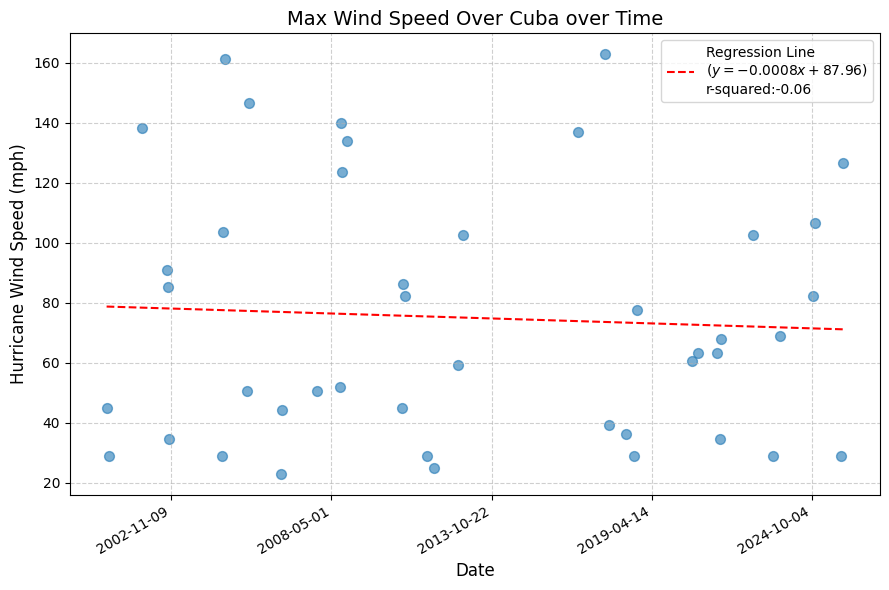

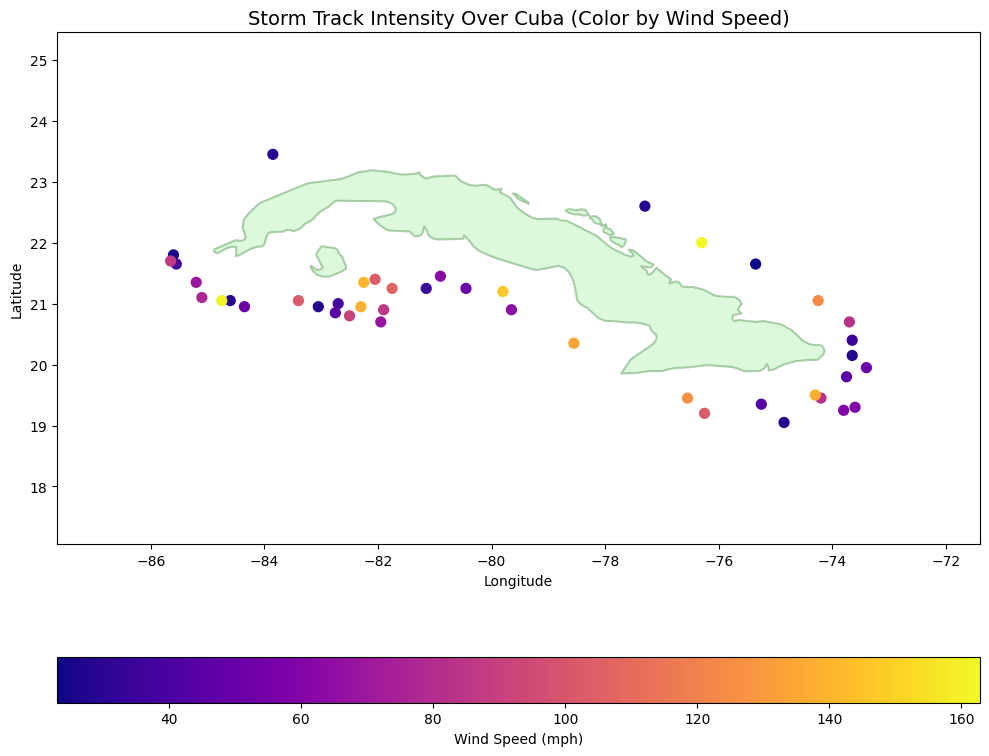

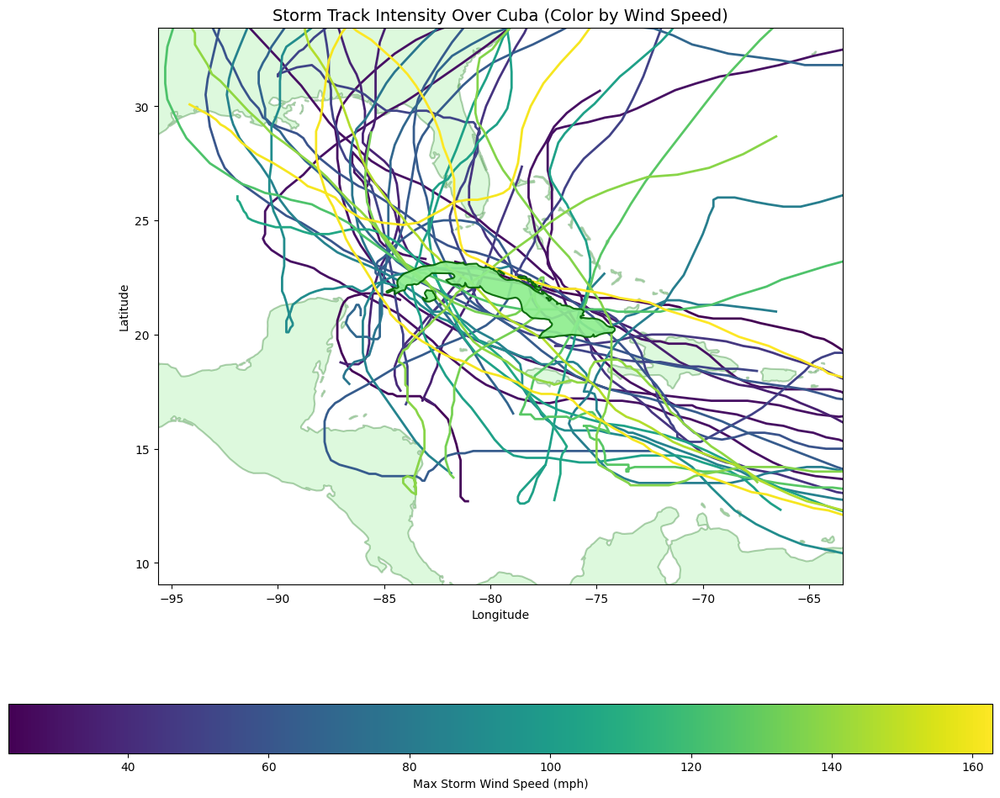

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


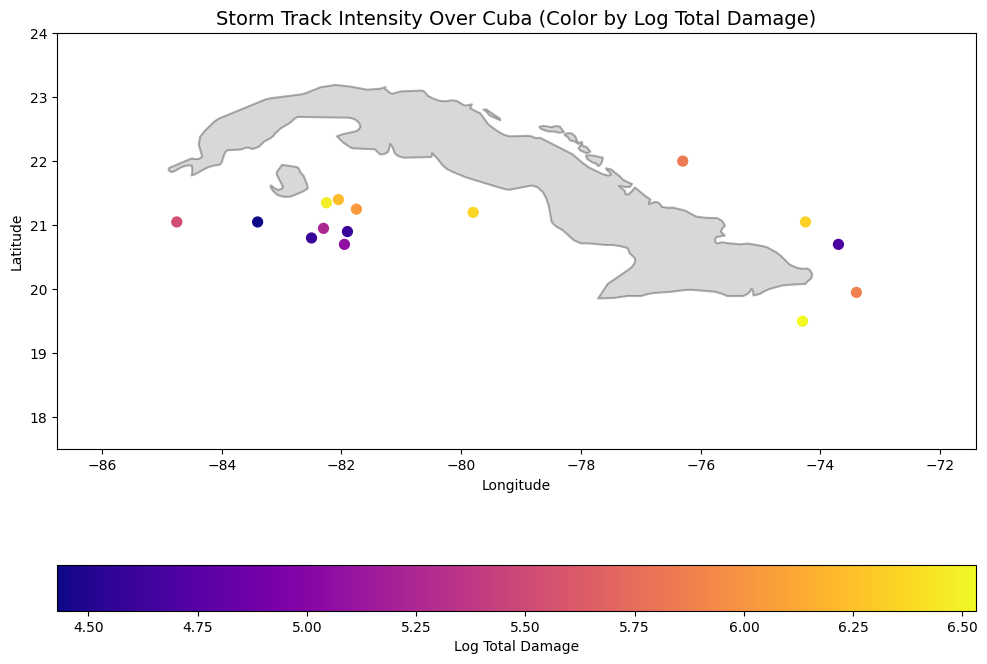

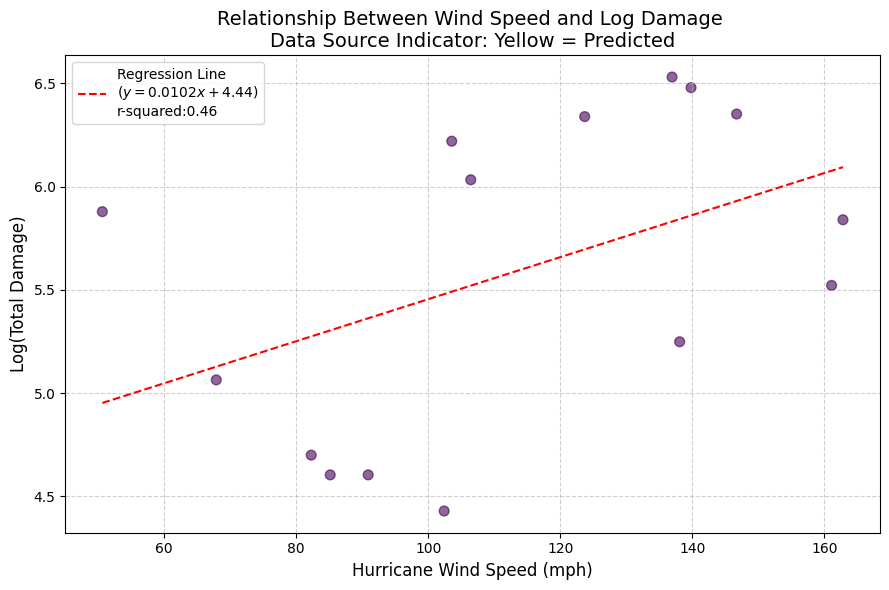

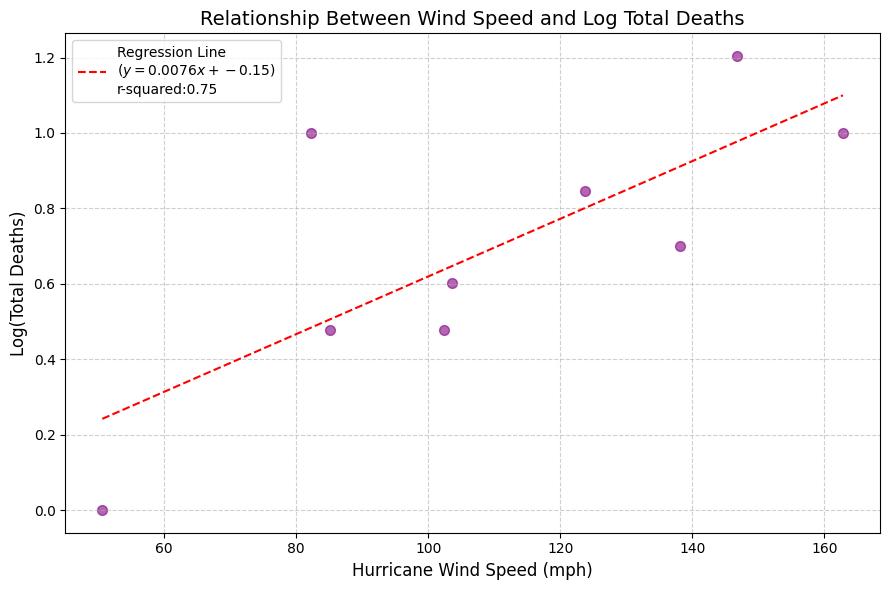

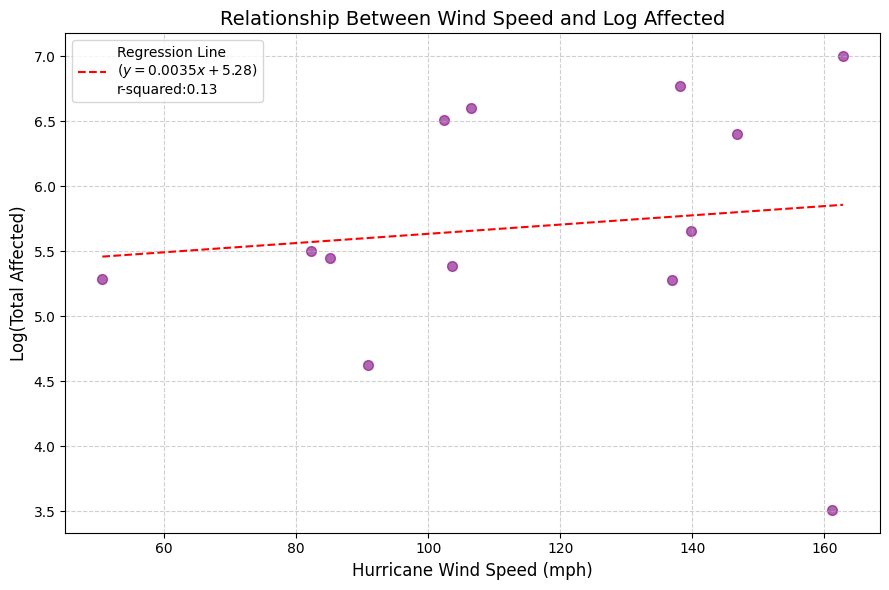

In [197]:
get_graphs_for_country('Cuba')

## Madagascar

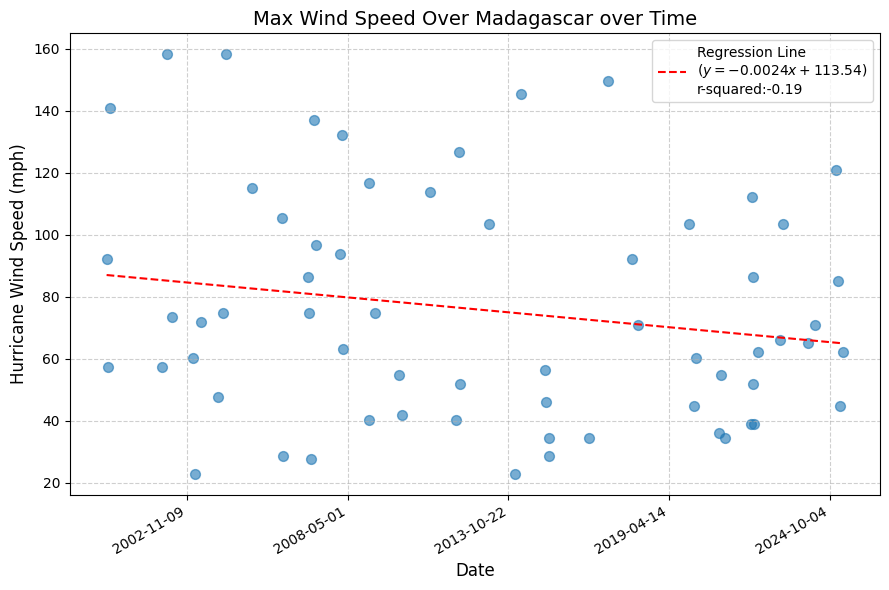

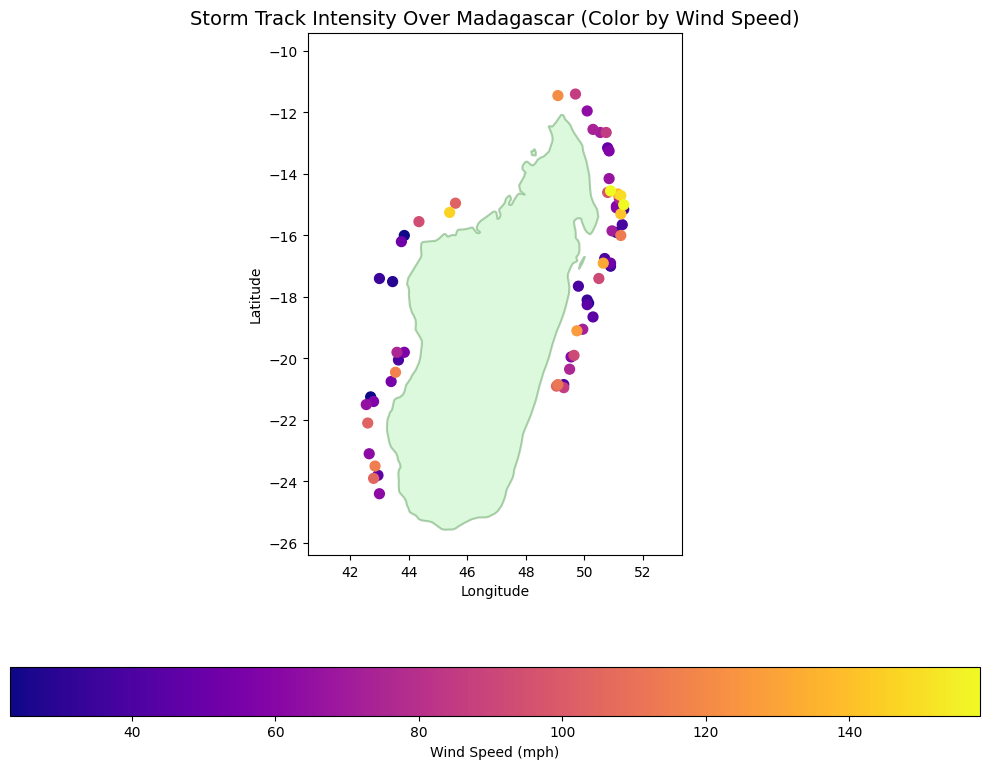

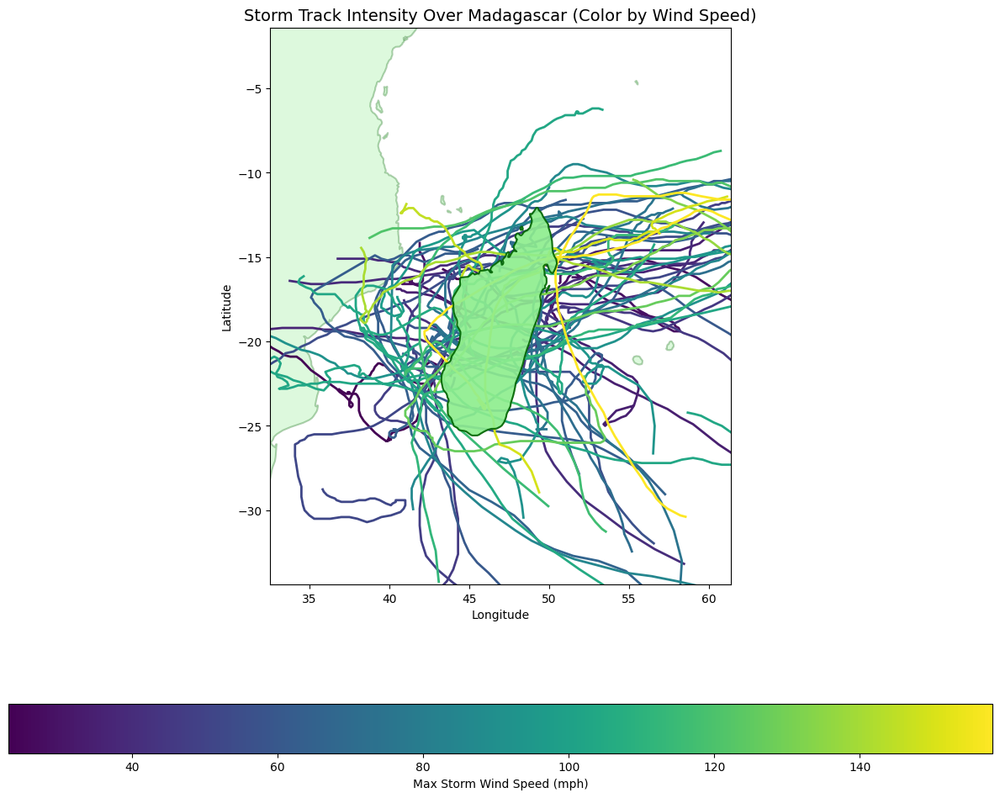

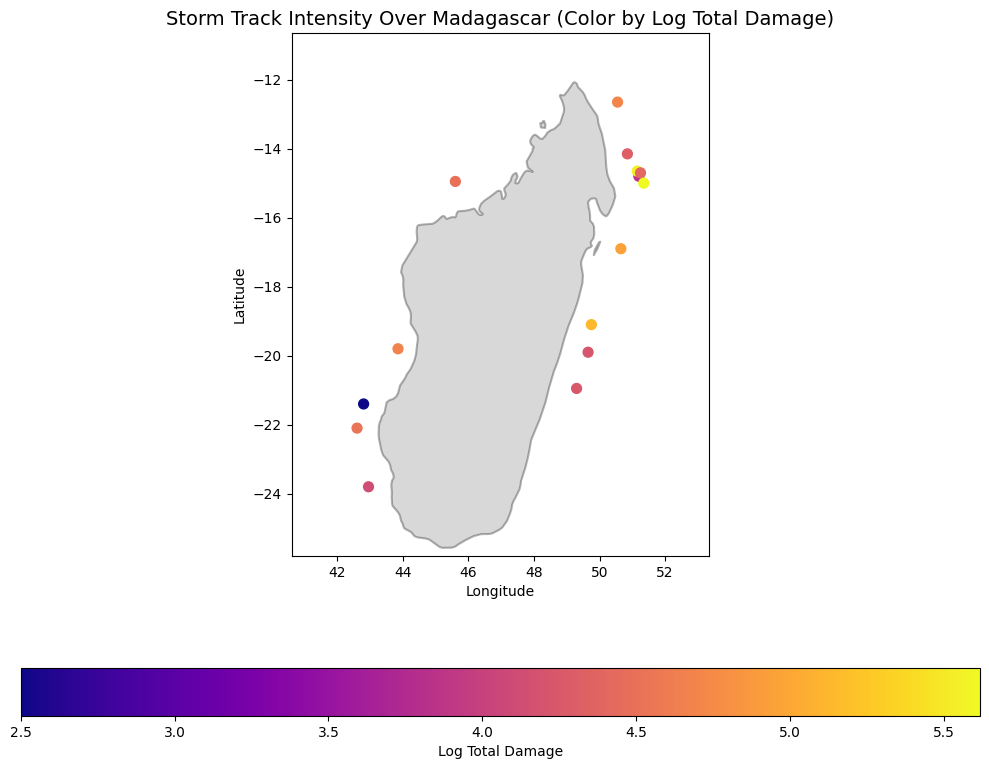

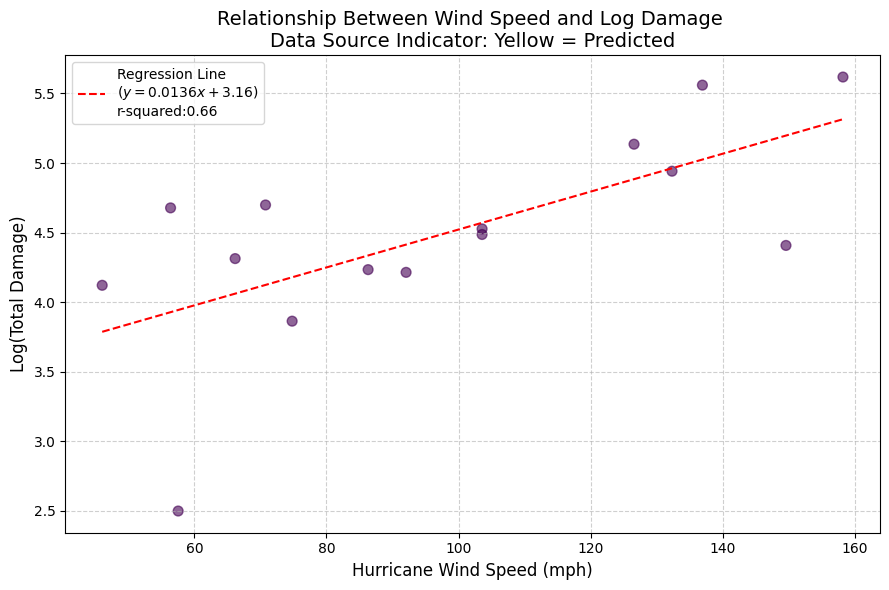

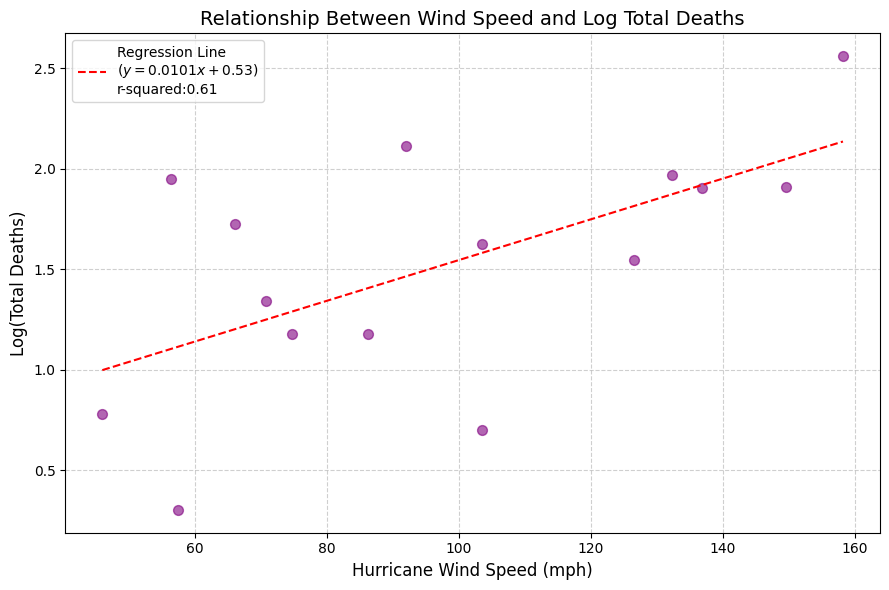

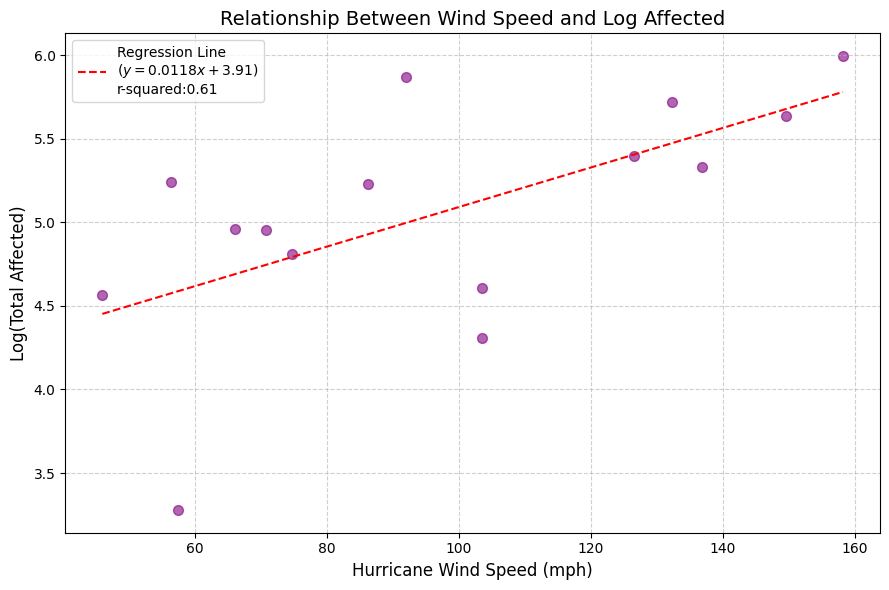

In [198]:
get_graphs_for_country('Madagascar')

## South Korea

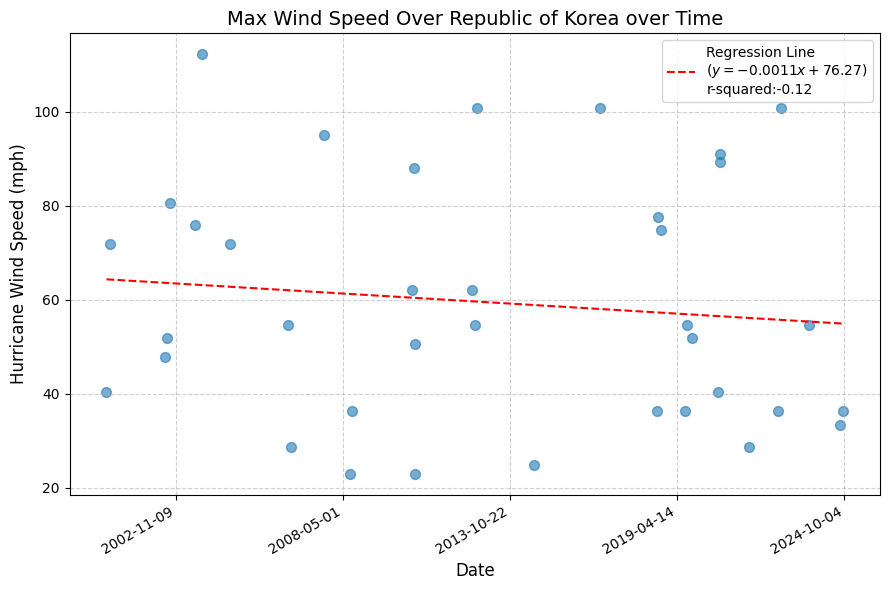

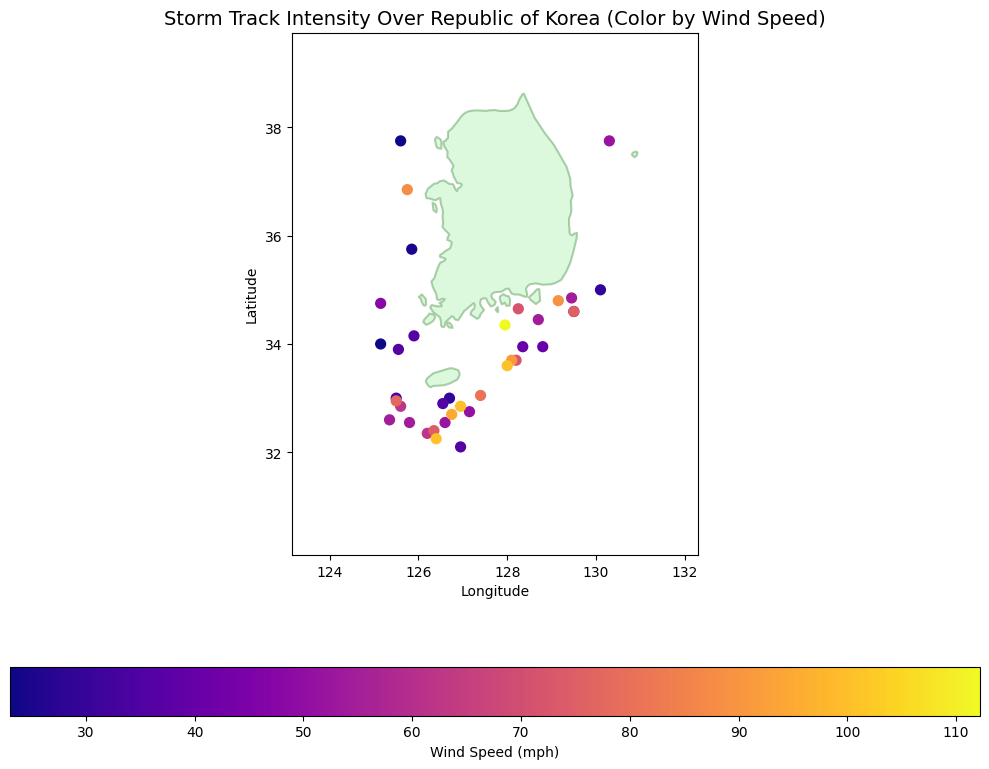

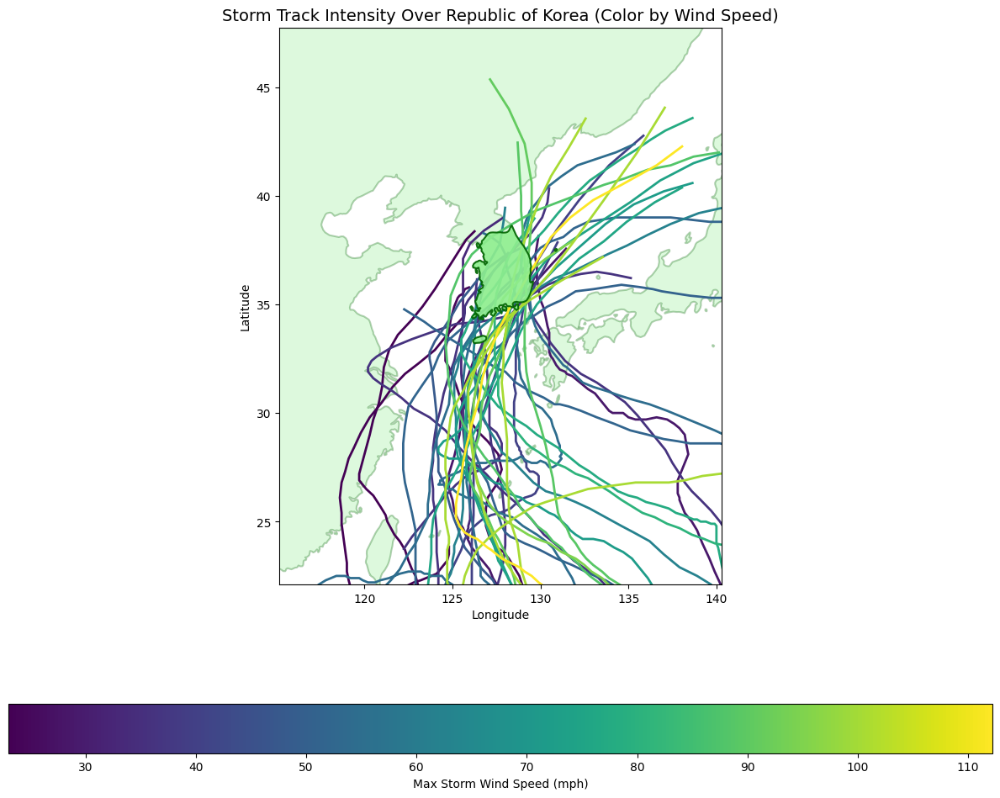

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


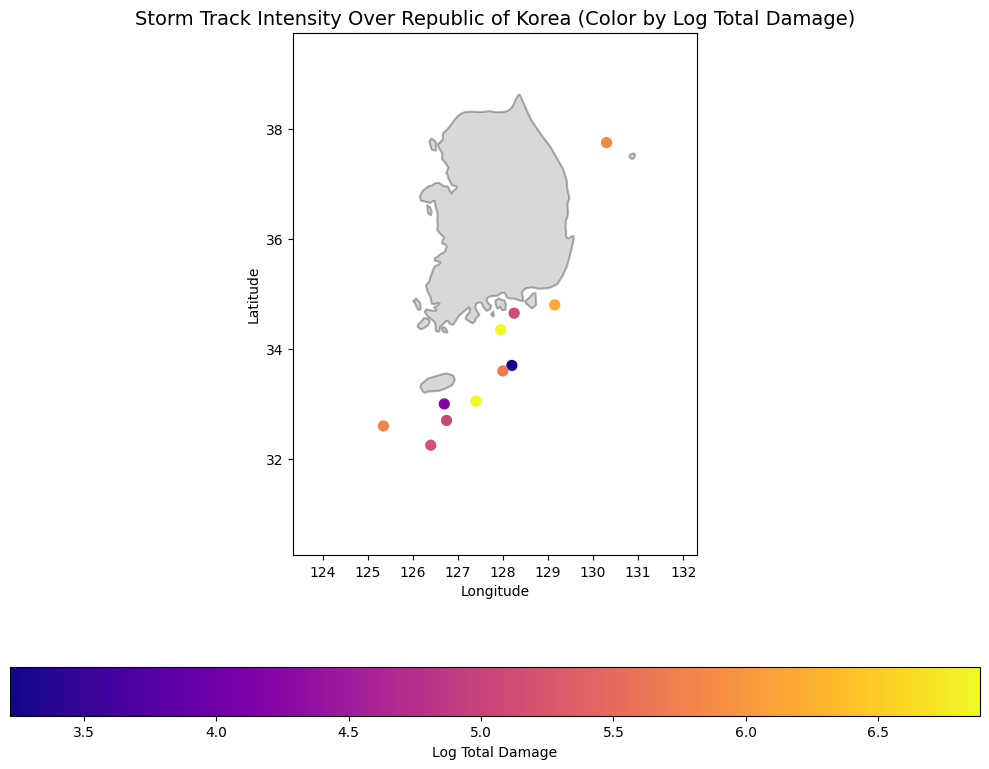

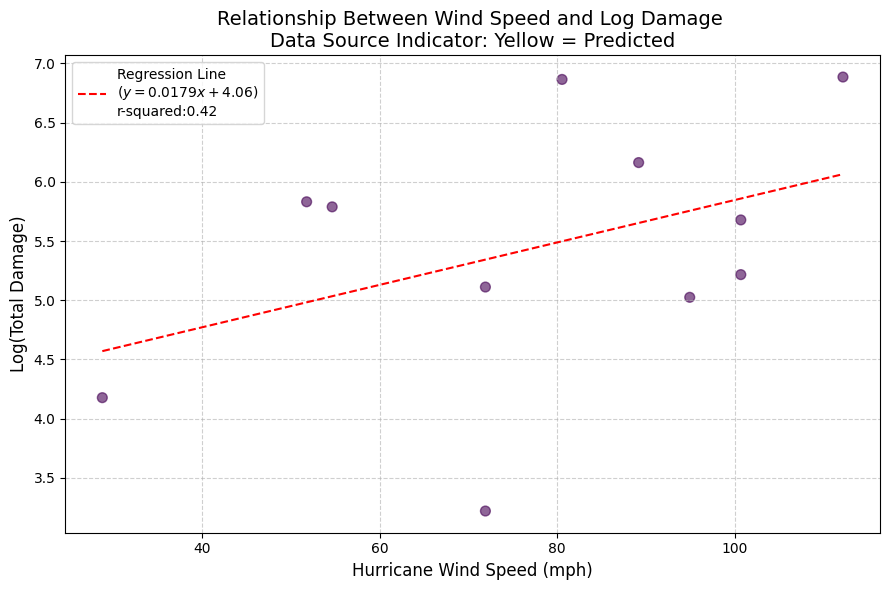

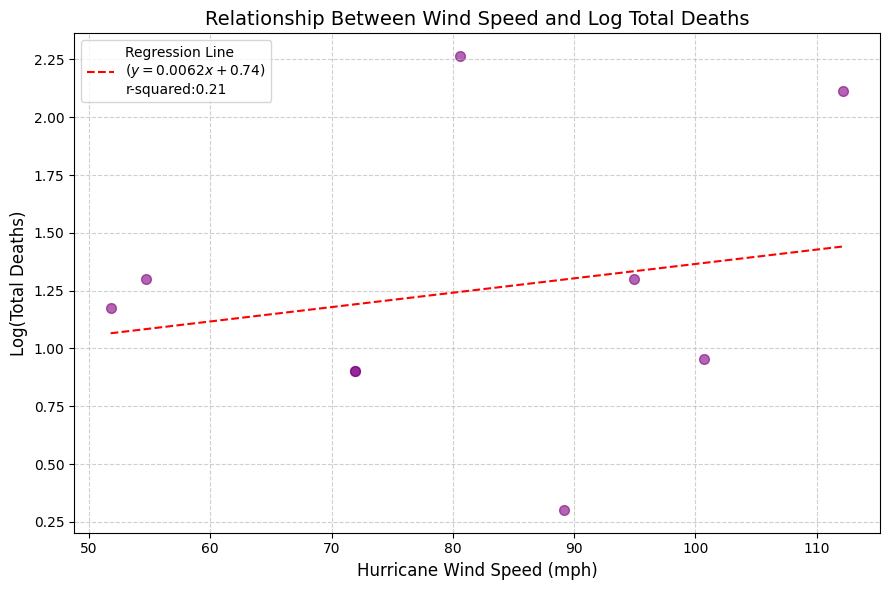

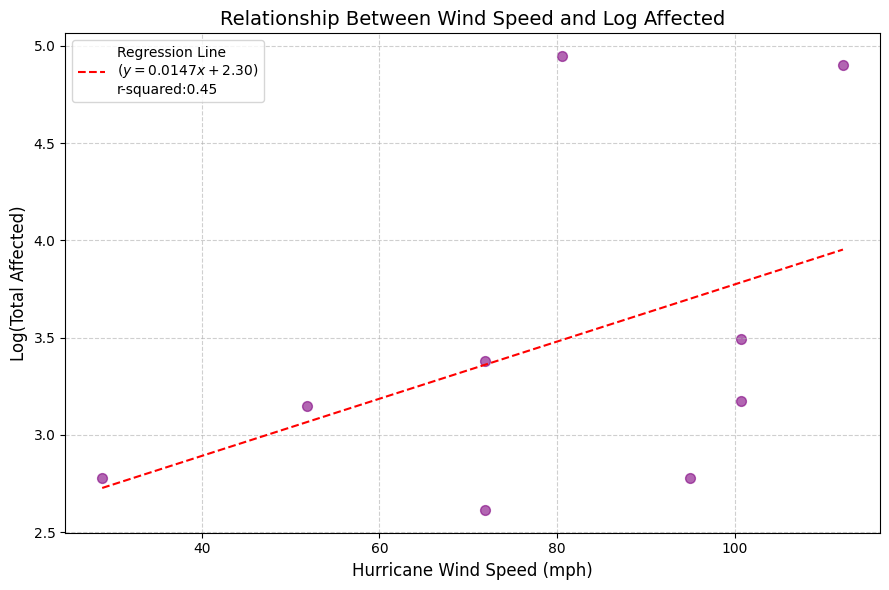

In [199]:
get_graphs_for_country('Republic of Korea', 'South Korea')

In [200]:
def US_state_analysis(state1):

    country1 = 'United States'

    STATES_URL = "https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip"
    country_gdf = gpd.read_file(STATES_URL)
    country_shape = country_gdf[country_gdf['NAME'] == state1].to_crs("EPSG:4326")
    country_geometry = gpd.GeoDataFrame(geometry=[country_shape.union_all()], crs=country_shape.crs)
    country_string = country1
    country_shape_proj = country_shape.to_crs("EPSG:3857")
    country_buffer_proj = country_shape_proj.geometry.buffer(BUFFER_DISTANCE_METERS)
    country_buffer_gdf = gpd.GeoDataFrame(geometry=country_buffer_proj, crs="EPSG:3857")
    country_buffer_gdf = country_buffer_gdf.to_crs("EPSG:4326").geometry.buffer(0)
    country_geometry_w_buffer = gpd.GeoDataFrame(
        geometry=[country_buffer_gdf.union_all()], 
        crs="EPSG:4326"
    )
    track_data = ds[['sid', 'time', 'lat', 'lon', 'usa_wind', 'usa_sshs']]
    track_data['usa_wind'] = track_data['usa_wind'] * MPH_TO_KNOTS
    track_df = track_data.to_dataframe().reset_index()
    track_df = track_df.dropna(subset=['lon', 'lat'])
    geometry = [
        Point(lon, lat) 
        for lon, lat in zip(track_df['lon'], track_df['lat'])
    ]
    TARGET_CRS = "EPSG:4326"
    storms_gdf = gpd.GeoDataFrame(track_df, geometry=geometry, crs=TARGET_CRS)
    storms_over_country_gdf = gpd.sjoin(
        storms_gdf, 
        # country_geometry, 
        country_geometry_w_buffer, 
        how="inner", 
        predicate="within"
    )
    storms_gdf['is_inside_country'] = storms_gdf.index.isin(storms_over_country_gdf.index)
    storms_pl_full = pl.from_pandas(storms_gdf.drop(columns=['geometry']))
    storms_pl_full = storms_pl_full.sort(["storm", "date_time"])
    storms_pl_with_lag = storms_pl_full.with_columns(
        pl.col('is_inside_country').shift(1).over('storm').alias('is_inside_country_prev'),
        pl.col('usa_sshs').alias('entry_sshs'),
        pl.col('usa_wind').alias('entry_wind')
    )
    entry_points = storms_pl_with_lag.filter(
        (pl.col('is_inside_country')) &
        (pl.col('is_inside_country_prev').not_())
    )
    max_intensity_entry = (
        entry_points
        .sort(['storm','entry_wind'], descending=True)
        .filter(pl.col('entry_wind').is_not_null())
        .unique('storm')
        .select('storm', 'date_time')
    )
    max_intensity_point_per_storm = (
        pl.from_pandas(storms_gdf.drop(columns=['geometry']))
        .drop('is_inside_country')
        .join(max_intensity_entry, on=['storm', 'date_time'])
        .filter(pl.col('time') >= pl.datetime(year=2000, month=1, day=1))
        .to_pandas()
    )
    geometry = [
        Point(lon, lat) 
        for lon, lat in zip(max_intensity_point_per_storm['lon'], max_intensity_point_per_storm['lat'])
    ]
    merge_point_before_country = (
        pl.DataFrame(max_intensity_point_per_storm)
        .select('storm','date_time','lon','lat', 'usa_wind', 'usa_sshs', 'time')
        .with_columns(
            pl.when(pl.col('date_time') != 0)
            .then(pl.col('date_time') - 1)
            .otherwise(pl.col('date_time'))
            .alias('date_time'),
        )
        .rename({'lon':'lon1', 'lat':'lat1', 'usa_wind':'usa_wind1', 'usa_sshs': 'usa_sshs1'})
        .join(pl.DataFrame(storms_gdf.drop(columns=['geometry', 'is_inside_country'])).drop('time'), on=['storm','date_time'], how='inner')
        .rename({'lon':'lon2', 'lat':'lat2', 'usa_wind':'usa_wind2', 'usa_sshs': 'usa_sshs2'})
        .with_columns(
            ((pl.col('lon1') + pl.col('lon2'))/2)
            .alias('lon'),
            ((pl.col('lat1') + pl.col('lat2'))/2)
            .alias('lat'),
            ((pl.col('usa_wind1') + pl.col('usa_wind2'))/2)
            .alias('usa_wind'),
            ((pl.col('usa_sshs1') + pl.col('usa_sshs2'))/2)
            .alias('usa_sshs'),
        )
        .drop('lon1','lon2','lat1','lat2','usa_wind1','usa_wind2','usa_sshs1','usa_sshs2')
    )
    country_cyclones_pandas = merge_point_before_country.to_pandas()
    geometry = [
        Point(lon, lat)
        for lon, lat in zip(country_cyclones_pandas['lon'],
                            country_cyclones_pandas['lat'])
    ]
    country_cyclones_gdf = gpd.GeoDataFrame(
        country_cyclones_pandas,
        geometry=geometry,
        crs="EPSG:4326"
    ).sort_values('usa_wind', ascending=True)
    country_cyclones_pl = pl.DataFrame(country_cyclones_gdf.drop(columns=['geometry']))

    x = mdates.date2num(country_cyclones_pandas[~country_cyclones_pandas['usa_wind'].isnull()].sort_values('time')['time'])
    y = country_cyclones_pandas[~country_cyclones_pandas['usa_wind'].isnull()].sort_values('time')['usa_wind']
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        x,
        y,
        alpha=0.6,
        s=50,
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')
    ax.set_xlabel('Date', fontsize=12)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    fig.autofmt_xdate() # Auto-rotate the date labels
    ax.set_ylabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_title(f'Max Wind Speed Over {state1} over Time', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()

    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    country_geometry.plot(
        ax=ax, 
        color='lightgreen',              # Fill color for the land
        edgecolor='darkgreen',           # Border color
        linewidth=1.5,
        zorder=1,
        alpha=0.3
    )
    country_cyclones_gdf.plot(
        ax=ax,
        marker='o',
        column=country_cyclones_gdf['usa_wind'],
        cmap='plasma',                   
        markersize=50,                  
        legend=True,
        legend_kwds={'label': "Wind Speed (mph)", 'orientation': "horizontal"},
        zorder=3
    )
    minx, miny, maxx, maxy = country_cyclones_gdf.total_bounds
    ax.set_xlim(minx - 2, maxx + 2)
    ax.set_ylim(miny - 2, maxy + 2)

    # Labeling
    ax.set_title(f"Storm Track Intensity Over {state1} (Color by Wind Speed)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.tight_layout()
    plt.show()

    list_of_storms = country_cyclones_pandas[country_cyclones_pandas['usa_wind'] > 0]['storm'].unique()
    mask = ds['storm'].isin(list_of_storms)
    ds_filtered = ds.where(mask, drop=True)
    track_data_vars = ['sid', 'time', 'lat', 'lon', 'usa_wind']
    track_df = ds_filtered[track_data_vars].to_dataframe().reset_index()
    track_df['sid'] = track_df['sid'].str.decode('utf-8')
    track_df['sid'] = pd.Series(track_df['sid'].tolist())
    track_df = track_df.sort_values(by=['sid', 'time']).reset_index(drop=True)
    # track_df = track_df.rename(columns={'sid': 'storm', 'time': 'date_time'})
    track_df = track_df.dropna(subset=['lon', 'lat', 'usa_wind'])
    geometry = [
        Point(lon, lat) 
        for lon, lat in zip(track_df['lon'], track_df['lat'])
    ]
    TARGET_CRS = "EPSG:4326"
    storms_gdf = gpd.GeoDataFrame(
        track_df, 
        geometry=geometry, 
        crs=TARGET_CRS
    )

    map_shape = country_gdf.to_crs("EPSG:4326")
    map_geometry = gpd.GeoDataFrame(
        geometry=[map_shape.union_all()], 
        crs=map_shape.crs
    )
    storms_gdf = storms_gdf.sort_values(by=['sid', 'time']) 

    lines_series = (
        storms_gdf.groupby('sid')['geometry']
        .agg(lambda x: LineString(x.tolist()) if len(x.tolist()) > 1 else None)
        .rename('geometry')
    )

    storms_lines_gdf = gpd.GeoDataFrame(lines_series)
    storms_lines_gdf = storms_lines_gdf.set_geometry('geometry', crs=storms_gdf.crs)
    country_wind_speeds = country_cyclones_pandas[['sid','usa_wind']].rename(columns={'usa_wind': 'max_storm_wind'})
    country_wind_speeds['sid'] = country_wind_speeds['sid'].str.decode('utf-8')
    country_wind_speeds['sid'] = pd.Series(country_wind_speeds['sid'].tolist())
    storms_lines_gdf = storms_lines_gdf.merge(country_wind_speeds, on='sid', how='left').sort_values('max_storm_wind', ascending=True)

    fig, ax = plt.subplots(1, 1, figsize=(12, 10))

    map_geometry.plot(ax=ax, color='lightgreen', edgecolor='darkgreen', linewidth=1.5, zorder=1, alpha=0.3)
    ax.set_xlim(-100, -50)
    ax.set_ylim(10, 40)
    ax.set_aspect('equal')

    storms_lines_gdf.plot(
        ax=ax,
        column='max_storm_wind', # Color the line by its max wind speed (the merged column)
        cmap='viridis', 
        legend=True,
        legend_kwds={'label': "Max Storm Wind Speed (mph)", 'orientation': "horizontal"},
        linewidth=2.0,
        linestyle='-',
        zorder=2
    )

    country_geometry.plot(
        ax=ax, 
        color='lightgreen',              # Fill color for the land
        edgecolor='darkgreen',           # Border color
        linewidth=1.5,
        zorder=5,
        alpha=0.9
    )
    ax.set_xlim(minx - 10, maxx + 10)
    ax.set_ylim(miny - 10, maxy + 10)
    ax.set_title(f"Storm Track Intensity Over {state1} (Color by Wind Speed)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.tight_layout()
    plt.show()

    country_disasters = (
        TC_analysis
        .filter(pl.col('Disaster Type') == 'Storm')
        .filter(pl.col('Country') == country_string)
    )
    relevant_storms = pl.DataFrame()
    country_disasters_deleted_missing = country_disasters.with_row_index("index")
    for i in range(len(country_disasters)):
        year_i = country_disasters[i].select('startyear').to_numpy()[0][0]
        month_i = country_disasters[i].select('startmonth').to_numpy()[0][0]
        day_i = country_disasters[i].select('startday').to_numpy()[0][0]
        estimate_flag = False
        if not day_i.is_integer():
            day_i = 15
            estiamte_flag = True
        relevant_storm_temp = (
            country_cyclones_pl
            .with_columns(
                (pl.datetime(year_i, month_i, day_i) - pl.col('time')).abs()
                .alias('time_diff'),
            )
            .with_columns(
                pl.when((pl.datetime(year_i, month_i, day_i) < pl.col('time')) &
                        (pl.col('time_diff') > pl.duration(weeks=1)) &
                        (estimate_flag == False))
                .then(True)
                .otherwise(False)
                .alias('delete_flag')
            )
            .filter(pl.col('delete_flag') == False)
            .sort('time_diff')
            
        )

        if len(relevant_storm_temp) > 0:
            relevant_storm = relevant_storm_temp[0]
            if len(relevant_storms) == 0:
                relevant_storms = relevant_storm
            else:
                relevant_storms = relevant_storms.vstack(relevant_storm)
        else:
            country_disasters_deleted_missing = (
                country_disasters_deleted_missing
                .filter(
                    pl.col("index") != i
                )
            )
    country_disasters_deleted_missing = country_disasters_deleted_missing.drop('index')
    country_disasters_w_storms = country_disasters_deleted_missing.hstack(relevant_storms).sort('storm')



    country_disasters_w_storms = (
        country_disasters_w_storms
        .filter(pl.col('time_diff').le(pl.duration(days=15)))
        .filter(pl.col('Total Damage').is_not_null()) # keep the interpolated value
        .with_columns(
            pl.when(pl.col('Total Affected').is_null())
            .then(0)
            .otherwise(pl.col('Total Affected'))
            .alias('Total Affected'),
            pl.when(pl.col('Total Deaths').is_null())
            .then(0)
            .otherwise(pl.col('Total Deaths'))
            .alias('Total Deaths'),
        )
    )
    country_disasters_w_storms_agg = (
        country_disasters_w_storms.group_by(
            ['time','sid','lon','lat','usa_wind','usa_sshs','time_diff', 'predicted_data_indicator']
        ).agg(pl.sum('Total Deaths'), pl.sum('Total Affected'), pl.sum('Total Damage'))
    )
    country_disasters_w_storms_agg = (
        country_disasters_w_storms_agg
        .with_columns(
            pl.when(pl.col('Total Deaths') == 0)
            .then(None)
            .otherwise(pl.col('Total Deaths'))
            .alias('Total Deaths'),
            pl.when(pl.col('Total Affected') == 0)
            .then(None)
            .otherwise(pl.col('Total Affected'))
            .alias('Total Affected'),
            pl.when(pl.col('Total Damage') == 0)
            .then(None)
            .otherwise(pl.col('Total Damage'))
            .alias('Total Damage'),
            pl.when(pl.col('Total Damage') == 0)
            .then(None)
            .otherwise(np.log10(pl.col('Total Damage')))
            .alias('Log Total Damage'),
            pl.when(pl.col('Total Deaths') == 0)
            .then(None)
            .otherwise(np.log10(pl.col('Total Deaths')))
            .alias('Log Total Deaths'),
            pl.when(pl.col('Total Affected') == 0)
            .then(None)
            .otherwise(np.log10(pl.col('Total Affected')))
            .alias('Log Total Affected'),
        )
    )

    geometry = [
        Point(lon, lat)
        for lon, lat in zip(country_disasters_w_storms_agg['lon'],
                            country_disasters_w_storms_agg['lat'])
    ]
    country_disasters_w_storms_gdf = gpd.GeoDataFrame(
        country_disasters_w_storms_agg.to_pandas(),
        geometry=geometry,
        crs="EPSG:4326"
    ).sort_values('Total Deaths', ascending=True)

    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    country_geometry.plot(
        ax=ax, 
        color='gray',              # Fill color for the land
        edgecolor='black',           # Border color
        linewidth=1.5,
        zorder=1,
        alpha=0.3
    )
    country_disasters_w_storms_gdf.plot(
        ax=ax,
        marker='o',
        column=country_disasters_w_storms_gdf['Log Total Damage'],
        cmap='plasma',                   
        markersize=50,                  
        legend=True,
        legend_kwds={'label': "Log Total Damage", 'orientation': "horizontal"},
        zorder=3
    )
    minx, miny, maxx, maxy = country_disasters_w_storms_gdf.total_bounds
    ax.set_xlim(minx - 2, maxx + 2)
    ax.set_ylim(miny - 2, maxy + 2)

    # Labeling
    ax.set_title(f"Storm Track Intensity Over {state1} (Color by Log Total Damage)", fontsize=14)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.tight_layout()
    plt.show()



    x = country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Damage'].isnull()].sort_values('usa_wind')['usa_wind']
    y = np.log10(country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Damage'].isnull()].sort_values('usa_wind')['Total Damage'])
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b
    # m, b, r_value, p_value, std_err = linregress(country_disasters_w_storms_gdf['usa_wind'],
    #                                              np.log10(country_disasters_w_storms_gdf['Total Damage']))
    # y_fit = m * country_disasters_w_storms_gdf['usa_wind'] + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        country_disasters_w_storms_gdf['usa_wind'],
        np.log10(country_disasters_w_storms_gdf['Total Damage']),
        alpha=0.6,
        s=50,
        c=country_disasters_w_storms_gdf['predicted_data_indicator'],
        cmap='viridis',
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')
    ax.set_xlabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_ylabel('Log(Total Damage)', fontsize=12)
    ax.set_title('Relationship Between Wind Speed and Log Damage \nData Source Indicator: Yellow = Predicted', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()

    x = country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Deaths'].isnull()].sort_values('usa_wind')['usa_wind']
    y = np.log10(country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Deaths'].isnull()].sort_values('usa_wind')['Total Deaths'])
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        country_disasters_w_storms_gdf['usa_wind'],
        country_disasters_w_storms_gdf['Log Total Deaths'],
        alpha=0.6,
        s=50,
        color='purple'
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')

    ax.set_xlabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_ylabel('Log(Total Deaths)', fontsize=12)
    ax.set_title('Relationship Between Wind Speed and Log Total Deaths', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()



    x = country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Affected'].isnull()].sort_values('usa_wind')['usa_wind']
    y = np.log10(country_disasters_w_storms_gdf[~country_disasters_w_storms_gdf['Total Affected'].isnull()].sort_values('usa_wind')['Total Affected'])
    m, b, r_value, p_value, std_err = linregress(x, y)
    y_fit = m * x + b

    fig, ax = plt.subplots(figsize=(9, 6))

    ax.scatter(
        country_disasters_w_storms_gdf['usa_wind'],
        country_disasters_w_storms_gdf['Log Total Affected'],
        alpha=0.6,
        s=50,
        color='purple'
    )
    ax.plot(x, y_fit, color='red', linestyle='--', 
        label=f'Regression Line\n($y = {m:.4f}x + {b:.2f}$)\nr-squared:{r_value:.2f}')

    ax.set_xlabel('Hurricane Wind Speed (mph)', fontsize=12)
    ax.set_ylabel('Log(Total Affected)', fontsize=12)
    ax.set_title('Relationship Between Wind Speed and Log Affected', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    ax.legend()

    plt.tight_layout()
    plt.show()


## Florida

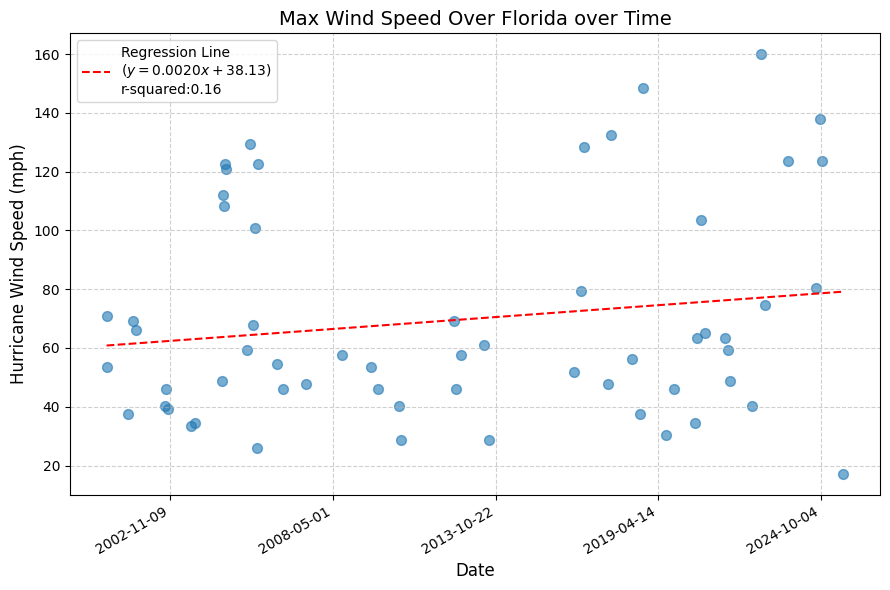

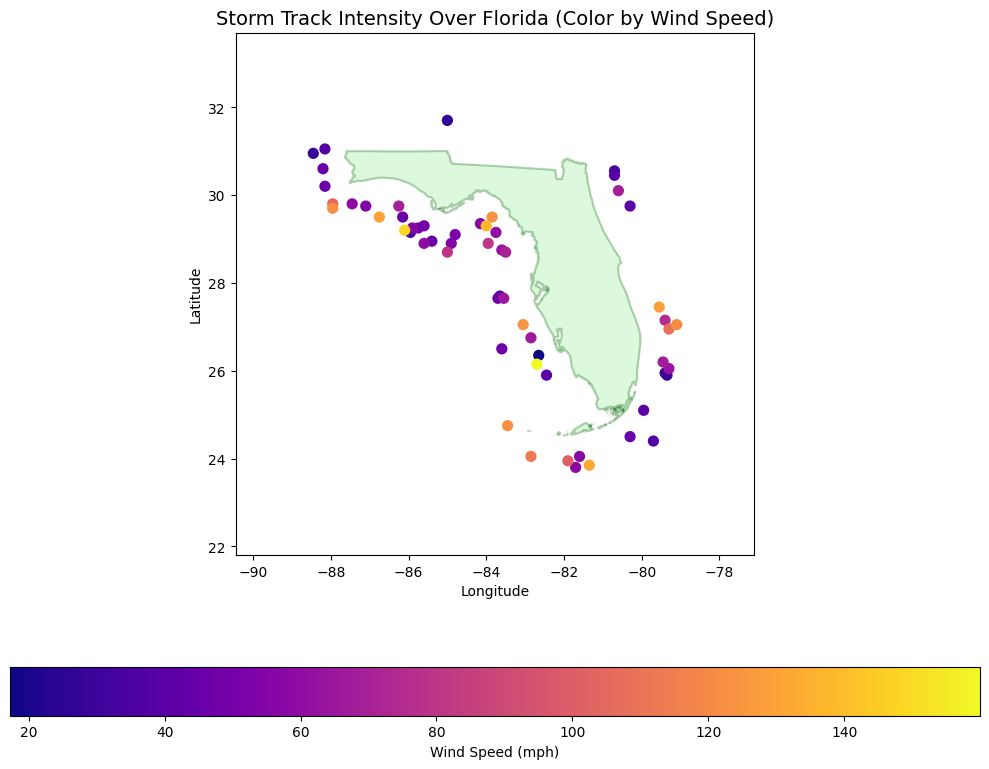

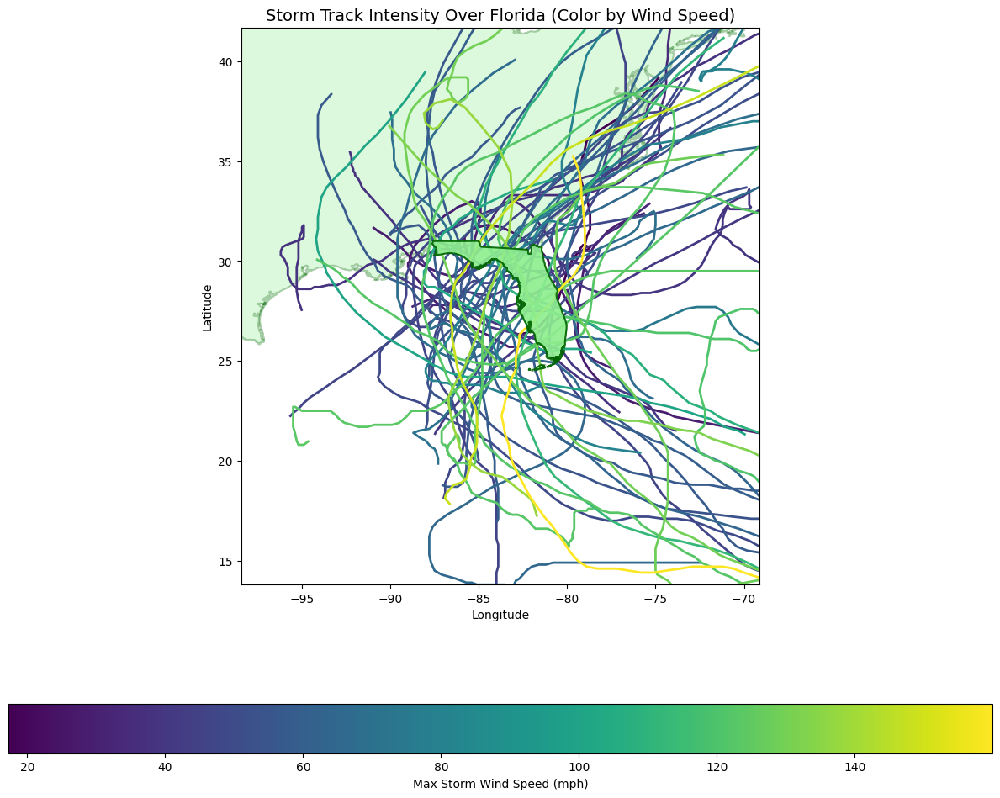

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


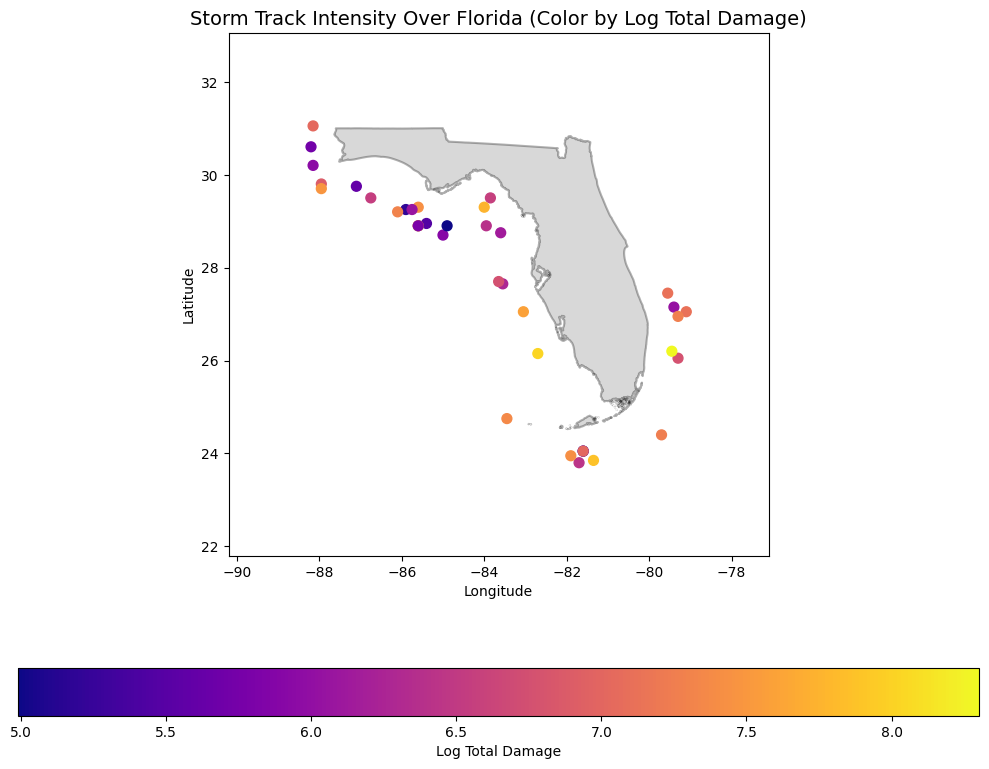

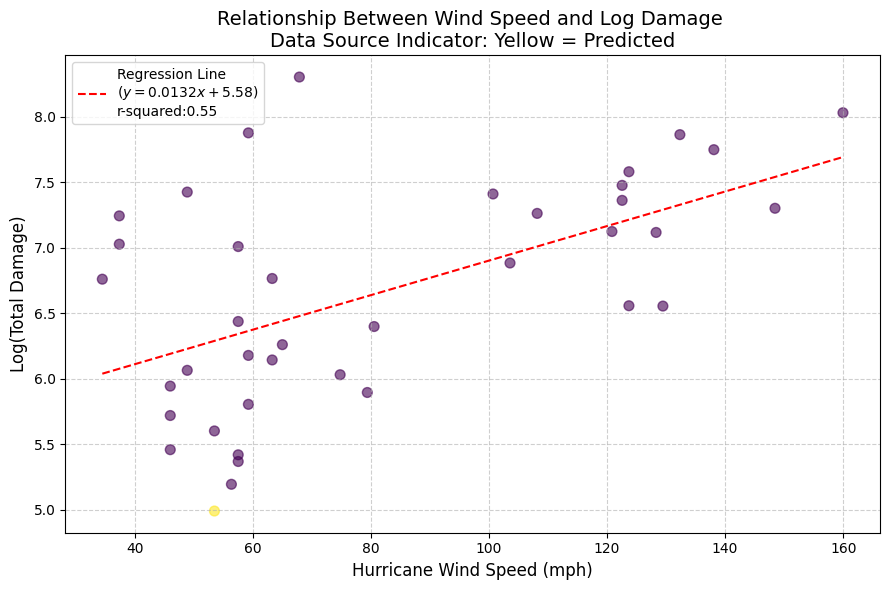

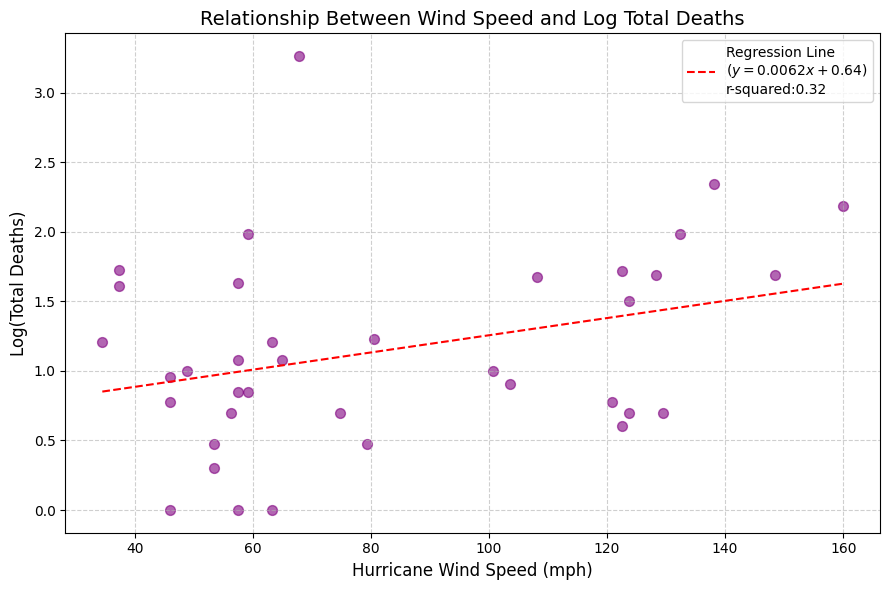

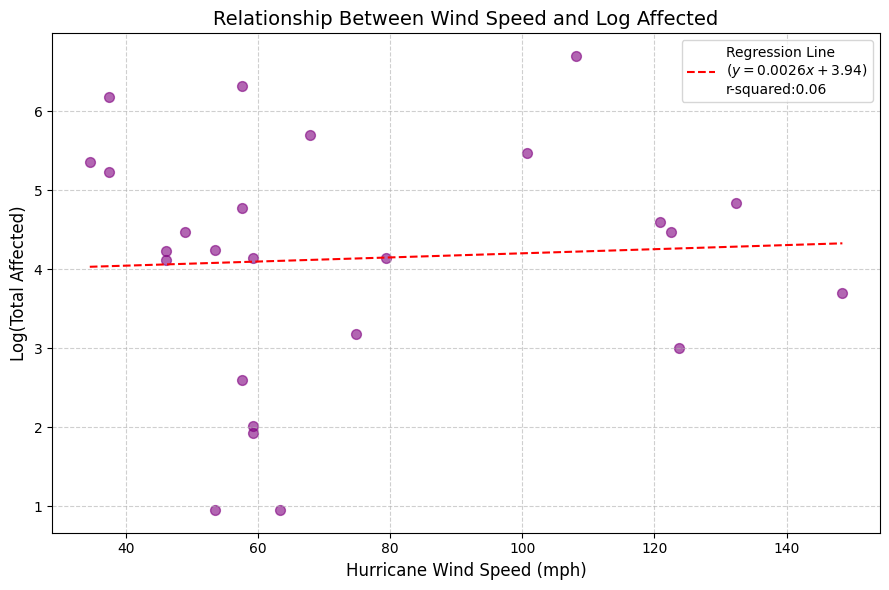

In [201]:
US_state_analysis('Florida')

## Texas

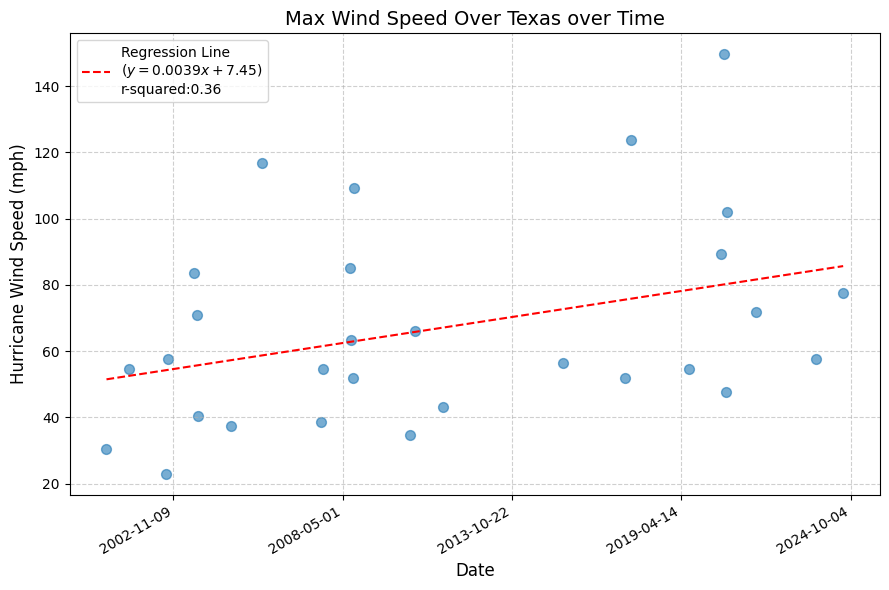

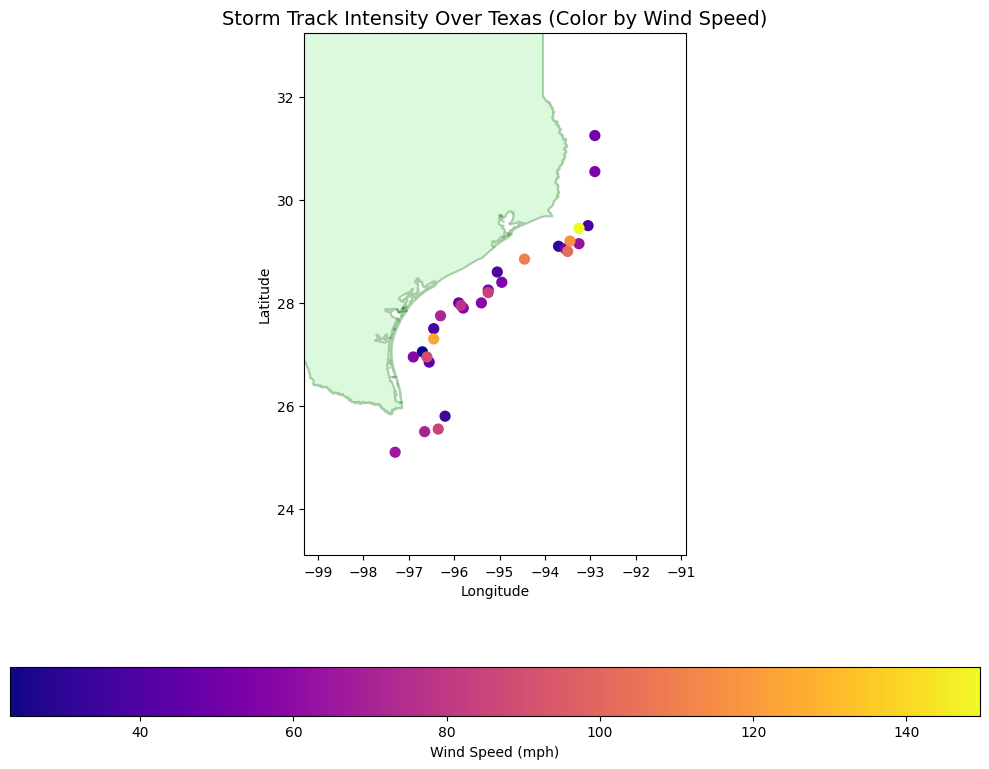

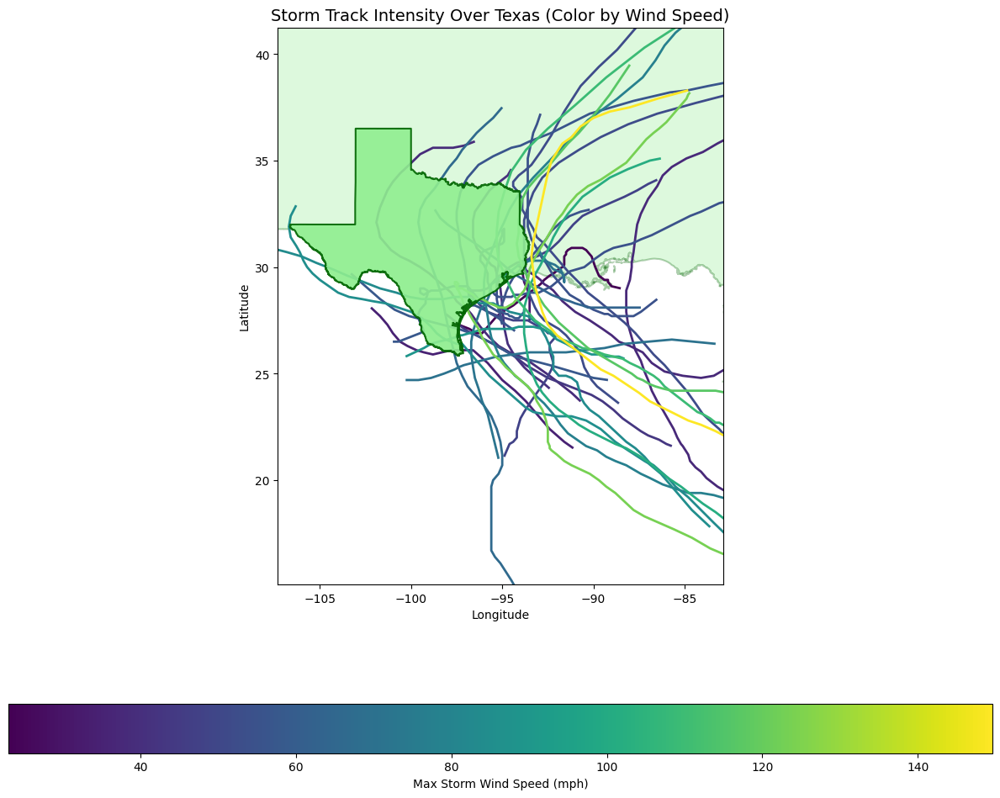

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


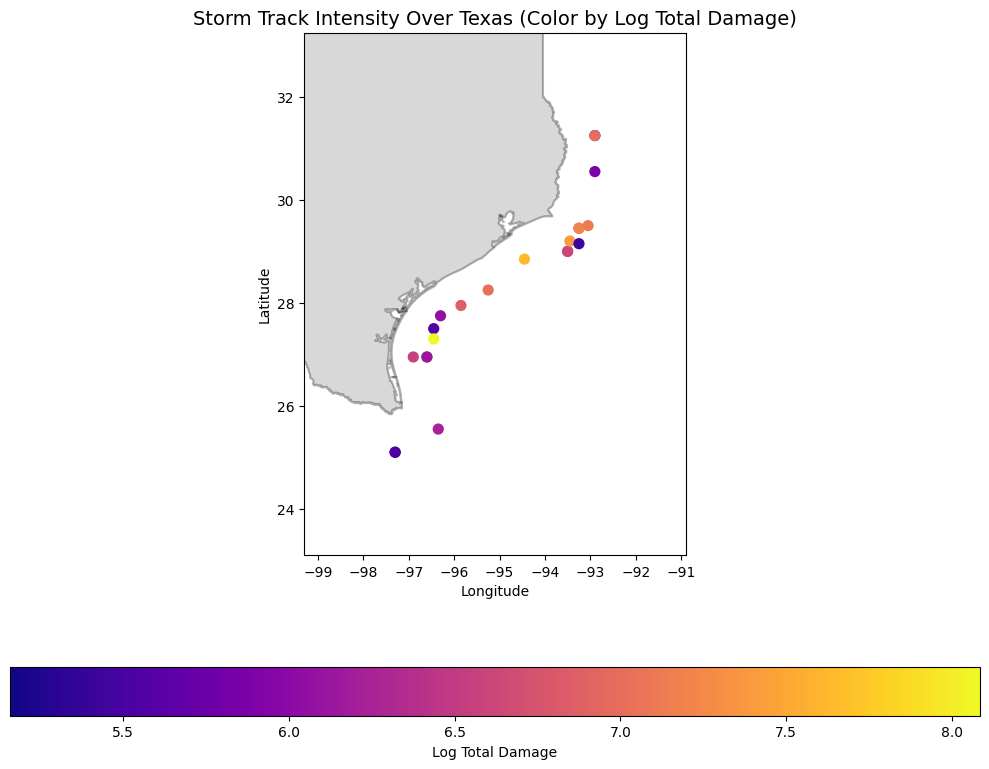

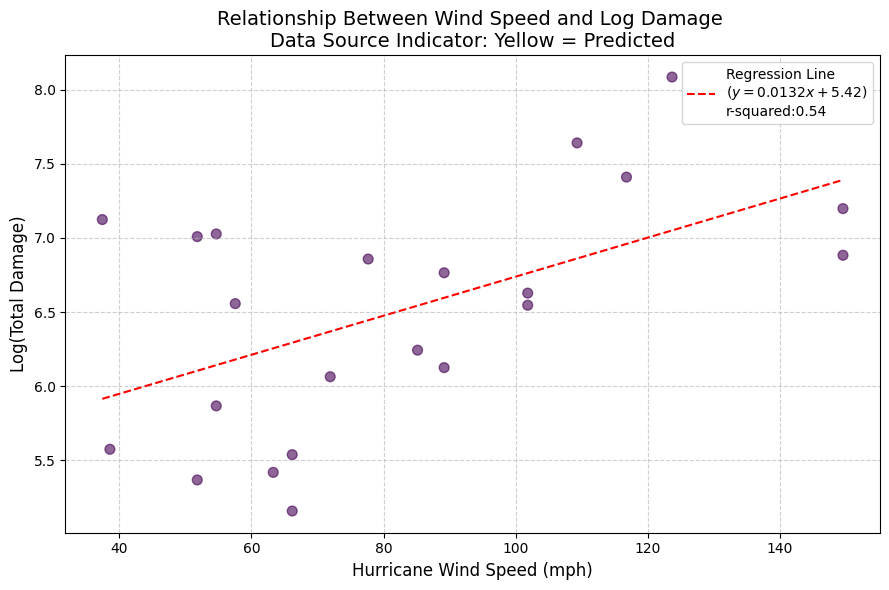

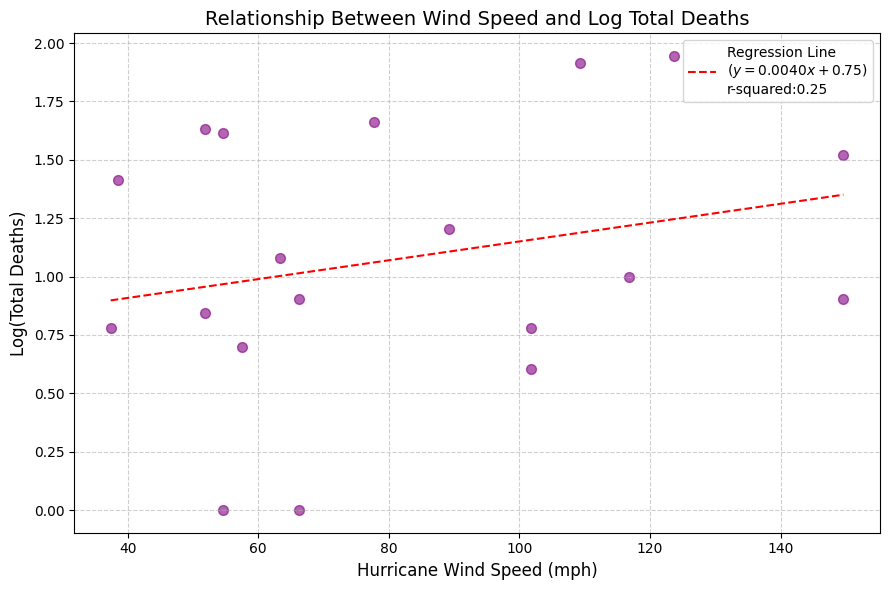

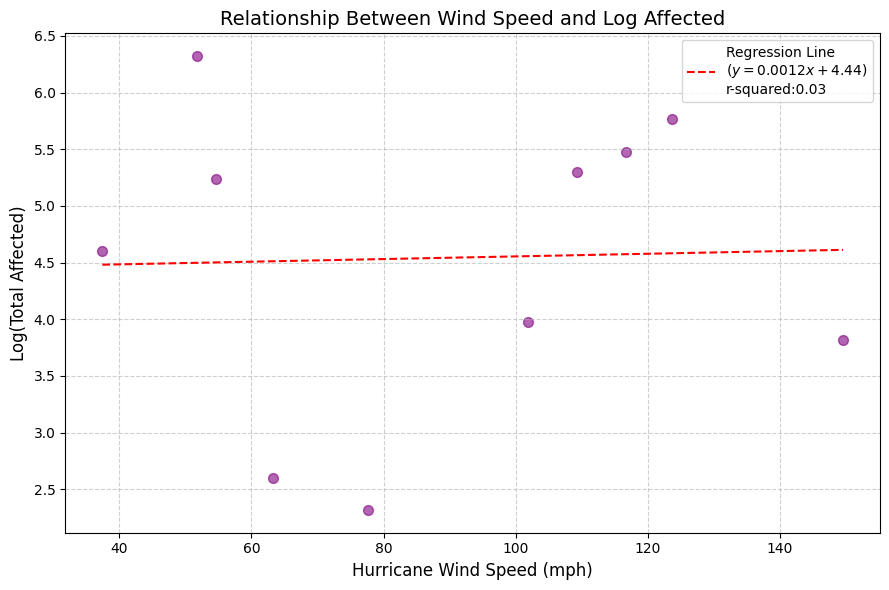

In [202]:
US_state_analysis('Texas')

## Puerto Rico

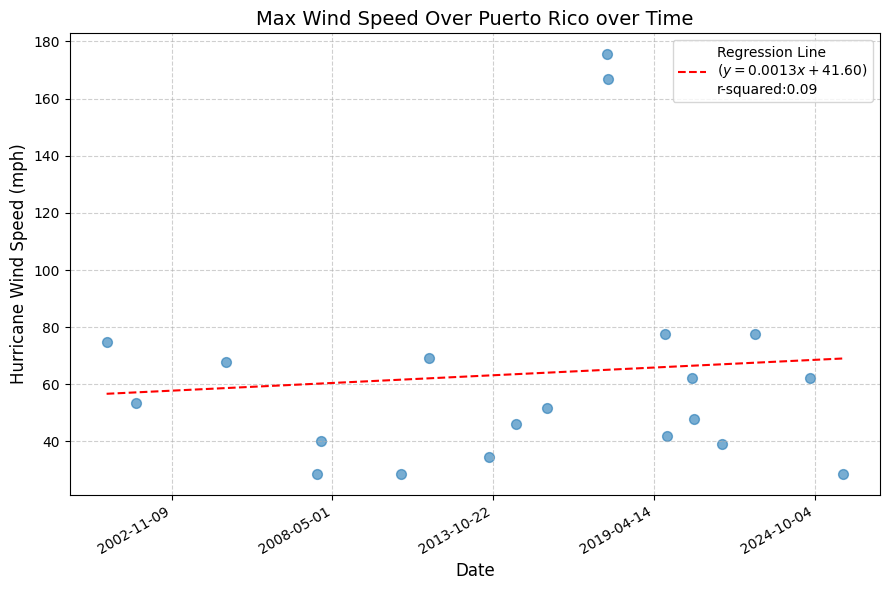

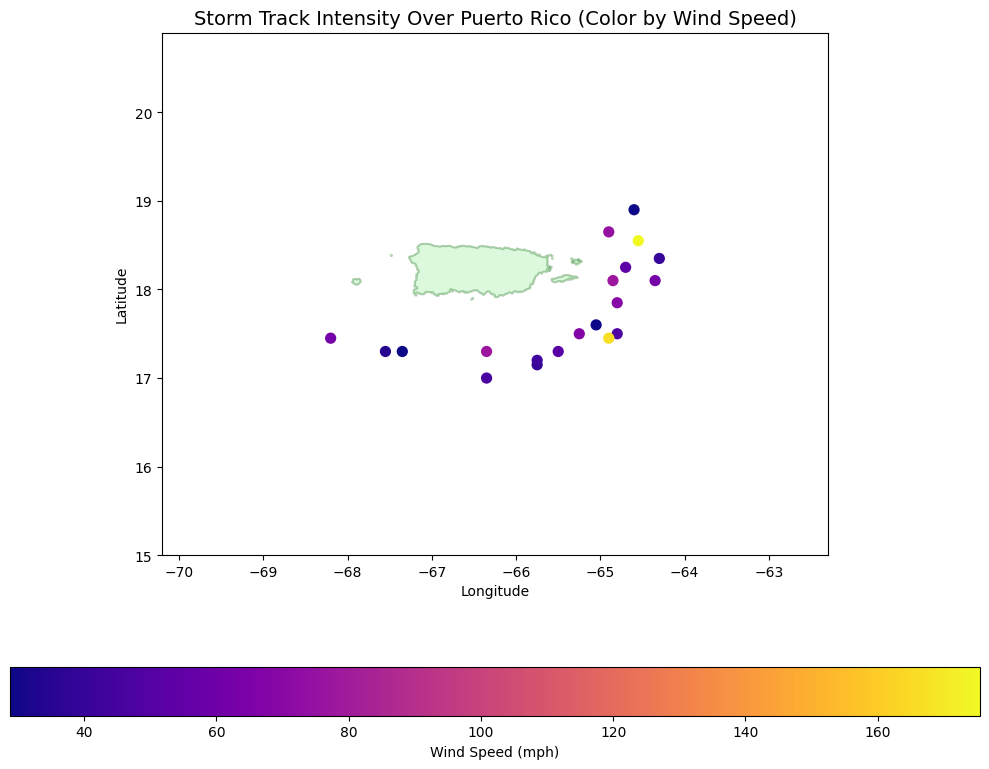

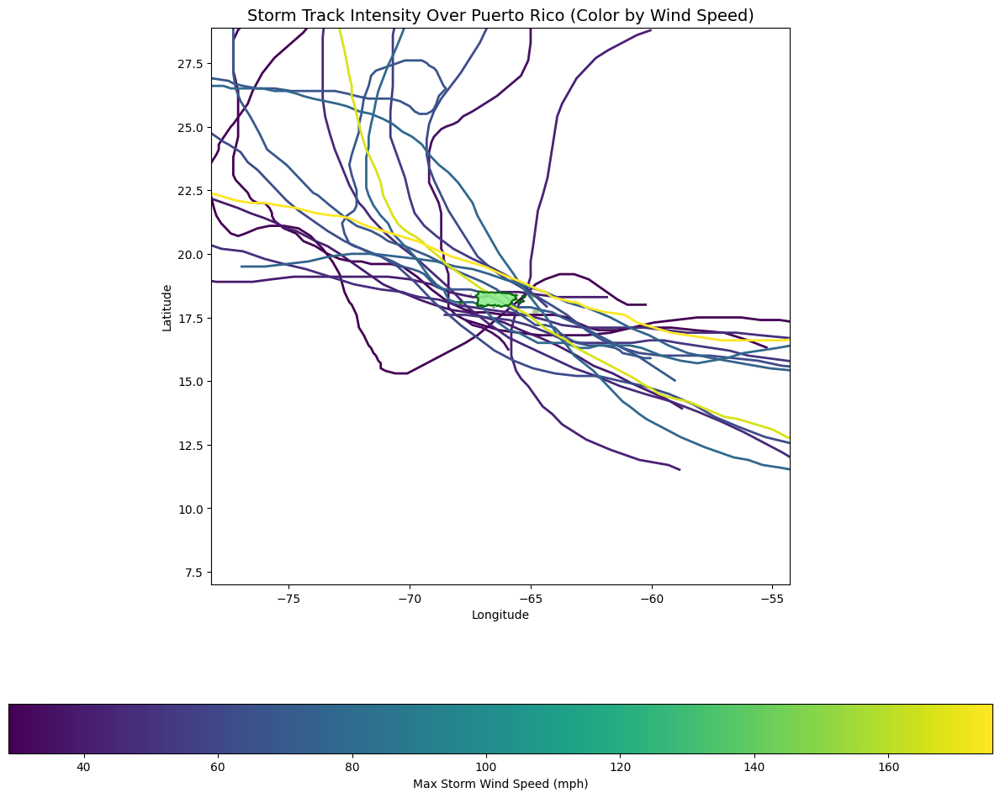

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


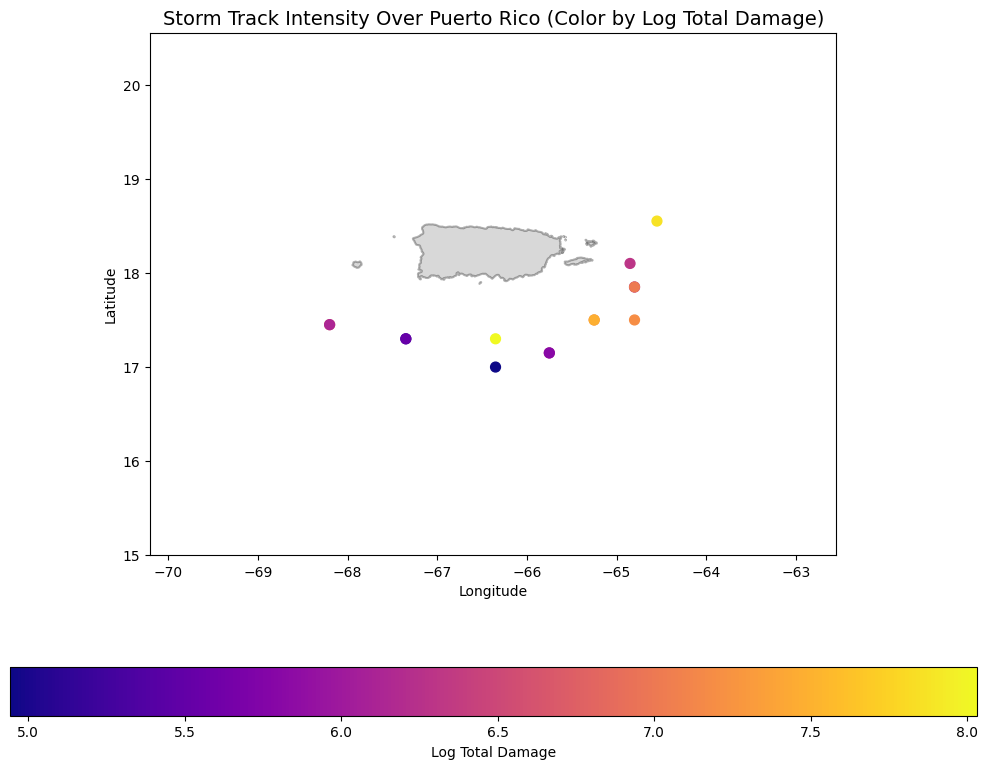

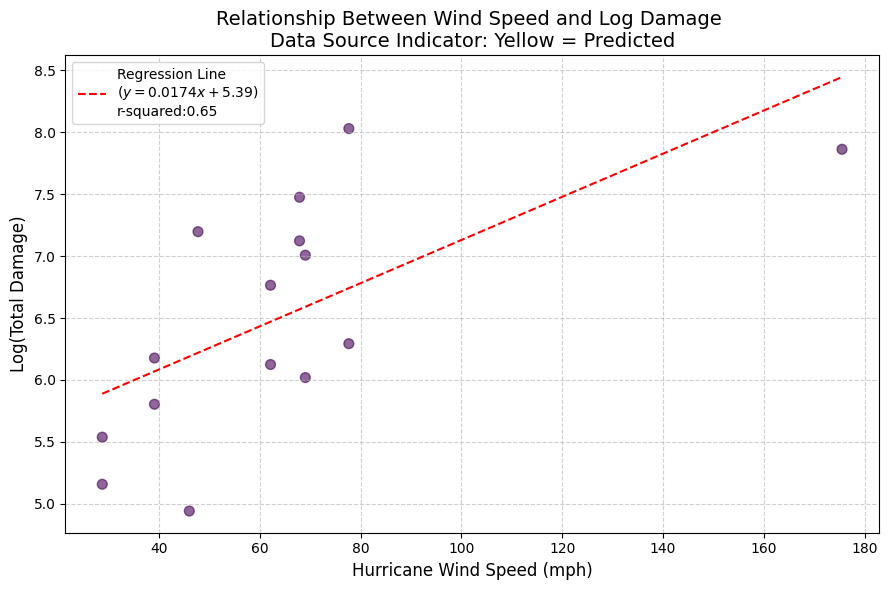

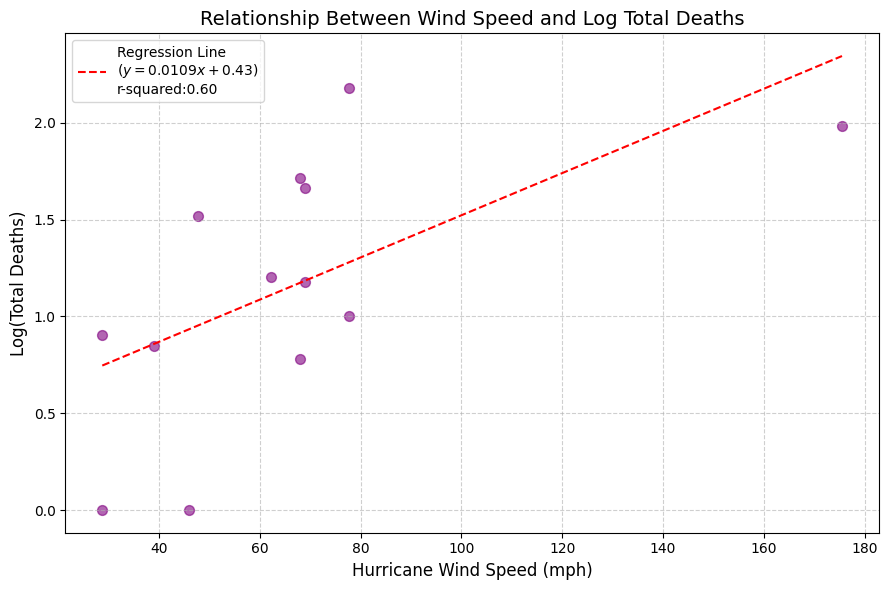

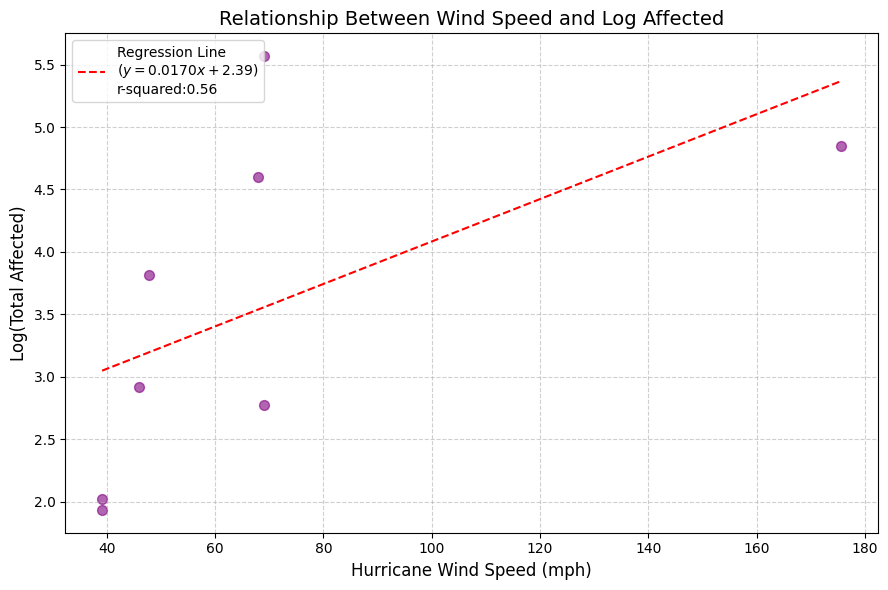

In [203]:
US_state_analysis('Puerto Rico')

## Louisiana

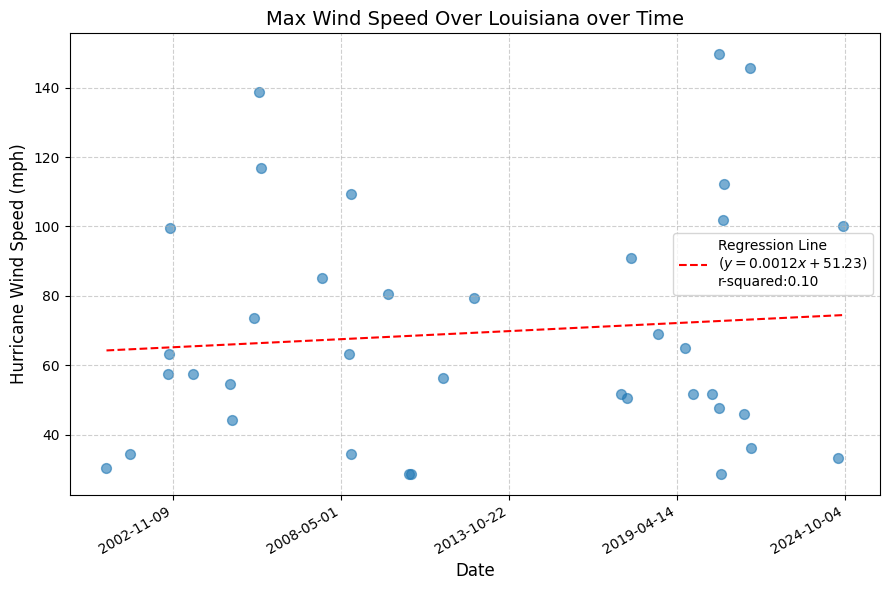

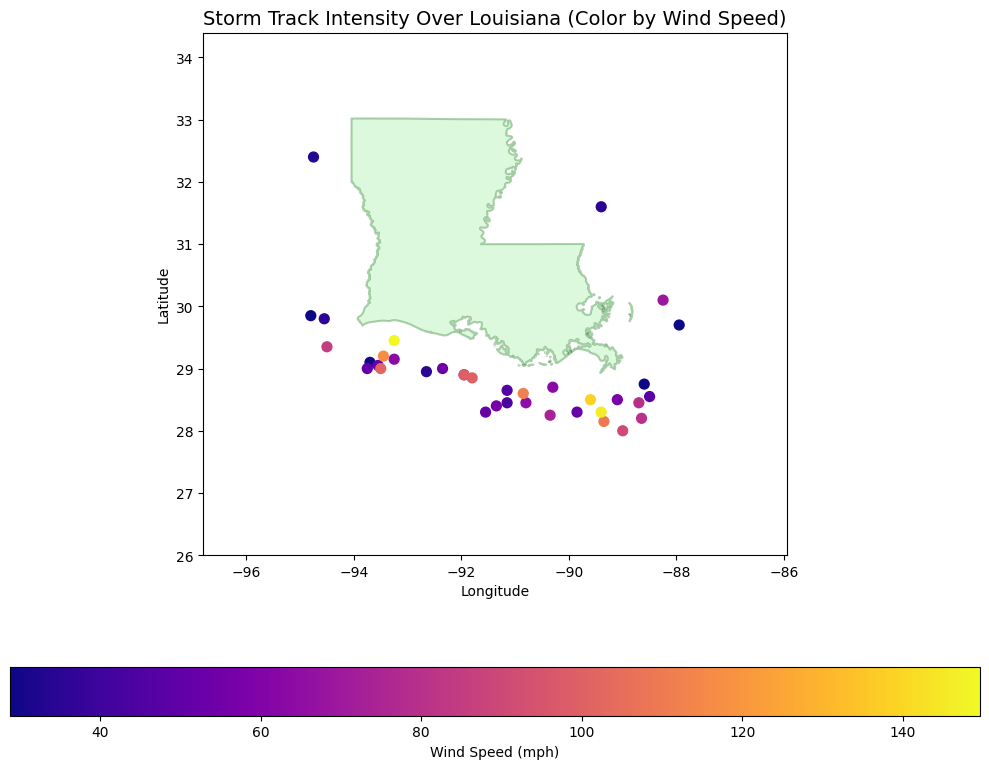

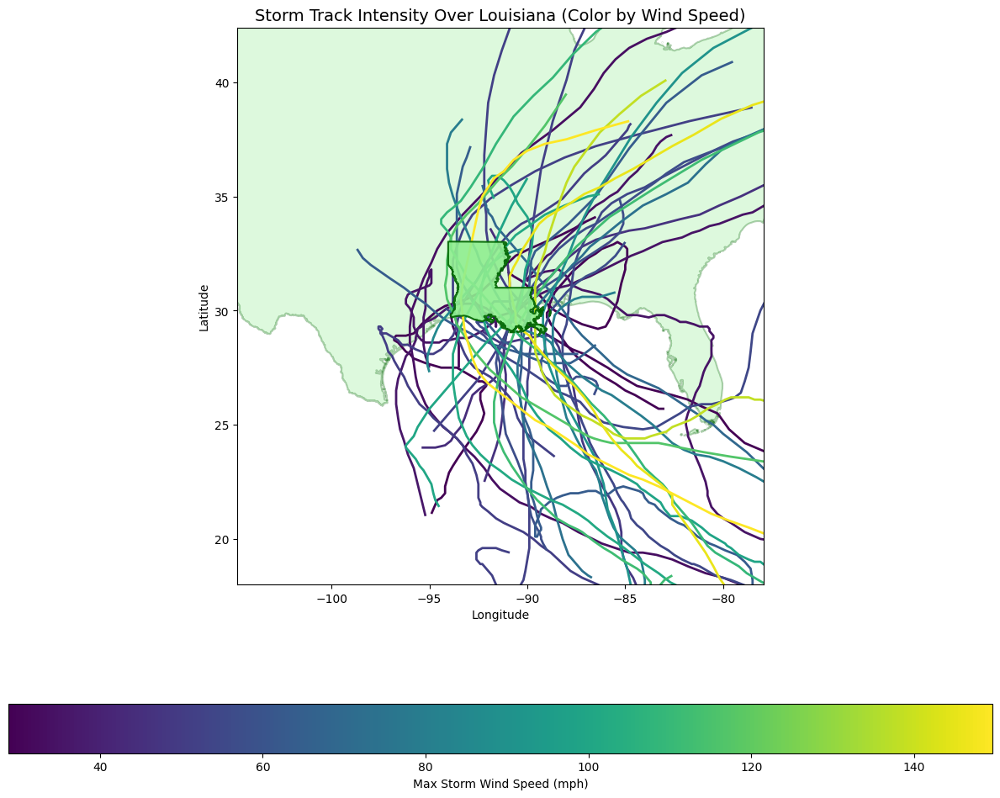

c:\Users\cardi\OneDrive - University of Illinois - Urbana\ATMS 596 Non-Thesis Research\Git\ATMS_596\.venv\Lib\site-packages\polars\series\series.py:1561: RuntimeWarning: divide by zero encountered in log10
  lambda out: ufunc(*args, out=out, dtype=dtype_char, **kwargs),


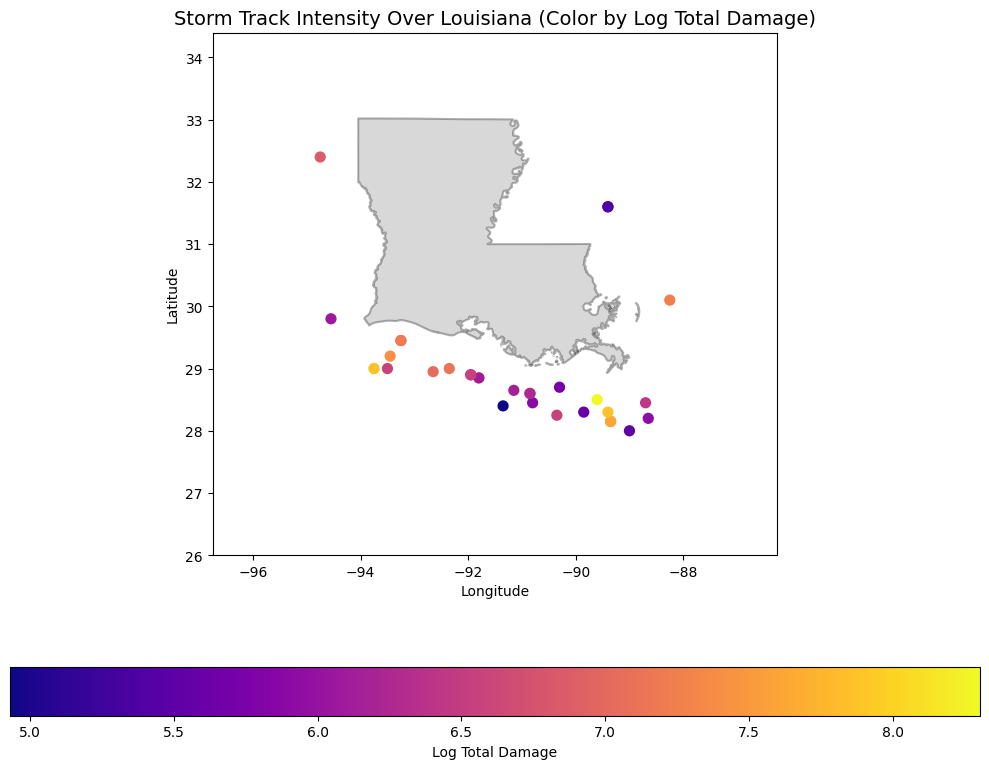

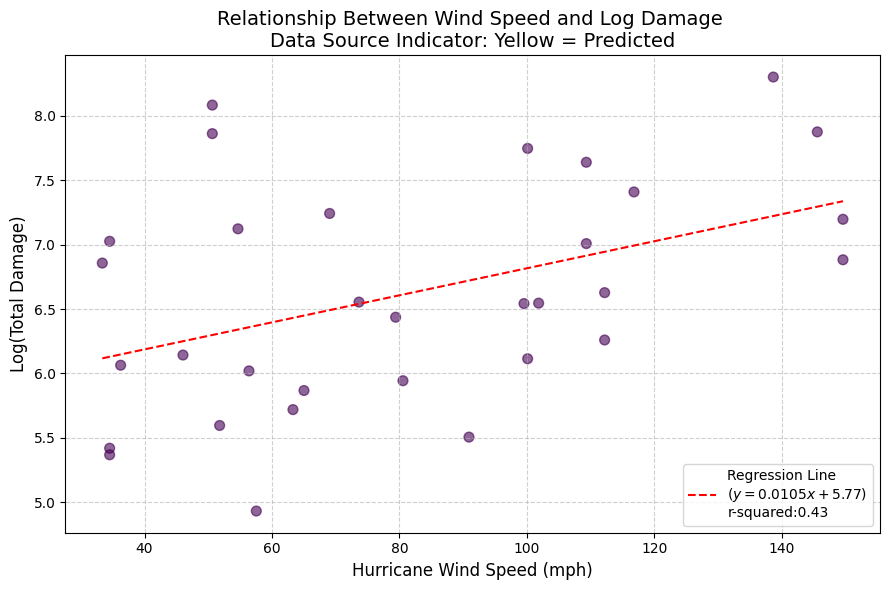

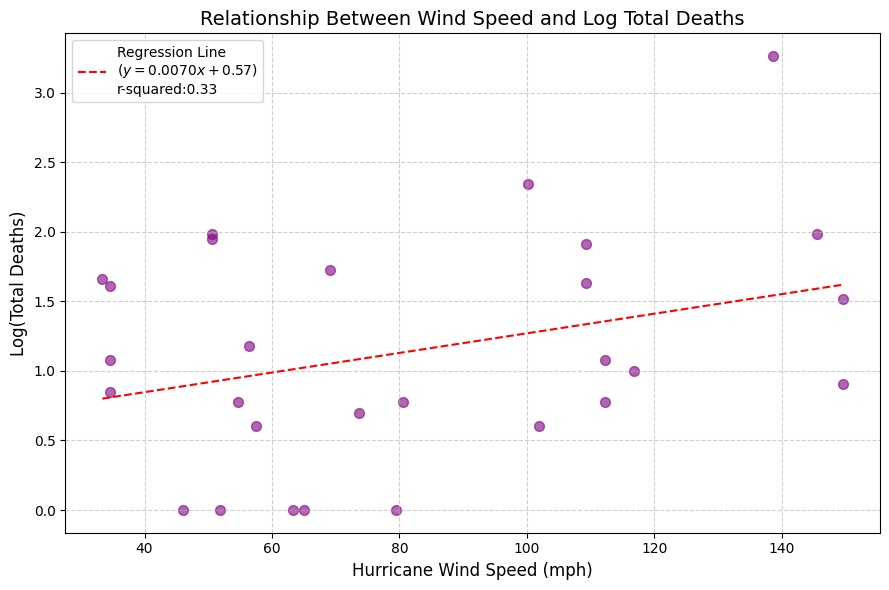

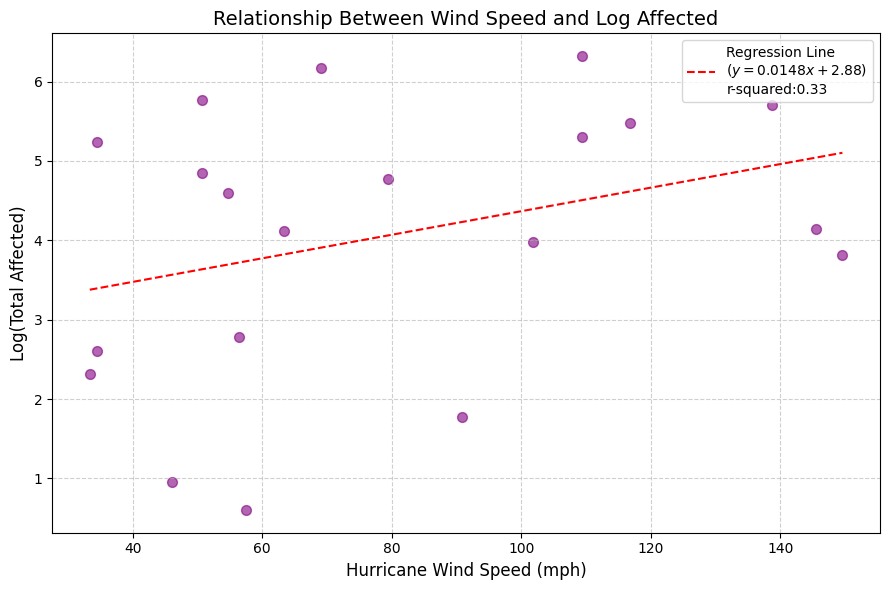

In [204]:
US_state_analysis('Louisiana')